<a href="https://colab.research.google.com/github/niteesh19mt0250/Zamato-Resturant-Clustering-and-Sentiment-Analysis/blob/main/Zamato_Resturant_Clustering_and_Sentiment_Analysis_(Niteesh).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**: Zamato Resturant Clustering and Sentiment Analysis


##### **Project Type**    - Unsupervised
##### **Contribution**    - Individual

# **Project Summary -**

This project related to **Zamato Restaurant Clustering and Sentiment Analysis** which is generally deal with the utilization of advanced data analytics techniques to gain a deeper understanding of the restaurants and customer feedback on the popular online food delivery platform, Zomato.The restaurant data includes information about the 'Name', 'Links', 'Cost', 'Collections', 'Cuisines' and 'Timings' of the reaturant and review data contains the information about the review having feature 'Restaurant', 'Reviewer', 'Review', 'Rating', 'Metadata', 'Time'and 'Pictures'.the work flow devided into several part i.e. data collection, data cleaning and manuplation , Explatory Data Analysis(EDA),feature engineering and finally model implemantation.

After understanding the data and getting variables, we first collected and clean the data, and handled the null values and finally for getting better results that we have also typecasted the needed features into required format in order to visualize them properly. We performed indepth EDA plotted different types of graphs by separating them into univariate, bivariate and multivariate categories and we collecting many good insights from it that helped us to make future decisions of ML model implementation.

The next step in the project was the implementation of clustering on the restaurant data through the use of the k-means algorithm. The objective of the clustering was to group similar restaurants together and discern patterns within the data. The features employed for the clustering process included the restaurant's location, cuisines, and average cost for two. The number of clusters was determined by utilizing the elbow method.

I then proceeded to conduct sentiment analysis on the user reviews to gain a comprehensive understanding of the overall sentiment towards the restaurants. Certain libraries were utilized to classify the reviews as positive, negative, or neutral. Additionally, I extracted the most recurrent words utilized in the reviews and visualized them through the creation of word clouds.

The outcome of the analysis revealed that the restaurants within the city were grouped into five clusters based on their location, cuisines, and average cost for two. The sentiment analysis uncovered that, generally, customers held a positive sentiment towards the restaurants.

In conclusion, this project exemplifies the utility of clustering and sentiment analysis in gaining a more profound comprehension of restaurant data on Zomato. The insights procured from the analysis can be of immense benefit to both restaurants and customers in making informed decisions. Furthermore, the project can be extended to other cities or even countries to gain insight into the eating habits and preferences of individuals in different regions.

# **GitHub Link -**

https://github.com/niteesh19mt0250/Zamato-Resturant-Clustering-and-Sentiment-Analysis/blob/main/Copy_of_Sample_ML_Submission_Template.ipynb

# **Problem Statement**


Zamato is an Indian Restaurant aggregator and food delivery start-up founded by Deepinder Goyal and Pankaj Chaddah in 2008. Zamato provides information, menus and user-reviews of restaurant, and also has food delivery options from partner restaurants in select cities. India is quite famous for it's multi cuisine available in large number of restaurant and hotel resorts, which is reminiscent of unity in deversity. Restaurant business in India is always evolving. More indians are warming up to the idea of eating restaurant food wheather by dining outside or getting food delivered. The growing number of restaurants in every state of India has been a motivation to inspect the data to get some insights, intersting facts and figures about the Indian food industry in each city. So, this project famous on analysising the zamato restaurant data for each city in India.

This project famous on customer and company, you have to analyze the sentiments of the review given by the customer in the data and make some usefull conclusions in the form of the visualizations. Also, customer the zamato restaurants into different segments. The data is vizualized as it becomes easy to analyse data at restaurant. The analysis also solves some of the business cases that can directly help the customers finding the best restaurant in their locality and for the company to grow up and works on the fields they are currently lagging in. This could help in clustering the restaurants segments, also the data has valuable information around cuisine and costing which can be used in cost v/s benfit analysis data could be used for sentiment analysis. Also, the metadata of reviewers can be used for identifying the critics in the industry.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [17]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import missingno as msn
!pip install ipython_Autotime
%load_ext autotime
import datetime as dt
# Install and import LDA
!pip install pyLDAvis
from sklearn.decomposition import LatentDirichletAllocation
from gensim import corpora
from gensim.models import LdaModel
from gensim.utils import simple_preprocess


The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 31.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 46.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 341.8/341.8 kB 21.1 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.22.4
    Uninstalling numpy-1.22.4:
      Successfully uninstalled numpy-1.22.4
  Attempting uninstall: pandas
    Found existing installation: pandas 1.5.3
    Uninstalling pandas-1.5.3:
      Successfully uninstalled pandas-1.5.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires pandas==1.5.3, but you have pandas 2.0.3 which is incompatible.
numba 0.56.4 requires num

time: 41.7 s (started: 2023-08-05 20:02:16 +00:00)


### Dataset Loading

In [18]:
# Import google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
time: 8.89 s (started: 2023-08-05 20:02:58 +00:00)


In [19]:
# Load Dataset
df_restaurant = pd.read_csv('/content/drive/MyDrive/Project /Unsupervised Learning/Zomato Restaurant names and Metadata.csv')
df_review = pd.read_csv('/content/drive/MyDrive/Project /Unsupervised Learning/Zomato Restaurant reviews.csv')

time: 161 ms (started: 2023-08-05 20:03:07 +00:00)


### Dataset First View

In [20]:
# Dataset First Look top 5 of zamato resturant name
df_restaurant.head()

,Name,Links,Cost,Collections,Cuisines,Timings
0,Beyond Flavours,https://www.zomato.com/hyderabad/beyond-flavou...,800,"Food Hygiene Rated Restaurants in Hyderabad, C...","Chinese, Continental, Kebab, European, South I...","12noon to 3:30pm, 6:30pm to 11:30pm (Mon-Sun)"
1,Paradise,https://www.zomato.com/hyderabad/paradise-gach...,800,Hyderabad's Hottest,"Biryani, North Indian, Chinese",11 AM to 11 PM
2,Flechazo,https://www.zomato.com/hyderabad/flechazo-gach...,"1,300","Great Buffets, Hyderabad's Hottest","Asian, Mediterranean, North Indian, Desserts","11:30 AM to 4:30 PM, 6:30 PM to 11 PM"
3,Shah Ghouse Hotel & Restaurant,https://www.zomato.com/hyderabad/shah-ghouse-h...,800,Late Night Restaurants,"Biryani, North Indian, Chinese, Seafood, Bever...",12 Noon to 2 AM
4,Over The Moon Brew Company,https://www.zomato.com/hyderabad/over-the-moon...,"1,200","Best Bars & Pubs, Food Hygiene Rated Restauran...","Asian, Continental, North Indian, Chinese, Med...","12noon to 11pm (Mon, Tue, Wed, Thu, Sun), 12no..."


time: 20.7 ms (started: 2023-08-05 20:03:07 +00:00)


In [21]:
# Dataset First Look bottom 5 of zamato resturant name
df_restaurant.tail()

,Name,Links,Cost,Collections,Cuisines,Timings
100,IndiBlaze,https://www.zomato.com/hyderabad/indiblaze-gac...,600,NaN,"Fast Food, Salad",11 AM to 11 PM
101,Sweet Basket,https://www.zomato.com/hyderabad/sweet-basket-...,200,NaN,"Bakery, Mithai","10 AM to 10 PM (Mon-Thu), 8 AM to 10:30 PM (Fr..."
102,Angaara Counts 3,https://www.zomato.com/hyderabad/angaara-count...,500,NaN,"North Indian, Biryani, Chinese",12 Noon to 11 PM
103,Wich Please,https://www.zomato.com/hyderabad/wich-please-1...,250,NaN,Fast Food,8am to 12:30AM (Mon-Sun)
104,Republic Of Noodles - Lemon Tree Hotel,https://www.zomato.com/hyderabad/republic-of-n...,"1,700",Pan-Asian Delicacies,"Thai, Asian, Chinese, Malaysian","11:30 AM to 3 PM, 7 PM to 12 Midnight"


time: 14.1 ms (started: 2023-08-05 20:03:07 +00:00)


In [22]:
# Dataset First Look top 5 of zamato resturant review
df_review.head()

,Restaurant,Reviewer,Review,Rating,Metadata,Time,Pictures
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . h...",5,"1 Review , 2 Followers",5/25/2019 15:54,0
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. S...,5,"3 Reviews , 2 Followers",5/25/2019 14:20,0
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx f...,5,"2 Reviews , 3 Followers",5/24/2019 22:54,0
3,Beyond Flavours,Swapnil Sarkar,Soumen das and Arun was a great guy. Only beca...,5,"1 Review , 1 Follower",5/24/2019 22:11,0
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and ba...,5,"3 Reviews , 2 Followers",5/24/2019 21:37,0


time: 26.6 ms (started: 2023-08-05 20:03:07 +00:00)


In [23]:
# Dataset First Look bottom 5 of zamato resturant review
df_review.tail()

,Restaurant,Reviewer,Review,Rating,Metadata,Time,Pictures
9995,Chinese Pavilion,Abhishek Mahajan,Madhumathi Mahajan Well to start with nice cou...,3,"53 Reviews , 54 Followers",6/5/2016 0:08,0
9996,Chinese Pavilion,Sharad Agrawal,This place has never disappointed us.. The foo...,4.5,"2 Reviews , 53 Followers",6/4/2016 22:01,0
9997,Chinese Pavilion,Ramandeep,"Bad rating is mainly because of ""Chicken Bone ...",1.5,"65 Reviews , 423 Followers",6/3/2016 10:37,3
9998,Chinese Pavilion,Nayana Shanbhag,I personally love and prefer Chinese Food. Had...,4,"13 Reviews , 144 Followers",5/31/2016 17:22,0
9999,Chinese Pavilion,Bhargava Krishna,Checked in here to try some delicious chinese ...,3.5,"472 Reviews , 1302 Followers",5/31/2016 16:41,6


time: 22.7 ms (started: 2023-08-05 20:03:07 +00:00)


### Dataset Rows & Columns count

In [24]:
# Dataset Rows & Columns count of zamato resturant name
print(f'Number of rows in the dataset: {df_restaurant.shape[0]} \n Number of columns in the dataset: {df_restaurant.shape[1]}')

Number of rows in the dataset: 105 
 Number of columns in the dataset: 6
time: 3.96 ms (started: 2023-08-05 20:03:07 +00:00)


In [25]:
# Dataset Rows & Columns count of zamato resturant review
print(f'Number of rows in the dataset: {df_review.shape[0]} \n Number of columns in the dataset: {df_review.shape[1]}')

Number of rows in the dataset: 10000 
 Number of columns in the dataset: 7
time: 2.08 ms (started: 2023-08-05 20:03:07 +00:00)


### Dataset Information

In [26]:
# Dataset Info of zamato restaurant name
df_restaurant.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105 entries, 0 to 104
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Name         105 non-null    object
 1   Links        105 non-null    object
 2   Cost         105 non-null    object
 3   Collections  51 non-null     object
 4   Cuisines     105 non-null    object
 5   Timings      104 non-null    object
dtypes: object(6)
memory usage: 5.0+ KB
time: 23.6 ms (started: 2023-08-05 20:03:07 +00:00)


In [27]:
# Dataset Info of zamato restaurant review
df_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Restaurant  10000 non-null  object
 1   Reviewer    9962 non-null   object
 2   Review      9955 non-null   object
 3   Rating      9962 non-null   object
 4   Metadata    9962 non-null   object
 5   Time        9962 non-null   object
 6   Pictures    10000 non-null  int64 
dtypes: int64(1), object(6)
memory usage: 547.0+ KB
time: 47.5 ms (started: 2023-08-05 20:03:07 +00:00)


### Duplicate Values

In [28]:
# Dataset Duplicate Value Count in Zamato restaurant name dataset
print('Total number of duplicted value present in the zamato resturent name dataset:',df_restaurant.duplicated().sum())

Total number of duplicted value present in the zamato resturent name dataset: 0
time: 4.84 ms (started: 2023-08-05 20:03:07 +00:00)


In [29]:
# Dataset Duplicate Value Count in Zamato restaurant review dataset
print('Total number of duplicted value present in the zamato resturent review dataset:',df_review.duplicated().sum())

Total number of duplicted value present in the zamato resturent review dataset: 36
time: 39.7 ms (started: 2023-08-05 20:03:07 +00:00)


### Missing Values/Null Values

In [30]:
# Defining the missing function which the missing value description and bar plot of the missing value
def missing_func(df):
  missing_value = df.isnull().sum()
  percentage_of_missing_value = df.isnull().sum()*100/(df.shape[0])
  missing_table = pd.concat([missing_value,percentage_of_missing_value],axis = 1)
  missing_table = missing_table.rename(columns={df.index.name:'col_name',0:'missing_value',1:'% of missing values'})
  missing_table['Data_Type'] = df.dtypes
  msn.bar(df,color = 'skyblue')
  return missing_table

time: 1.15 ms (started: 2023-08-05 20:03:07 +00:00)


,missing_value,% of missing values,Data_Type
Name,0,0.000000,object
Links,0,0.000000,object
Cost,0,0.000000,object
Collections,54,51.428571,object
Cuisines,0,0.000000,object
Timings,1,0.952381,object


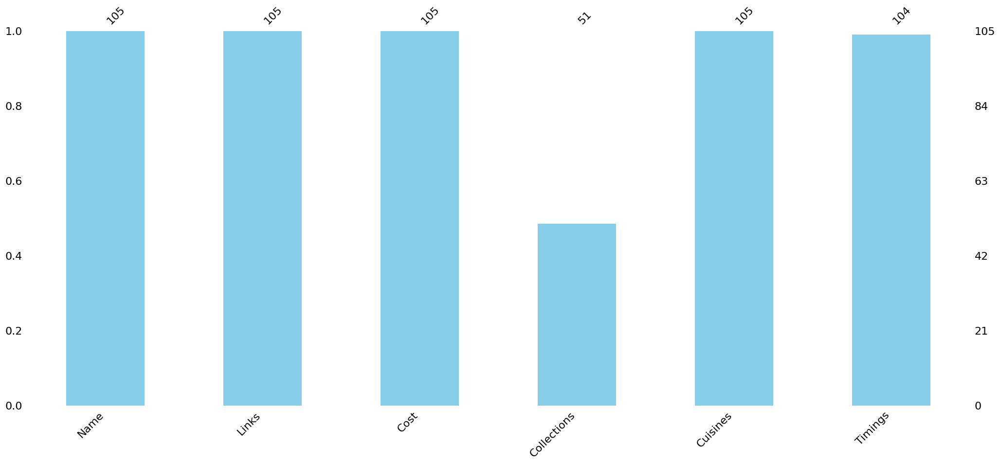

time: 2.45 s (started: 2023-08-05 20:03:07 +00:00)


In [31]:
# Missing Values/Null Values Count of zamato restaurent name dataset
missing_func(df_restaurant)

,missing_value,% of missing values,Data_Type
Restaurant,0,0.00,object
Reviewer,38,0.38,object
Review,45,0.45,object
Rating,38,0.38,object
Metadata,38,0.38,object
Time,38,0.38,object
Pictures,0,0.00,int64


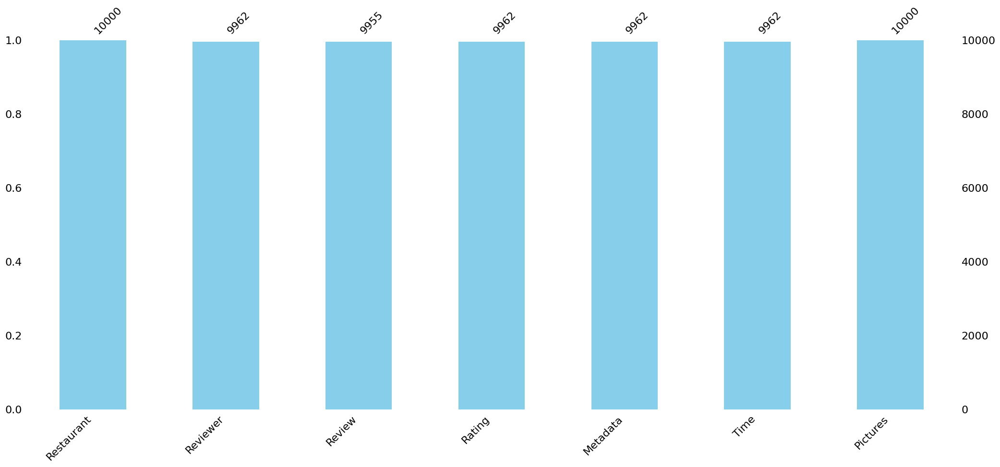

time: 1.12 s (started: 2023-08-05 20:03:10 +00:00)


In [32]:
# Missing Values/Null Values Count of zamato resturent review dataset
missing_func(df_review)

### What did you know about your dataset?

**Restaurant DataSet**
* There are total 105 observation with 6 different features.
* Feature like collections having 54 and timing has only one null values.
* There is no duplicate values i.e., 105 unique data.
* Feature cost represent amount but has object data type because these values are separated by comma ','.
* There is no duplicated value present in the dataset.
* Timing represent operational hour but as it is represented in the form of text has object data type.

**Review DataSet**
* There are total 10000 observation and 7 features.
* Feature like reviewer having 38, review having 45, Rating having 38, metadata having 38 and Time having 38 null value present in the review dataset.
* There is no duplicated value present in the dataset.
* Rating represent ordinal data, has object data type should be integer.
* Timing represent the time when review was posted but show object data time, it should be converted into date time.


## ***2. Understanding Your Variables***

In [33]:
# Dataset Columns of Zamato restaurant name
print(df_restaurant.columns)
print('\n')

Index(['Name', 'Links', 'Cost', 'Collections', 'Cuisines', 'Timings'], dtype='object')


time: 1.29 ms (started: 2023-08-05 20:03:11 +00:00)


In [34]:
# Dataset Columns of Zamato restaurant review
print(df_review.columns)
print('\n')

Index(['Restaurant', 'Reviewer', 'Review', 'Rating', 'Metadata', 'Time',
       'Pictures'],
      dtype='object')


time: 4.04 ms (started: 2023-08-05 20:03:11 +00:00)


In [35]:
# Dataset Describe of zamato restaurant name
df_restaurant.describe(include='all')

,Name,Links,Cost,Collections,Cuisines,Timings
count,105,105,105,51,105,104
unique,105,105,29,42,92,77
top,Beyond Flavours,https://www.zomato.com/hyderabad/beyond-flavou...,500,Food Hygiene Rated Restaurants in Hyderabad,"North Indian, Chinese",11 AM to 11 PM
freq,1,1,13,4,4,6


time: 34 ms (started: 2023-08-05 20:03:11 +00:00)


In [36]:
# Dataset Describe of zamato restaurant review
df_review.describe(include='all')

,Restaurant,Reviewer,Review,Rating,Metadata,Time,Pictures
count,10000,9962,9955,9962,9962,9962,10000.000000
unique,100,7446,9364,10,2477,9782,NaN
top,Beyond Flavours,Parijat Ray,good,5,1 Review,7/29/2018 20:34,NaN
freq,100,13,237,3832,919,3,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,0.748600
std,NaN,NaN,NaN,NaN,NaN,NaN,2.570381
min,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
25%,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
50%,NaN,NaN,NaN,NaN,NaN,NaN,0.000000
75%,NaN,NaN,NaN,NaN,NaN,NaN,0.000000


time: 44.7 ms (started: 2023-08-05 20:03:11 +00:00)


### Variables Description

---
**Zomato Restaurant**
* Name : Name of Restaurants

* Links : URL Links of Restaurants

* Cost : Per person estimated Cost of dining

* Collection : Tagging of Restaurants w.r.t. Zomato categories

* Cuisines : Cuisines served by Restaurants

* Timings : Restaurant Timings

**Zomato Restaurant Reviews**
* Restaurant : Name of the Restaurant

* Reviewer : Name of the Reviewer

* Review : Review Text

* Rating : Rating Provided by Reviewer

* MetaData : Reviewer Metadata - No. of Reviews and followers

* Time: Date and Time of Review

* Pictures : Number of pictures posted with review





### Check Unique Values for each variable.

In [37]:
# Create a function to find the unique value of each varriable of the dataset
def unique_val(df):
  for i in df.columns.tolist():
    print(f'Total number of unique value in {i} is {df[i].nunique()}.')

time: 737 µs (started: 2023-08-05 20:03:11 +00:00)


In [38]:
# Check Unique Values of the Zamato Restaurant name dataset for each variable.
unique_val(df_restaurant)

Total number of unique value in Name is 105.
Total number of unique value in Links is 105.
Total number of unique value in Cost is 29.
Total number of unique value in Collections is 42.
Total number of unique value in Cuisines is 92.
Total number of unique value in Timings is 77.
time: 2.69 ms (started: 2023-08-05 20:03:11 +00:00)


In [39]:
# Check Unique Values of the Zamato Restaurant Review dataset for each variable.
unique_val(df_review)

Total number of unique value in Restaurant is 100.
Total number of unique value in Reviewer is 7446.
Total number of unique value in Review is 9364.
Total number of unique value in Rating is 10.
Total number of unique value in Metadata is 2477.
Total number of unique value in Time is 9782.
Total number of unique value in Pictures is 36.
time: 15.3 ms (started: 2023-08-05 20:03:11 +00:00)


## 3. ***Data Wrangling***

### Data Wrangling Code

#### **Restaurent**

In [40]:
df_restaurant.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105 entries, 0 to 104
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Name         105 non-null    object
 1   Links        105 non-null    object
 2   Cost         105 non-null    object
 3   Collections  51 non-null     object
 4   Cuisines     105 non-null    object
 5   Timings      104 non-null    object
dtypes: object(6)
memory usage: 5.0+ KB
time: 11.9 ms (started: 2023-08-05 20:03:11 +00:00)


In [41]:
df_restaurant.columns

Index(['Name', 'Links', 'Cost', 'Collections', 'Cuisines', 'Timings'], dtype='object')

time: 3.5 ms (started: 2023-08-05 20:03:11 +00:00)


In [42]:
df_restaurant

,Name,Links,Cost,Collections,Cuisines,Timings
0,Beyond Flavours,https://www.zomato.com/hyderabad/beyond-flavou...,800,"Food Hygiene Rated Restaurants in Hyderabad, C...","Chinese, Continental, Kebab, European, South I...","12noon to 3:30pm, 6:30pm to 11:30pm (Mon-Sun)"
1,Paradise,https://www.zomato.com/hyderabad/paradise-gach...,800,Hyderabad's Hottest,"Biryani, North Indian, Chinese",11 AM to 11 PM
2,Flechazo,https://www.zomato.com/hyderabad/flechazo-gach...,"1,300","Great Buffets, Hyderabad's Hottest","Asian, Mediterranean, North Indian, Desserts","11:30 AM to 4:30 PM, 6:30 PM to 11 PM"
3,Shah Ghouse Hotel & Restaurant,https://www.zomato.com/hyderabad/shah-ghouse-h...,800,Late Night Restaurants,"Biryani, North Indian, Chinese, Seafood, Bever...",12 Noon to 2 AM
4,Over The Moon Brew Company,https://www.zomato.com/hyderabad/over-the-moon...,"1,200","Best Bars & Pubs, Food Hygiene Rated Restauran...","Asian, Continental, North Indian, Chinese, Med...","12noon to 11pm (Mon, Tue, Wed, Thu, Sun), 12no..."
...,...,...,...,...,...,...
100,IndiBlaze,https://www.zomato.com/hyderabad/indiblaze-gac...,600,NaN,"Fast Food, Salad",11 AM to 11 PM
101,Sweet Basket,https://www.zomato.com/hyderabad/sweet-basket-...,200,NaN,"Bakery, Mithai","10 AM to 10 PM (Mon-Thu), 8 AM to 10:30 PM (Fr..."
102,Angaara Counts 3,https://www.zomato.com/hyderabad/angaara-count...,500,NaN,"North Indian, Biryani, Chinese",12 Noon to 11 PM
103,Wich Please,https://www.zomato.com/hyderabad/wich-please-1...,250,NaN,Fast Food,8am to 12:30AM (Mon-Sun)


time: 18.2 ms (started: 2023-08-05 20:03:11 +00:00)


,missing_value,% of missing values,Data_Type
Name,0,0.000000,object
Links,0,0.000000,object
Cost,0,0.000000,object
Collections,54,51.428571,object
Cuisines,0,0.000000,object
Timings,1,0.952381,object


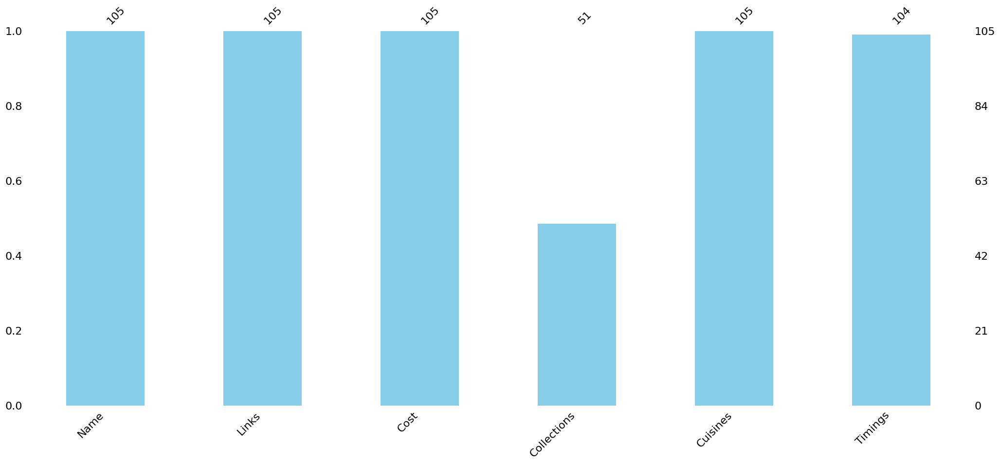

time: 935 ms (started: 2023-08-05 20:03:11 +00:00)


In [43]:
# missing value of zamato resturant name dataset
missing_func(df_restaurant)

In [44]:
# Check the total number of unique value of the resturent dataframe
df_restaurant['Cost'].unique()

array(['800', '1,300', '1,200', '1,500', '500', '300', '1,000', '350',
       '400', '1,600', '750', '550', '1,900', '450', '150', '1,400',
       '1,100', '600', '200', '900', '700', '1,700', '2,500', '850',
       '650', '1,800', '2,800', '1,750', '250'], dtype=object)

time: 6.51 ms (started: 2023-08-05 20:03:12 +00:00)


In [45]:
# Change the datatype of the Cost features from object to int
df_restaurant['Cost'] = df_restaurant['Cost'].str.replace(',','').astype(int)

time: 4.57 ms (started: 2023-08-05 20:03:12 +00:00)


In [46]:
# Check the Restaurant information
df_restaurant.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105 entries, 0 to 104
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Name         105 non-null    object
 1   Links        105 non-null    object
 2   Cost         105 non-null    int64 
 3   Collections  51 non-null     object
 4   Cuisines     105 non-null    object
 5   Timings      104 non-null    object
dtypes: int64(1), object(5)
memory usage: 5.0+ KB
time: 10.9 ms (started: 2023-08-05 20:03:12 +00:00)


In [47]:
# Top 5 economy restaurent
df_restaurant.sort_values('Cost')[['Name','Cost']].head()[::-1]

,Name,Cost
59,KS Bakers,200
101,Sweet Basket,200
54,Asian Meal Box,200
23,Amul,150
89,Mohammedia Shawarma,150


time: 9.74 ms (started: 2023-08-05 20:03:12 +00:00)


In [48]:
# Top 5 costly restaurent
df_restaurant.sort_values('Cost')[['Name','Cost']].tail()[::-1]

,Name,Cost
92,Collage - Hyatt Hyderabad Gachibowli,2800
56,Feast - Sheraton Hyderabad Hotel,2500
21,Jonathan's Kitchen - Holiday Inn Express & Suites,1900
18,10 Downing Street,1900
91,Cascade - Radisson Hyderabad Hitec City,1800


time: 12.3 ms (started: 2023-08-05 20:03:12 +00:00)


In [49]:
# Create dataframe Restaurant name based on the price
df = df_restaurant.groupby('Cost')['Name'].apply(lambda x: x.tolist()).reset_index()
#getting Restaurant count with another dataframe
df1 = df_restaurant.groupby('Cost')['Name'].count()
#merging together
df2 = df.merge(df1,how = 'inner',on = 'Cost')
# Rename of the columns
df2 = df2.rename(columns = {'Name_x': 'Name of Restaurent','Name_y':'Total restaurent'})

time: 13.4 ms (started: 2023-08-05 20:03:12 +00:00)


In [50]:
# Maximum 5 hotel share same price
df2.sort_values('Total restaurent', ascending = False).head()

,Cost,Name of Restaurent,Total restaurent
7,500,"[eat.fit, KFC, Kritunga Restaurant, Karachi Ba...",13
9,600,"[Behrouz Biryani, Karachi Cafe, Hyderabad Chef...",10
11,700,"[Marsala Food Company, Green Bawarchi Restaura...",8
18,1200,"[Over The Moon Brew Company, The Glass Onion, ...",7
16,1000,"[Hyper Local, Tiki Shack, Pista House, La La L...",6


time: 11.5 ms (started: 2023-08-05 20:03:12 +00:00)


In [51]:
# minimum 5 hotel share same price
df2.sort_values('Total restaurent', ascending = False).tail()

,Cost,Name of Restaurent,Total restaurent
14,850,[Dine O China],1
10,650,[Squeeze @ The Lime],1
3,300,[Shah Ghouse Spl Shawarma],1
2,250,[Wich Please],1
28,2800,[Collage - Hyatt Hyderabad Gachibowli],1


time: 11.5 ms (started: 2023-08-05 20:03:12 +00:00)


In [52]:
# spliting the cusines and storing in list
cuisine_value_list = df_restaurant.Cuisines.str.split(', ')
# storing all the cusines in a dict
cuisine_dict = {}
for cuisine_names in cuisine_value_list:
    for cuisine in cuisine_names:
        if (cuisine in cuisine_dict):
            cuisine_dict[cuisine]+=1
        else:
            cuisine_dict[cuisine]=1
# Converting Dictionary to DataFrame
df_cuisine = pd.DataFrame.from_dict([cuisine_dict]).transpose().reset_index().rename(columns={'index':'Cuisine',0:'Number of Restaurant'})
# top 5 cuisine
df_cuisine.sort_values('Number of Restaurant',ascending = False).head()

,Cuisine,Number of Restaurant
5,North Indian,61
0,Chinese,43
1,Continental,21
6,Biryani,16
18,Fast Food,15


time: 16 ms (started: 2023-08-05 20:03:12 +00:00)


In [53]:
# spliting the cusines and storing in list
collection_value_list = df_restaurant.Collections.str.split(', ').dropna()
# storing all the cusines in a dict
collection_dict = {}
for collection_names in collection_value_list:
    for collection in collection_names:
        if (collection in collection_dict):
            collection_dict[collection]+=1
        else:
            collection_dict[collection]=1
# Converting Dictionary to DataFrame
df_collection = pd.DataFrame.from_dict([collection_dict]).transpose().reset_index().rename(columns={'index': 'Tags',0:'Number of Restaurant'})
# top 5 cuisine
df_collection.sort_values('Number of Restaurant',ascending = False).head()

,Tags,Number of Restaurant
2,Great Buffets,11
0,Food Hygiene Rated Restaurants in Hyderabad,8
5,Live Sports Screenings,7
6,Hyderabad's Hottest,7
1,Corporate Favorites,6


time: 13.3 ms (started: 2023-08-05 20:03:12 +00:00)


#### **Review**

In [54]:
# Information of Review
df_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Restaurant  10000 non-null  object
 1   Reviewer    9962 non-null   object
 2   Review      9955 non-null   object
 3   Rating      9962 non-null   object
 4   Metadata    9962 non-null   object
 5   Time        9962 non-null   object
 6   Pictures    10000 non-null  int64 
dtypes: int64(1), object(6)
memory usage: 547.0+ KB
time: 28.3 ms (started: 2023-08-05 20:03:12 +00:00)


In [55]:
# Columns of the Review
df_review.columns

Index(['Restaurant', 'Reviewer', 'Review', 'Rating', 'Metadata', 'Time',
       'Pictures'],
      dtype='object')

time: 4.83 ms (started: 2023-08-05 20:03:12 +00:00)


In [56]:
# Top 5 review dataframe
df_review.head()

,Restaurant,Reviewer,Review,Rating,Metadata,Time,Pictures
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . h...",5,"1 Review , 2 Followers",5/25/2019 15:54,0
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. S...,5,"3 Reviews , 2 Followers",5/25/2019 14:20,0
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx f...,5,"2 Reviews , 3 Followers",5/24/2019 22:54,0
3,Beyond Flavours,Swapnil Sarkar,Soumen das and Arun was a great guy. Only beca...,5,"1 Review , 1 Follower",5/24/2019 22:11,0
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and ba...,5,"3 Reviews , 2 Followers",5/24/2019 21:37,0


time: 16.2 ms (started: 2023-08-05 20:03:12 +00:00)


In [57]:
# Extract the Year, Month and Date from time
df_review['Review_Year'] = pd.DatetimeIndex(df_review['Time']).year
df_review['Review_Month'] = pd.DatetimeIndex(df_review['Time']).month
df_review['Review_Day'] = pd.DatetimeIndex(df_review['Time']).day

time: 2.9 s (started: 2023-08-05 20:03:12 +00:00)


In [58]:
# Extract Total Review and Reviewer follower from Metadata
df_review['Reviewer_total_review'],df_review['Reviewer_followers']=df_review['Metadata'].str.split(',').str
# Extract Riviewer & Followers gave the total review in numeric value in the dataframe
df_review['Reviewer_total_review'] = pd.to_numeric(df_review['Reviewer_total_review'].str.split(' ').str[0])
df_review['Reviewer_followers'] = pd.to_numeric(df_review['Reviewer_followers'].str.split(' ').str[1])

time: 74.7 ms (started: 2023-08-05 20:03:15 +00:00)


In [59]:
# Unique value of rating
df_review['Rating'].unique()

array(['5', '4', '1', '3', '2', '3.5', '4.5', '2.5', '1.5', 'Like', nan],
      dtype=object)

time: 5.39 ms (started: 2023-08-05 20:03:15 +00:00)


In [60]:
# In order for rating checking values
df_review['Rating'].value_counts()

5       3832
4       2373
1       1735
3       1193
2        684
4.5       69
3.5       47
2.5       19
1.5        9
Like       1
Name: Rating, dtype: int64

time: 8.56 ms (started: 2023-08-05 20:03:15 +00:00)


In [61]:
#since there is one rating as like converting it to 0 since no rating is 0 then to median
df_review.loc[df_review['Rating'] == 'Like'] = 0

time: 6.04 ms (started: 2023-08-05 20:03:15 +00:00)


In [62]:
#changing data type for rating in review data
df_review['Rating'] = df_review['Rating'].astype('float')

time: 5.69 ms (started: 2023-08-05 20:03:15 +00:00)


In [63]:
# Count the value of rating in review dataframe
df_review['Rating'].value_counts()

5.0    3832
4.0    2373
1.0    1735
3.0    1193
2.0     684
4.5      69
3.5      47
2.5      19
1.5       9
0.0       1
Name: Rating, dtype: int64

time: 7.42 ms (started: 2023-08-05 20:03:15 +00:00)


In [64]:
df_review

,Restaurant,Reviewer,Review,Rating,Metadata,Time,Pictures,Review_Year,Review_Month,Review_Day,Reviewer_total_review,Reviewer_followers
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . h...",5.0,"1 Review , 2 Followers",5/25/2019 15:54,0,2019.0,5.0,25.0,1.0,2.0
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. S...,5.0,"3 Reviews , 2 Followers",5/25/2019 14:20,0,2019.0,5.0,25.0,3.0,2.0
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx f...,5.0,"2 Reviews , 3 Followers",5/24/2019 22:54,0,2019.0,5.0,24.0,2.0,3.0
3,Beyond Flavours,Swapnil Sarkar,Soumen das and Arun was a great guy. Only beca...,5.0,"1 Review , 1 Follower",5/24/2019 22:11,0,2019.0,5.0,24.0,1.0,1.0
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and ba...,5.0,"3 Reviews , 2 Followers",5/24/2019 21:37,0,2019.0,5.0,24.0,3.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...
9995,Chinese Pavilion,Abhishek Mahajan,Madhumathi Mahajan Well to start with nice cou...,3.0,"53 Reviews , 54 Followers",6/5/2016 0:08,0,2016.0,6.0,5.0,53.0,54.0
9996,Chinese Pavilion,Sharad Agrawal,This place has never disappointed us.. The foo...,4.5,"2 Reviews , 53 Followers",6/4/2016 22:01,0,2016.0,6.0,4.0,2.0,53.0
9997,Chinese Pavilion,Ramandeep,"Bad rating is mainly because of ""Chicken Bone ...",1.5,"65 Reviews , 423 Followers",6/3/2016 10:37,3,2016.0,6.0,3.0,65.0,423.0
9998,Chinese Pavilion,Nayana Shanbhag,I personally love and prefer Chinese Food. Had...,4.0,"13 Reviews , 144 Followers",5/31/2016 17:22,0,2016.0,5.0,31.0,13.0,144.0


time: 27.9 ms (started: 2023-08-05 20:03:15 +00:00)


In [65]:
# Average rating and total reviewer of the restaurant
avg_restaurant_rating = df_review.groupby('Restaurant').agg({'Rating':'mean',
        'Reviewer': 'count'}).rename(columns={'Reviewer' : 'Total_review'})
avg_restaurant_rating

,Rating,Total_review
Restaurant,,
0,0.00,1
10 Downing Street,3.80,100
13 Dhaba,3.48,100
"3B's - Buddies, Bar & Barbecue",4.76,100
AB's - Absolute Barbecues,4.88,100
...,...,...
Urban Asia - Kitchen & Bar,3.65,100
Yum Yum Tree - The Arabian Food Court,3.56,100
Zega - Sheraton Hyderabad Hotel,4.45,100


time: 27 ms (started: 2023-08-05 20:03:15 +00:00)


In [66]:
# Check the total restaurant in review dataframe
print(df_review['Restaurant'].nunique())
print('\n')

101


time: 1.49 ms (started: 2023-08-05 20:03:15 +00:00)


In [67]:
# without review restaurant
restaurant_without_review = [i for i in df_restaurant['Name'].unique() if i not in df_review['Restaurant'].unique()]
restaurant_without_review

['IndiBlaze',
 'Sweet Basket',
 'Angaara Counts 3',
 'Wich Please',
 'Republic Of Noodles - Lemon Tree Hotel']

time: 50.4 ms (started: 2023-08-05 20:03:15 +00:00)


In [68]:
# Top 5 restaurent on the basis of the rating
avg_restaurant_rating.sort_values('Rating',ascending = False).head()

,Rating,Total_review
Restaurant,,
AB's - Absolute Barbecues,4.88,100
B-Dubs,4.81,100
"3B's - Buddies, Bar & Barbecue",4.76,100
Paradise,4.70,100
Flechazo,4.66,100


time: 9.63 ms (started: 2023-08-05 20:03:16 +00:00)


In [69]:
# Top 5 restaurent on the basis of the rating
avg_restaurant_rating.sort_values('Rating',ascending = False).tail()

,Rating,Total_review
Restaurant,,
Mathura Vilas,2.82,100
Pakwaan Grand,2.71,100
Asian Meal Box,2.58,100
Hotel Zara Hi-Fi,2.40,100
0,0.00,1


time: 15.7 ms (started: 2023-08-05 20:03:16 +00:00)


In [70]:
#Finding the most followed critic
most_followed_reviewer = df_review.groupby('Reviewer').agg({'Reviewer_total_review':'max',
      'Reviewer_followers':'max', 'Rating':'mean'[:5]}).reset_index().rename(columns = {'Rating':'Average Rating'}).sort_values('Reviewer_followers',ascending = False)

time: 26 ms (started: 2023-08-05 20:03:16 +00:00)


In [71]:
#Finding the top 5 most followed critic
most_followed_reviewer.head()

,Reviewer,Reviewer_total_review,Reviewer_followers,Average Rating
5464,Satwinder Singh,186.0,13410.0,3.666667
1702,Eat_vth_me,60.0,13320.0,5.000000
5236,Samar Sardar,8.0,11329.0,3.500000
1788,Foodies Hyderabad,31.0,9494.0,4.500000
6230,Srinivas,34.0,7628.0,3.714286


time: 11.6 ms (started: 2023-08-05 20:03:16 +00:00)


#### **Null Value**

##### **Treatment of Null Value of Restaurant Dataset**

,missing_value,% of missing values,Data_Type
Name,0,0.000000,object
Links,0,0.000000,object
Cost,0,0.000000,int64
Collections,54,51.428571,object
Cuisines,0,0.000000,object
Timings,1,0.952381,object


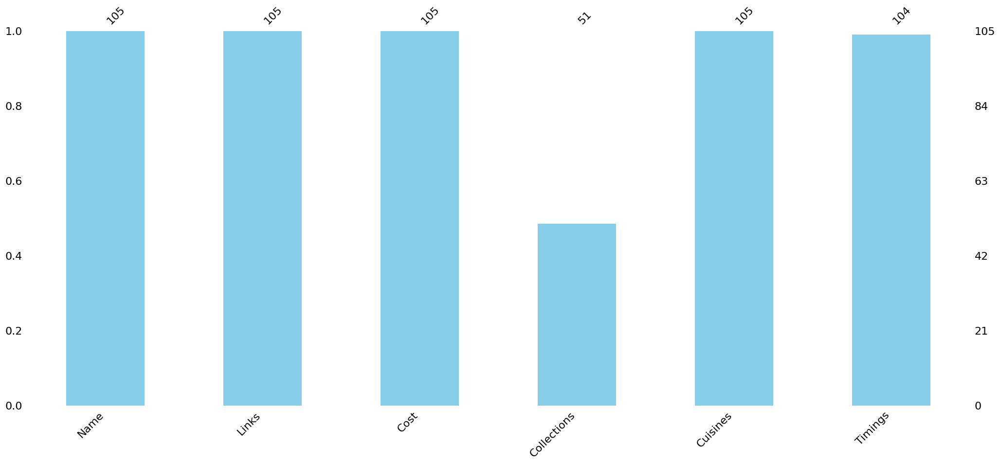

time: 1.05 s (started: 2023-08-05 20:03:16 +00:00)


In [72]:
# Check the missing Value in Restaurant
missing_func(df_restaurant)

Here we can see that in collection feature having 51.42% of missing value, then it is best for drop the null value in the restaurant dataset.

In [73]:
# Drop null value in the resturant dataset
df_restaurant.drop('Collections',axis = 1,inplace= True)

time: 2.34 ms (started: 2023-08-05 20:03:17 +00:00)


In [74]:
# Again Check the Null Value
df_restaurant.isna().sum()

Name        0
Links       0
Cost        0
Cuisines    0
Timings     1
dtype: int64

time: 7.06 ms (started: 2023-08-05 20:03:17 +00:00)


Here we wiil say that Timing feature having only one null value so it will fill it null value with mode value.

In [75]:
#filling null value in timings column
df_restaurant['Timings'].fillna(df_restaurant['Timings'].mode()[0], inplace = True)

time: 2.37 ms (started: 2023-08-05 20:03:17 +00:00)


In [76]:
# Again Check the Null Value
df_restaurant.isna().sum()

Name        0
Links       0
Cost        0
Cuisines    0
Timings     0
dtype: int64

time: 7.08 ms (started: 2023-08-05 20:03:17 +00:00)


So it is claear that there is no null value in the restaurant dataset.

In [77]:
# Check the duplicate value of the restaurant dataset
print(df_restaurant.duplicated().sum())
print('\n')

0


time: 6.05 ms (started: 2023-08-05 20:03:17 +00:00)


So it is claear that there is no duplicate value in the restaurant dataset.

##### **Treatment of Null Value of Review Dataset**

In [78]:
# Information of Review Dataset
df_review.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Restaurant             10000 non-null  object 
 1   Reviewer               9962 non-null   object 
 2   Review                 9955 non-null   object 
 3   Rating                 9962 non-null   float64
 4   Metadata               9962 non-null   object 
 5   Time                   9962 non-null   object 
 6   Pictures               10000 non-null  int64  
 7   Review_Year            9962 non-null   float64
 8   Review_Month           9962 non-null   float64
 9   Review_Day             9962 non-null   float64
 10  Reviewer_total_review  9962 non-null   float64
 11  Reviewer_followers     8384 non-null   float64
dtypes: float64(6), int64(1), object(5)
memory usage: 937.6+ KB
time: 20.8 ms (started: 2023-08-05 20:03:17 +00:00)


,missing_value,% of missing values,Data_Type
Restaurant,0,0.00,object
Reviewer,38,0.38,object
Review,45,0.45,object
Rating,38,0.38,float64
Metadata,38,0.38,object
Time,38,0.38,object
Pictures,0,0.00,int64
Review_Year,38,0.38,float64
Review_Month,38,0.38,float64
Review_Day,38,0.38,float64


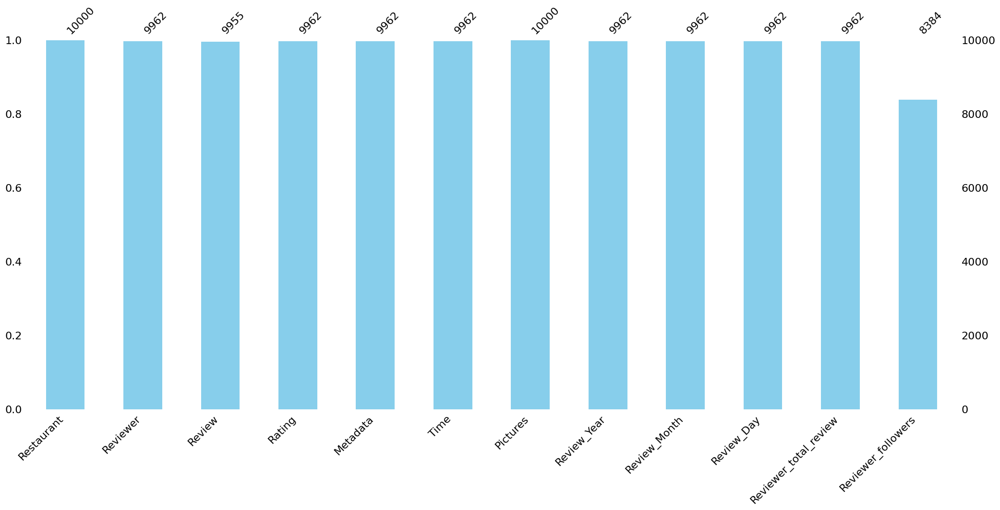

time: 1.42 s (started: 2023-08-05 20:03:17 +00:00)


In [79]:
# Check the missing value of the review dataset
missing_func(df_review)

Here we can see that there are some missing value in the following feature:
1. Reviewer
2.  Review
3. Rating
4. Metadata
5. Time
6. Review_Year
7. Review_Month
8. Review_Day
9. Review_total_review
10. Reviewer_followers



We have to fill the null values of CompetitionDistance, there are **four** options:
1. **Zero(0) :** Not effective as the corresponding values for CompetitionSinceMonth and CompetitionSinceYear are not zero.
2. **Mean :** Replacing null values with mean will create blunders as it contains outliers and mean is influenced with outliers.
3. **Median :** To get good results replacing with median can be a better choice.
4. **Mode :** Mode can also help to fill the null values in our case.

Since, we have two options(Mode and Median) we are going with the mode for float type of the feature.

In [80]:
# Treatment of missing value of the float type data with mode value
null_list = [ i for i in df_review.columns if df_review[i].dtypes == 'float64']
n = null_list.index('Reviewer_followers')
null_list.pop(n)
null_list
for i in null_list:
  df_review[i].fillna(df_review[i].mode()[0],inplace = True)

time: 6.31 ms (started: 2023-08-05 20:03:18 +00:00)


In [81]:
# dropping null values in reviewer and Reviewer_Total_Review column as all values are null for those column
df_review = df_review.dropna(subset=['Reviewer','Reviewer_total_review'])

time: 14.8 ms (started: 2023-08-05 20:03:18 +00:00)


In [82]:
#filling null values in review and reviewer follower column
df_review = df_review.fillna({"Review": "No Review", "Reviewer_followers": 0})

time: 8.09 ms (started: 2023-08-05 20:03:18 +00:00)


,missing_value,% of missing values,Data_Type
Restaurant,0,0.0,object
Reviewer,0,0.0,object
Review,0,0.0,object
Rating,0,0.0,float64
Metadata,0,0.0,object
Time,0,0.0,object
Pictures,0,0.0,int64
Review_Year,0,0.0,float64
Review_Month,0,0.0,float64
Review_Day,0,0.0,float64


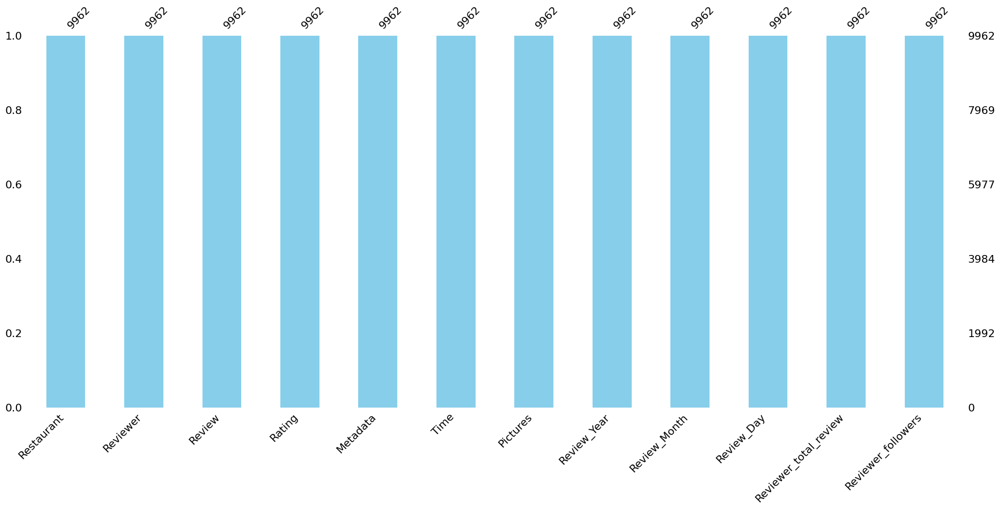

time: 1.54 s (started: 2023-08-05 20:03:18 +00:00)


In [83]:
missing_func(df_review)

In [84]:
# Check tje duplicate value in the review dataset
df_review.duplicated().sum()

0

time: 38.3 ms (started: 2023-08-05 20:03:20 +00:00)


#### **Merge Dataset**

In [85]:
# In Restaurant dataset change the Name as Restaurant
df_restaurant = df_restaurant.rename(columns = {'Name' : 'Restaurant'})

time: 5.13 ms (started: 2023-08-05 20:03:20 +00:00)


In [86]:
# checking shape of dataset using left join
df_left= pd.merge(df_restaurant, df_review, on='Restaurant', how= 'left')
print(df_left.shape)
print(f'Total number of null values obtained from left join: {df_left.isna().sum().sum()}')

# checking shape of dataset using right join
df_right= pd.merge(df_restaurant, df_review, on='Restaurant', how= 'right')
print(df_right.shape)
print(f'Total number of null values obtained from right join: {df_right.isna().sum().sum()}')


# checking shape of dataset using inner join
df_inner= pd.merge(df_restaurant, df_review, on='Restaurant', how= 'inner')
print(df_inner.shape)
print(f'Total number of null values obtained from inner join: {df_inner.isna().sum().sum()}')

# checking shape of dataset using outer join
df_outer= pd.merge(df_restaurant, df_review, on='Restaurant', how= 'outer')
print(df_outer.shape)
print(f'Total number of null values obtained from outer join: {df_outer.isna().sum().sum()}')

(9966, 16)
Total number of null values obtained from left join: 55
(9962, 16)
Total number of null values obtained from right join: 4
(9961, 16)
Total number of null values obtained from inner join: 0
(9967, 16)
Total number of null values obtained from outer join: 59
time: 244 ms (started: 2023-08-05 20:03:20 +00:00)


Since, we are obtaining the same shape and 0 null values in the inner joins therefore we can use any of the join and it won't affact the results.

We are following the inner join for our further analysis.

So we have to proceed with inner join beacuse there have no null value present in the dataset.

In [87]:
# Shape of the merged dataset
df_inner.shape

(9961, 16)

time: 3.47 ms (started: 2023-08-05 20:03:20 +00:00)


In [88]:
# Information of the merged dataset
df_inner.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9961 entries, 0 to 9960
Data columns (total 16 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Restaurant             9961 non-null   object 
 1   Links                  9961 non-null   object 
 2   Cost                   9961 non-null   int64  
 3   Cuisines               9961 non-null   object 
 4   Timings                9961 non-null   object 
 5   Reviewer               9961 non-null   object 
 6   Review                 9961 non-null   object 
 7   Rating                 9961 non-null   float64
 8   Metadata               9961 non-null   object 
 9   Time                   9961 non-null   object 
 10  Pictures               9961 non-null   int64  
 11  Review_Year            9961 non-null   float64
 12  Review_Month           9961 non-null   float64
 13  Review_Day             9961 non-null   float64
 14  Reviewer_total_review  9961 non-null   float64
 15  Revi

In [89]:
# Description of the merged dataset
df_inner.describe(include= 'all')

,Restaurant,Links,Cost,Cuisines,Timings,Reviewer,Review,Rating,Metadata,Time,Pictures,Review_Year,Review_Month,Review_Day,Reviewer_total_review,Reviewer_followers
count,9961,9961,9961.000000,9961,9961,9961,9961,9961.000000,9961,9961,9961.000000,9961.000000,9961.000000,9961.000000,9961.000000,9961.000000
unique,100,100,NaN,89,74,7446,9364,NaN,2477,9781,NaN,NaN,NaN,NaN,NaN,NaN
top,Beyond Flavours,https://www.zomato.com/hyderabad/beyond-flavou...,NaN,"North Indian, Chinese",11 AM to 11 PM,Ankita,good,NaN,1 Review,7/29/2018 20:34,NaN,NaN,NaN,NaN,NaN,NaN
freq,100,100,NaN,400,600,13,237,NaN,919,3,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,871.584178,NaN,NaN,NaN,NaN,3.601044,NaN,NaN,0.751431,2018.452063,6.017970,16.107218,23.992069,163.008433
std,NaN,NaN,503.425455,NaN,NaN,NaN,NaN,1.483461,NaN,NaN,2.574991,0.562496,3.159606,8.781835,50.617425,619.979721
min,NaN,NaN,150.000000,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,0.000000,2016.000000,1.000000,1.000000,0.000000,0.000000
25%,NaN,NaN,500.000000,NaN,NaN,NaN,NaN,3.000000,NaN,NaN,0.000000,2018.000000,4.000000,9.000000,1.000000,1.000000
50%,NaN,NaN,700.000000,NaN,NaN,NaN,NaN,4.000000,NaN,NaN,0.000000,2018.000000,5.000000,16.000000,4.000000,7.000000
75%,NaN,NaN,1200.000000,NaN,NaN,NaN,NaN,5.000000,NaN,NaN,0.000000,2019.000000,8.000000,24.000000,22.000000,63.000000


time: 145 ms (started: 2023-08-05 20:03:20 +00:00)


In [90]:
# Top 5 rows of the merged dataset
df_inner.head()

,Restaurant,Links,Cost,Cuisines,Timings,Reviewer,Review,Rating,Metadata,Time,Pictures,Review_Year,Review_Month,Review_Day,Reviewer_total_review,Reviewer_followers
0,Beyond Flavours,https://www.zomato.com/hyderabad/beyond-flavou...,800,"Chinese, Continental, Kebab, European, South I...","12noon to 3:30pm, 6:30pm to 11:30pm (Mon-Sun)",Rusha Chakraborty,"The ambience was good, food was quite good . h...",5.0,"1 Review , 2 Followers",5/25/2019 15:54,0,2019.0,5.0,25.0,1.0,2.0
1,Beyond Flavours,https://www.zomato.com/hyderabad/beyond-flavou...,800,"Chinese, Continental, Kebab, European, South I...","12noon to 3:30pm, 6:30pm to 11:30pm (Mon-Sun)",Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. S...,5.0,"3 Reviews , 2 Followers",5/25/2019 14:20,0,2019.0,5.0,25.0,3.0,2.0
2,Beyond Flavours,https://www.zomato.com/hyderabad/beyond-flavou...,800,"Chinese, Continental, Kebab, European, South I...","12noon to 3:30pm, 6:30pm to 11:30pm (Mon-Sun)",Ashok Shekhawat,A must try.. great food great ambience. Thnx f...,5.0,"2 Reviews , 3 Followers",5/24/2019 22:54,0,2019.0,5.0,24.0,2.0,3.0
3,Beyond Flavours,https://www.zomato.com/hyderabad/beyond-flavou...,800,"Chinese, Continental, Kebab, European, South I...","12noon to 3:30pm, 6:30pm to 11:30pm (Mon-Sun)",Swapnil Sarkar,Soumen das and Arun was a great guy. Only beca...,5.0,"1 Review , 1 Follower",5/24/2019 22:11,0,2019.0,5.0,24.0,1.0,1.0
4,Beyond Flavours,https://www.zomato.com/hyderabad/beyond-flavou...,800,"Chinese, Continental, Kebab, European, South I...","12noon to 3:30pm, 6:30pm to 11:30pm (Mon-Sun)",Dileep,Food is good.we ordered Kodi drumsticks and ba...,5.0,"3 Reviews , 2 Followers",5/24/2019 21:37,0,2019.0,5.0,24.0,3.0,2.0


time: 45.5 ms (started: 2023-08-05 20:03:20 +00:00)


In [91]:
# Bootom 5 rows of the merged dataset
df_inner.tail()

,Restaurant,Links,Cost,Cuisines,Timings,Reviewer,Review,Rating,Metadata,Time,Pictures,Review_Year,Review_Month,Review_Day,Reviewer_total_review,Reviewer_followers
9956,Chinese Pavilion,https://www.zomato.com/hyderabad/chinese-pavil...,1000,"Chinese, Seafood","12 Noon to 3:30 PM, 7 PM to 11 PM",Abhishek Mahajan,Madhumathi Mahajan Well to start with nice cou...,3.0,"53 Reviews , 54 Followers",6/5/2016 0:08,0,2016.0,6.0,5.0,53.0,54.0
9957,Chinese Pavilion,https://www.zomato.com/hyderabad/chinese-pavil...,1000,"Chinese, Seafood","12 Noon to 3:30 PM, 7 PM to 11 PM",Sharad Agrawal,This place has never disappointed us.. The foo...,4.5,"2 Reviews , 53 Followers",6/4/2016 22:01,0,2016.0,6.0,4.0,2.0,53.0
9958,Chinese Pavilion,https://www.zomato.com/hyderabad/chinese-pavil...,1000,"Chinese, Seafood","12 Noon to 3:30 PM, 7 PM to 11 PM",Ramandeep,"Bad rating is mainly because of ""Chicken Bone ...",1.5,"65 Reviews , 423 Followers",6/3/2016 10:37,3,2016.0,6.0,3.0,65.0,423.0
9959,Chinese Pavilion,https://www.zomato.com/hyderabad/chinese-pavil...,1000,"Chinese, Seafood","12 Noon to 3:30 PM, 7 PM to 11 PM",Nayana Shanbhag,I personally love and prefer Chinese Food. Had...,4.0,"13 Reviews , 144 Followers",5/31/2016 17:22,0,2016.0,5.0,31.0,13.0,144.0
9960,Chinese Pavilion,https://www.zomato.com/hyderabad/chinese-pavil...,1000,"Chinese, Seafood","12 Noon to 3:30 PM, 7 PM to 11 PM",Bhargava Krishna,Checked in here to try some delicious chinese ...,3.5,"472 Reviews , 1302 Followers",5/31/2016 16:41,6,2016.0,5.0,31.0,472.0,1302.0


time: 40 ms (started: 2023-08-05 20:03:20 +00:00)


In [92]:
# Check the duplicate value in the dataset
print(df_inner.duplicated().sum())
print()

0

time: 52.7 ms (started: 2023-08-05 20:03:21 +00:00)


,missing_value,% of missing values,Data_Type
Restaurant,0,0.0,object
Links,0,0.0,object
Cost,0,0.0,int64
Cuisines,0,0.0,object
Timings,0,0.0,object
Reviewer,0,0.0,object
Review,0,0.0,object
Rating,0,0.0,float64
Metadata,0,0.0,object
Time,0,0.0,object


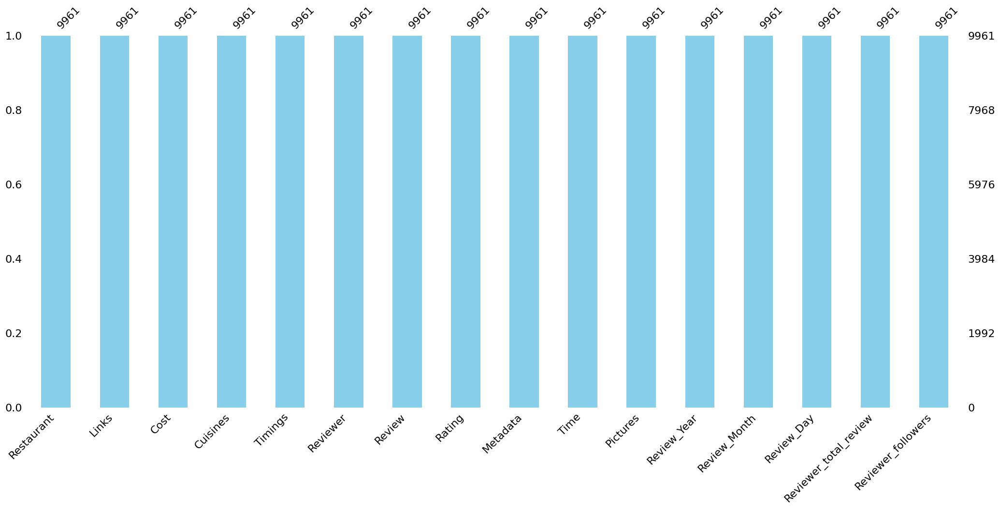

time: 3.77 s (started: 2023-08-05 20:03:21 +00:00)


In [93]:
# Check the null value and plot the missing number
missing_func(df_inner)

We have to decide the two type of the columns list one list have contain the object datatype of the feature and other contain the numerical datatype feature.

In [94]:
# Create list of columns
object_features = [i for i in df_inner.columns if df_inner[i].dtypes == 'object']
numerical_features = [i for i in df_inner.columns if i not in object_features]
print(object_features)
print(numerical_features)

['Restaurant', 'Links', 'Cuisines', 'Timings', 'Reviewer', 'Review', 'Metadata', 'Time']
['Cost', 'Rating', 'Pictures', 'Review_Year', 'Review_Month', 'Review_Day', 'Reviewer_total_review', 'Reviewer_followers']
time: 5.96 ms (started: 2023-08-05 20:03:24 +00:00)


In [95]:
# Check the total number of different type of the data present in the features
for i in df_inner.columns:
  print(f'Total number of unique value in {i} is {df_inner[i].nunique()}.')

Total number of unique value in Restaurant is 100.
Total number of unique value in Links is 100.
Total number of unique value in Cost is 28.
Total number of unique value in Cuisines is 89.
Total number of unique value in Timings is 74.
Total number of unique value in Reviewer is 7446.
Total number of unique value in Review is 9364.
Total number of unique value in Rating is 9.
Total number of unique value in Metadata is 2477.
Total number of unique value in Time is 9781.
Total number of unique value in Pictures is 36.
Total number of unique value in Review_Year is 4.
Total number of unique value in Review_Month is 12.
Total number of unique value in Review_Day is 31.
Total number of unique value in Reviewer_total_review is 234.
Total number of unique value in Reviewer_followers is 751.
time: 109 ms (started: 2023-08-05 20:03:24 +00:00)


#### **Outliers Detection**

We have to check that outliers in the numerical features

In [96]:
# function of the outliers detection
def outliers_detection(df):
  df = sorted(df)
  q1 = np.percentile(df,25)
  q3 = np.percentile(df,75)
  print(f'Q1 : {q1} \n Q3 : {q3}')
  iqr = q3 - q1
  print(f'Inter Quartile Range : {iqr}')
  lower_bound = q1 - 1.5*iqr
  upper_bound = q3 + 1.5*iqr
  print(f'Lower Bound : {lower_bound} \n Upper Bound : {upper_bound}')
  outliers = [i for i in df if i < lower_bound or i > upper_bound]
  print('Length of the otliers :',len(outliers))
  percentage_of_outliers = (100*(len(outliers))/len(df))
  print(f'Percentage of outliers : {round(percentage_of_outliers,2)}%')


time: 6.05 ms (started: 2023-08-05 20:03:25 +00:00)


In [97]:
# Find the outliers in the numerical features of the dataframe
for i in numerical_features:
  print(i)
  outliers_detection(df_inner[i])
  print('\n')

Cost
Q1 : 500.0 
 Q3 : 1200.0
Inter Quartile Range : 700.0
Lower Bound : -550.0 
 Upper Bound : 2250.0
Length of the otliers : 200
Percentage of outliers : 2.01%


Rating
Q1 : 3.0 
 Q3 : 5.0
Inter Quartile Range : 2.0
Lower Bound : 0.0 
 Upper Bound : 8.0
Length of the otliers : 0
Percentage of outliers : 0.0%


Pictures
Q1 : 0.0 
 Q3 : 0.0
Inter Quartile Range : 0.0
Lower Bound : 0.0 
 Upper Bound : 0.0
Length of the otliers : 1983
Percentage of outliers : 19.91%


Review_Year
Q1 : 2018.0 
 Q3 : 2019.0
Inter Quartile Range : 1.0
Lower Bound : 2016.5 
 Upper Bound : 2020.5
Length of the otliers : 43
Percentage of outliers : 0.43%


Review_Month
Q1 : 4.0 
 Q3 : 8.0
Inter Quartile Range : 4.0
Lower Bound : -2.0 
 Upper Bound : 14.0
Length of the otliers : 0
Percentage of outliers : 0.0%


Review_Day
Q1 : 9.0 
 Q3 : 24.0
Inter Quartile Range : 15.0
Lower Bound : -13.5 
 Upper Bound : 46.5
Length of the otliers : 0
Percentage of outliers : 0.0%


Reviewer_total_review
Q1 : 1.0 
 Q3 : 22.0


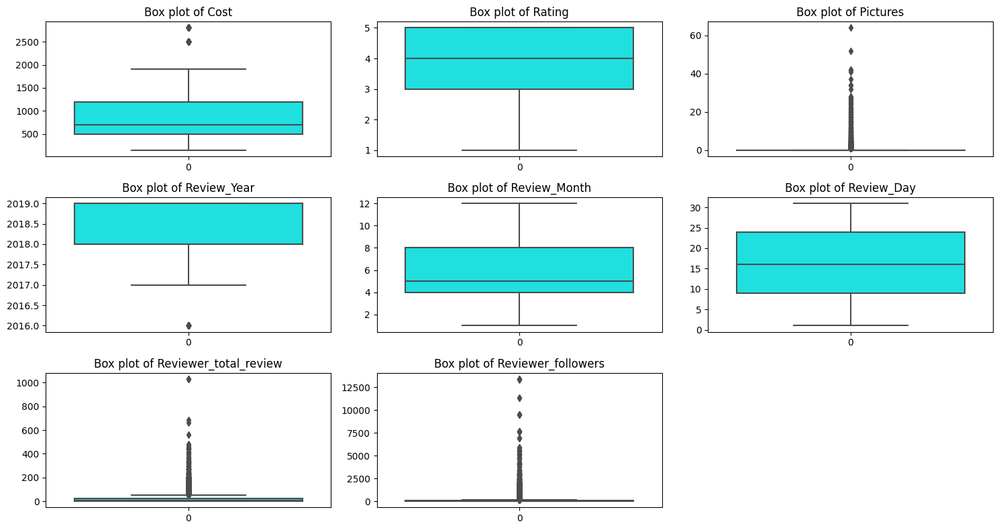

time: 7 s (started: 2023-08-05 20:03:25 +00:00)


In [98]:
# Boxplot of the numerical feature to visualize the outliers
plt.figure(figsize= (15,8))
for num,col in enumerate(numerical_features):
  plt.subplot(int(len(numerical_features)/3 + 1),3,num+1)
  sns.boxplot(df_inner[col],color = 'cyan').set(title= f'Box plot of {col}')
  plt.tight_layout()


### What all manipulations have you done and insights you found?

* We have to convert **Cost** string type to int datatype feature in Restaurant datatype.
* We have to manupulate new feature like **Review_Year**, **Review_Month**, and **Review_Day** from date feature from review dataset.
* We have to manupulate new feature like **Reviewer_total_review** and **Reviewer_follower** from metadata in review datatype.
* In restaurant dataset collections having more than 50% null value so we drop it from dataset and fill the null value with mode value in time feature.
* In review dataet:

     1.   We have to fill null value in **Review** feature with **no_review** and **Review_followers** with **0** from the dataset.
     2.   We have to fill the null value with it's feature mode value of the following feature, Rating, Metadata, Time, Review_Year, Review_Month, Review_Day, Review_total_review.


* **Merging Dataset :**  We have to merge Restaurant and Review dataset, So we have to wondering to use the best join for the good result & we got to know with our R&D that inner join gives the same shape of the dataset with no **NULL** values then we decide to **inner join**. We can't comperise the quantity and quality of our dataset in order to get best accuracy of the **Mechine Learning** model.


* **Outliers :** On the above code, we have to found that percentace of outliers on the following features:
   1. Percentage of outliers present in the **Cost** feature : 2.01%
   2. Percentage of outliers present in the **Picture** feature : 19.91%
   3. Percentage of outliers present in the **Review_Year** feature : 0.43%
   4. Percentage of outliers present in the **Reviewer_total_Review** feature: 14.02%
   5. Percentage of outliers present in the **Reviewer_follower** feature : 15.84%


## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

In order to visualize each chart properly we will do data visualization in a structured way following ' UBM ' rule:

*   Univariate Analysis
*   Bivariate Analysis

*   Multivariate Analysis

### **Univariate Analysis**

#### Chart - 1

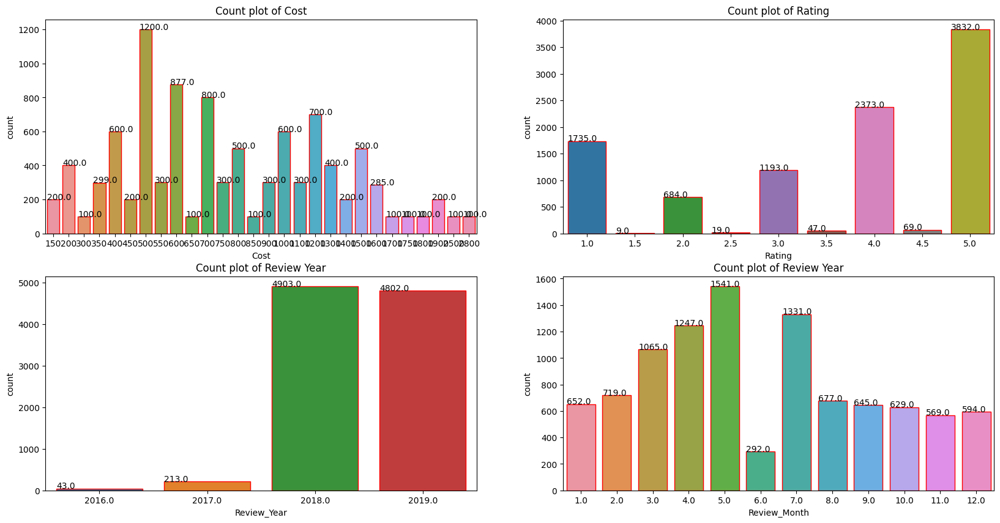

time: 2.16 s (started: 2023-08-04 09:37:08 +00:00)


In [ ]:
# Chart - 1 visualization code
plt.figure(figsize = (20,10))
plt.subplot(2,2,1)
ax = sns.countplot(x = 'Cost', data = df_inner,edgecolor = 'red')
for p in ax.patches:
  ax.annotate(str(p.get_height()),(p.get_x(),p.get_height()))
plt.title ('Count plot of Cost')

plt.subplot(2,2,2)
ax = sns.countplot(x = 'Rating', data = df_inner,edgecolor = 'red')
for p in ax.patches:
  ax.annotate(str(p.get_height()),(p.get_x(),p.get_height()))
plt.title ('Count plot of Rating')

plt.subplot(2,2,3)
ax = sns.countplot(x = 'Review_Year', data = df_inner,edgecolor = 'red')
for p in ax.patches:
  ax.annotate(str(p.get_height()),(p.get_x(),p.get_height()))
plt.title ('Count plot of Review Year')

plt.subplot(2,2,4)
ax = sns.countplot(x = 'Review_Month', data = df_inner,edgecolor = 'red')
for p in ax.patches:
  ax.annotate(str(p.get_height()),(p.get_x(),p.get_height()))
plt.title ('Count plot of Review Year')
plt.show()

##### 1. Why did you pick the specific chart?

The above plot gave the information about the count distribution of the Cost, Rating, Review_Year and Review_Month.We used plots because they are a useful tool for visualizing and understanding categorical data, and can be an effective way to communicate information to the wide audience.

##### 2. What is/are the insight(s) found from the chart?

In above plot gave the information about the count plot of following features of the dataset:
* Rating contain the **maximum in 5 star and slightly less in 4 star and minimum in 2 star** value distributed in the dataset.
* Review_Year feature having **almost total customer visit the resaturant in year of 2018 and 2019** and negligiable in 2017 and 2016 value distributed in the dataset.
* Review_Month contain the **maximum in 5th month(i.e May) and minimum in 6th month(i.e June)** value distributed in the dataset.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

According to the count plot, Response of the health insurance will be affected by all features of the dataset. If the Response of the feature woulde be increases then our bisuness model will be more profitabe, hence stock holder should be takes the future decision to achieve the businnes goal across the dataset.

#### Chart - 2

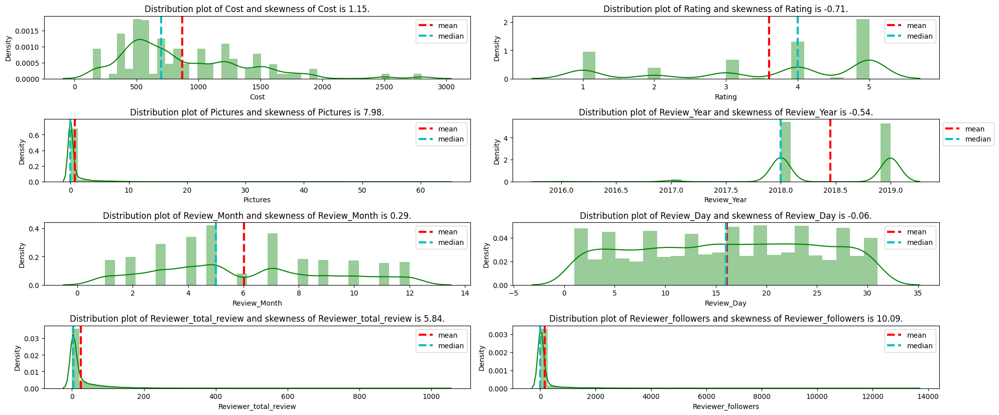

time: 11.6 s (started: 2023-08-04 09:37:11 +00:00)


In [ ]:
# Chart - 2 visualization code
plt.figure(figsize= (20,10))
for n,i in enumerate(numerical_features):
  plt.subplot(int(len(numerical_features)/2 + 1),2,n+1)
  plot = sns.distplot(df_inner[i],color = 'g').set(title= f'Distribution plot of {i} and skewness of {i} is {round(df_inner[i].skew(),2)}.')
  feature = df_inner[i]
  plt.axvline(feature.mean(), color='r', linestyle='dashed', linewidth=3,label= 'mean');  #red
  plt.axvline(feature.median(), color='c', linestyle='dashed', linewidth=3,label='median'); #cyan
  plt.legend(bbox_to_anchor = (1.0, 1))
  plt.tight_layout()

##### 1. Why did you pick the specific chart?

The distplot is plotted using the distplot function. The scatterplot displays the data distribution of a single variable in relation to the density distribution. The distplot function returns a plot with the density distribution and takes a data variable as an argument.We used plots because they are a useful tool for visualizing and understanding categorical data, and can be an effective way to communicate information to the wide audience.

##### 2. What is/are the insight(s) found from the chart?

On the above chart, we have to got the skewness of the data which feature having positive or negative skew. In continuous feature having Cost, Picture, Review_month, Reviewer_total_review and Reviewer_follower having positive skew value &  Rating, Review_Year and Review_Day having negative skew value.
* Mean value of the cost lie between 500 and 1000.
* Mean value of the rating lie between 3 and 5.
* Mean value of the picture lie between 0 and 10.
* Mean value of the Review_Year lie between 2018 and 2019.
* Mean value of the Review_Month lie on month of 6.
* Mean value of the Review_Day lie between on 15 and 20.
* Mean value of the Reviewer_total_review lie between 0 and 100.
* Mean value of the Reviewer_follower lie between 0 and 500.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

According to the density plot, Response of the health insurance will be affected by all continuous features of the dataset. If the Response of the feature woulde be increases then our bisuness model will be more profitabe, hence stock holder should be takes the future decision to achieve the businnes goal across the dataset.

#### Chart - 3

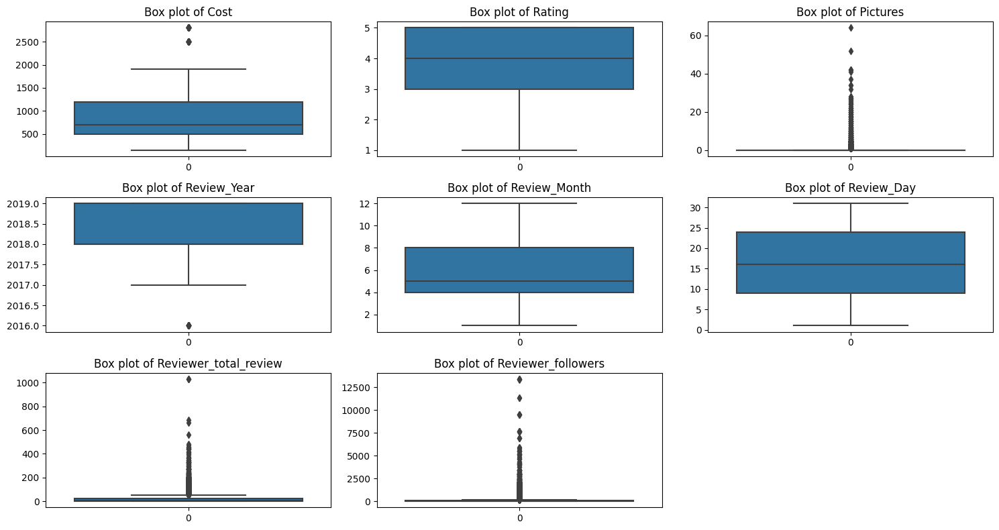

time: 4.22 s (started: 2023-08-04 09:37:22 +00:00)


In [ ]:
# Chart - 3 visualization code
plt.figure(figsize= (15,8))
for num,col in enumerate(numerical_features):
  plt.subplot(int(len(numerical_features)/3 + 1),3,num+1)
  sns.boxplot(df_inner[col]).set(title= f'Box plot of {col}')
  plt.tight_layout()

##### 1. Why did you pick the specific chart?

Box plot can combine data from various sources and display the findings in a single graph, making them incredibly efficient and simple to read. Box plots make it possible to compare data from several categories for faster, wiser decision-making.We used plots because they are a useful tool for visualizing and understanding categorical data, and can be an effective way to communicate information to the wide audience.

##### 2. What is/are the insight(s) found from the chart?

**Outliers :** On the above code, we have to found that percentace of outliers on the Cost, Picture, Review_year, Reviewer_total_review and Reviewer_follower features.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Outlier affect the output of the model which have to affect the mechine learning metrics. Stock holder take the decion of our business depending on output metrices, so we have to treated outlier then we have to use that data for our model.

#### Chart - 4

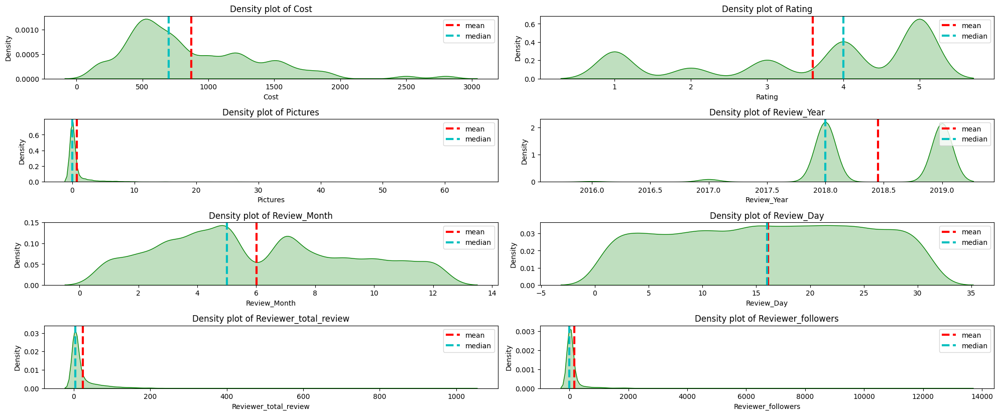

time: 6.23 s (started: 2023-08-04 09:37:26 +00:00)


In [ ]:
# Chart - 4 visualization code
plt.figure(figsize= (20,10))
for n,i in enumerate(numerical_features):
  plt.subplot(int(len(numerical_features)/2 + 1),2,n+1)
  plot = sns.kdeplot(df_inner[i],color = 'g',shade = True).set(title= f'Density plot of {i}')
  feature = df_inner[i]
  plt.axvline(feature.mean(), color='r', linestyle='dashed', linewidth=3,label= 'mean');  #red
  plt.axvline(feature.median(), color='c', linestyle='dashed', linewidth=3,label='median'); #cyan
  plt.legend(bbox_to_anchor = (1.0, 1))
  plt.tight_layout()

##### 1. Why did you pick the specific chart?

Using this chart, we have to found that whether the observation is high or low and whether they are concentated in one area or spread out the distribution.We used plots because they are a useful tool for visualizing and understanding categorical data, and can be an effective way to communicate information to the wide audience.

##### 2. What is/are the insight(s) found from the chart?

On the above chart, we have to got the skewness of the data which feature having positive or negative skew. In continuous feature having Cost, Picture, Review_month, Reviewer_total_review and Reviewer_follower having positive skew value &  Rating, Review_Year and Review_Day having negative skew value.
* Mean value of the cost lie between 500 and 1000.
* Mean value of the rating lie between 3 and 5.
* Mean value of the picture lie between 0 and 10.
* Mean value of the Review_Year lie between 2018 and 2019.
* Mean value of the Review_Month lie on month of 6.
* Mean value of the Review_Day lie between on 15 and 20.
* Mean value of the Reviewer_total_review lie between 0 and 100.
* Mean value of the Reviewer_follower lie between 0 and 500.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

With the help of the frequency distribution graph we generated for Cost, Rating, Picture, Review_Year, Review_Month, Review_Day, Reviewer_total_review and Reviewer_follower, we learned that many competing stores are situated close together. So, in order to survive in the cutthroat industry, companies needs design several methods.

#### Chart - 5

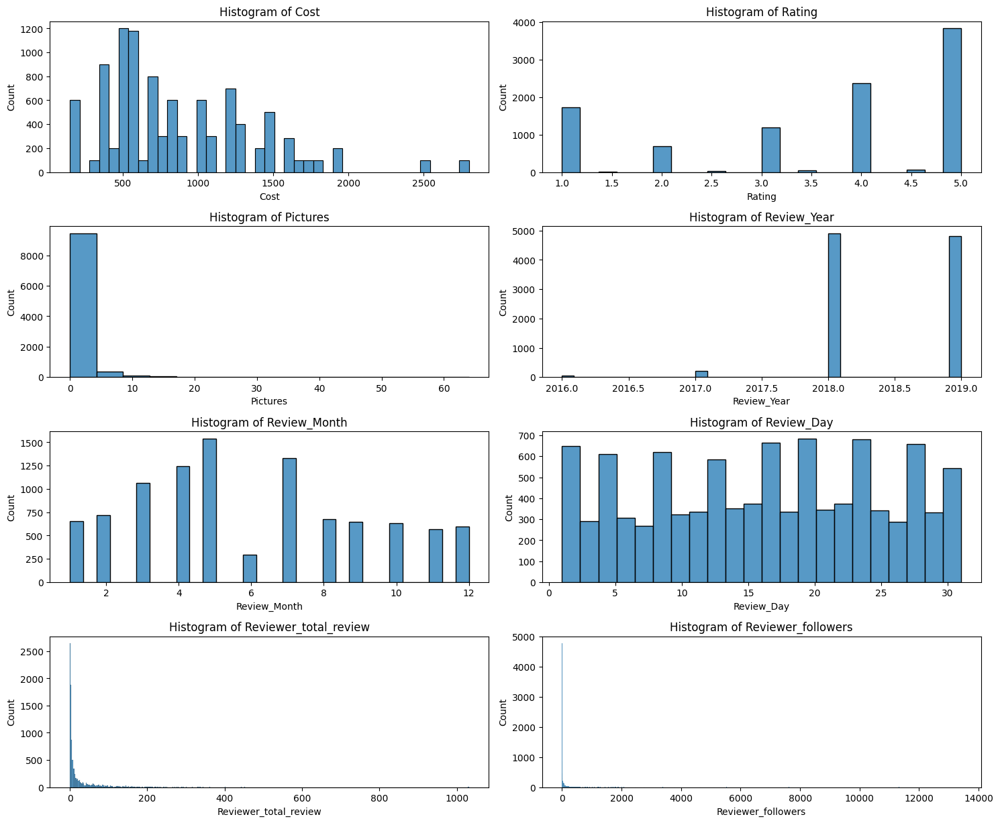

time: 9.43 s (started: 2023-08-04 09:37:33 +00:00)


In [ ]:
# Chart - 5 visualization code
plt.figure(figsize= (15,15))
for num,col in enumerate(numerical_features):
  plt.subplot(int(len(numerical_features)/2 + 1),2,num + 1)
  sns.histplot(df_inner[col]).set(title= f'Histogram of {col}')
  plt.tight_layout()

##### 1. Why did you pick the specific chart?

Histograms have been used to represent distribution of columns having numerical data, histogram is basically used to represent data provided in a form of some groups.It is accurate method for the graphical representation of numerical data distribution.It is a type of bar plot where X-axis represents the bin ranges while Y-axis gives information about frequency.

##### 2. What is/are the insight(s) found from the chart?

On the above chart, we have to got the in continuous features, it is clearly show that Cost, Picture, Review_year, Reviewer_total_review and Reviewer_follower features having outliers are present.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Outlier affect the output of the model which have to affect the mechine learning metrics. Stock holder take the decion of our business depending on output metrices, so we have to treated outlier then we have to use that data for our model.

#### Chart - 6

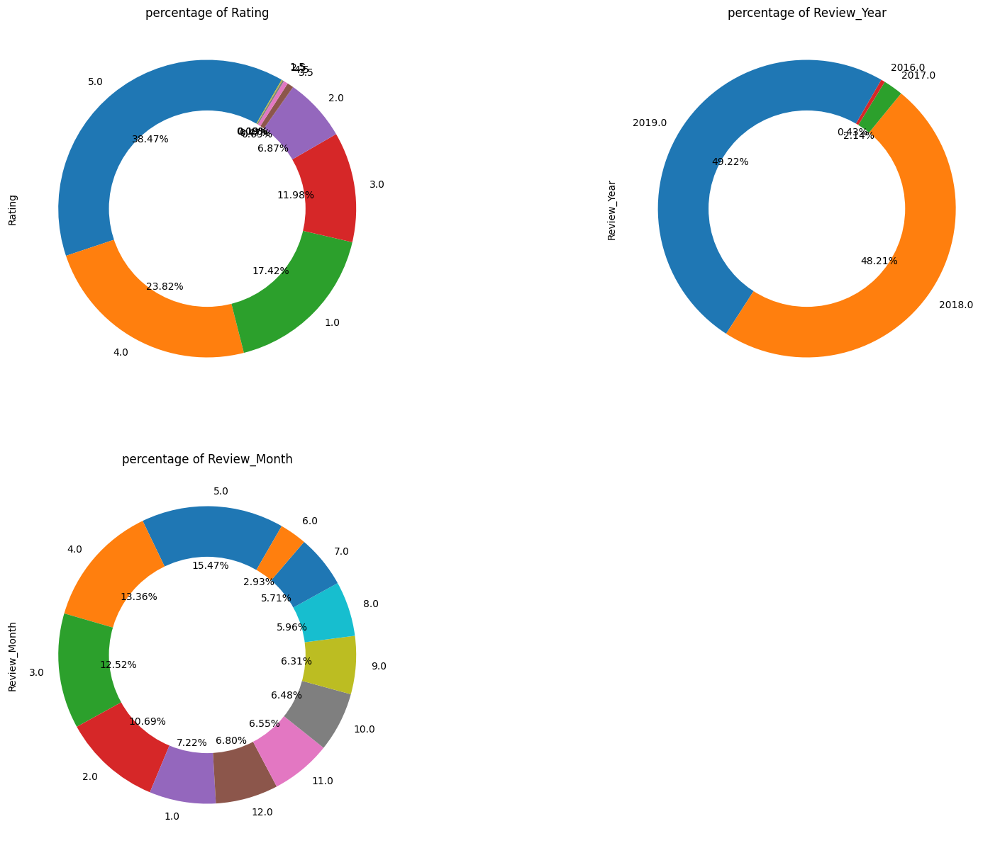

time: 735 ms (started: 2023-08-04 09:37:42 +00:00)


In [ ]:
# Chart - 6 visualization code
col = ['Rating','Review_Year','Review_Month']
plt.figure(figsize = (20,15))
for n,i in enumerate(col):
  plt.subplot(2,2,n+1)
  df_inner[i].value_counts().plot(kind='pie',
                               autopct="%1.2f%%",
                               startangle= 60,
                               shadow=False,
                               labels=df_inner[i].unique(),
                              # colors=['yellow','red'],
                               explode=[0 for i in range(len(df_inner[i].unique()))],
                               title = f'percentage of {i}'
                              )
  centre_circle = plt.Circle((0, 0), 0.66, fc='white')
  fig = plt.gcf()
  fig.gca().add_artist(centre_circle)
  plt.tight_layout

##### 1. Why did you pick the specific chart?

Using this chart, it's provide the information about the percentage of the different type of distribution among the dataset values.We used plots because they are a useful tool for visualizing and understanding categorical data, and can be an effective way to communicate information to the wide audience.

##### 2. What is/are the insight(s) found from the chart?

On the following chart, we have to obsearve the following insight:
* Here we have to find the star distributin maximum in 5 star which is 38.47% and minimum in 2 star which is 6.87%.
* Here we found that the higher in 2019 which is 49.22%, in 2018 is 48.21% , in 2017 is 2.14% and lower in 2016 which is 0.43%. Hence we can say that  hotel having more business in 2019 and less business in 2016.
* Here we found that the customer distribution in 1st month which is 7.22%, in 2nd month is 10.69% , in 3rd month is 12.52%, in 4th months is 13.36%, in 5th month is 15.47% , in 6th month is 2.93%, in 7th months is 5.71%, in 8th months is 5.96%, in 9th month is 6.31% , in 10th month is 6.48%, in 11th months is 6.55%, and in 12th month which is 6.80%. Hence we can say that  hotel having more business in 5th months and less business in 6th month.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

According to the pie chart, Response of the customer will be affected by all features of the dataset. If the Response of the feature woulde be increases then our bisuness model will be more profitabe, hence stock holder should be takes the future decision to achieve the businnes goal across the dataset.

### **Bivariate Analysis**

#### Chart - 7

In [ ]:
#Price point of restaurants
cost_point = df_inner.groupby('Restaurant').agg({'Rating':'mean',
        'Cost': 'mean'}).reset_index()

time: 7.75 ms (started: 2023-08-04 09:37:43 +00:00)


In [ ]:
#geting the top 10 hotel that show maximum engagement
most_engaged_hotel = cost_point.sort_values('Rating', ascending = False)

time: 1.83 ms (started: 2023-08-04 09:37:43 +00:00)


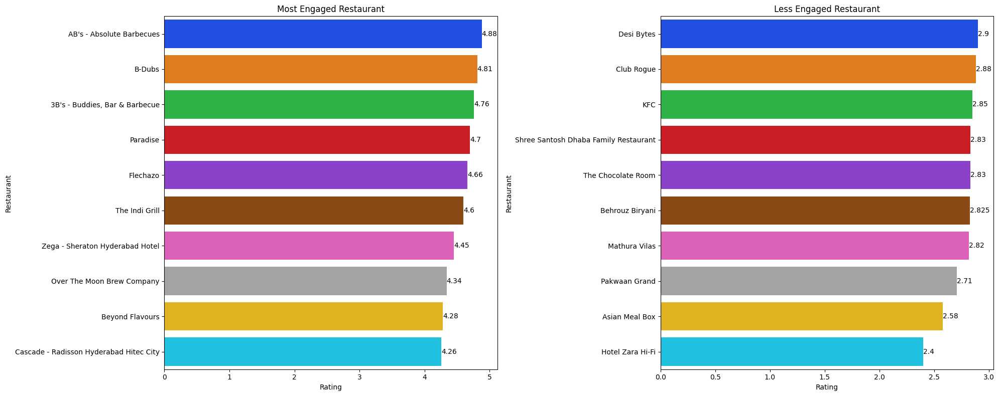

time: 883 ms (started: 2023-08-04 09:37:43 +00:00)


In [ ]:
# Chart - 7- visualization code for most liked
plt.figure(figsize = (20,8))
plt.subplot(1,2,1)
plot = sns.barplot(data = most_engaged_hotel[:10], x = 'Rating', y = 'Restaurant',palette='bright')
plot.bar_label(plot.containers[0])
plt.title('Most Engaged Restaurant')
plt.subplot(1,2,2)
plot = sns.barplot(data = most_engaged_hotel[-10:], x = 'Rating', y = 'Restaurant',palette='bright')
plot.bar_label(plot.containers[0])
plt.title('Less Engaged Restaurant')
plt.tight_layout()

##### 1. Why did you pick the specific chart?

This chart gives the information about the relation of Most Engaged Restaurant and Less Engaged Restaurant.We used bar plots because they are a useful tool for visualizing and understanding categorical data, and can be an effective way to communicate information to the wide audience.

##### 2. What is/are the insight(s) found from the chart?

AB's - Absolute Barbecues, show maximum engagement and retention as it has maximum number of rating on average and Hotel Zara Hi-Fi show lowest engagement as has lowest average rating.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Engagement and client retention are crucial for any business since they are essential to profitability and expansion. People that utilise the same brand over others have the highest retention rates.

Because of the popularity of the app and to increase their sales and demand, some restaurants have lower ratings, which can indicate negative growth if not monitored as to why they receive fewer orders. For instance, KFC is listed in low ratings even though they undoubtedly have different outlets and their own outsourcing and are not fully committed to the platform in order to generate revenue.

#### Chart - 8

In [ ]:
# Extract the restaurant name and its cost
cost_of_restaurant = df_restaurant.sort_values('Cost',ascending= False)[['Restaurant','Cost']]

time: 3.5 ms (started: 2023-08-04 09:37:44 +00:00)


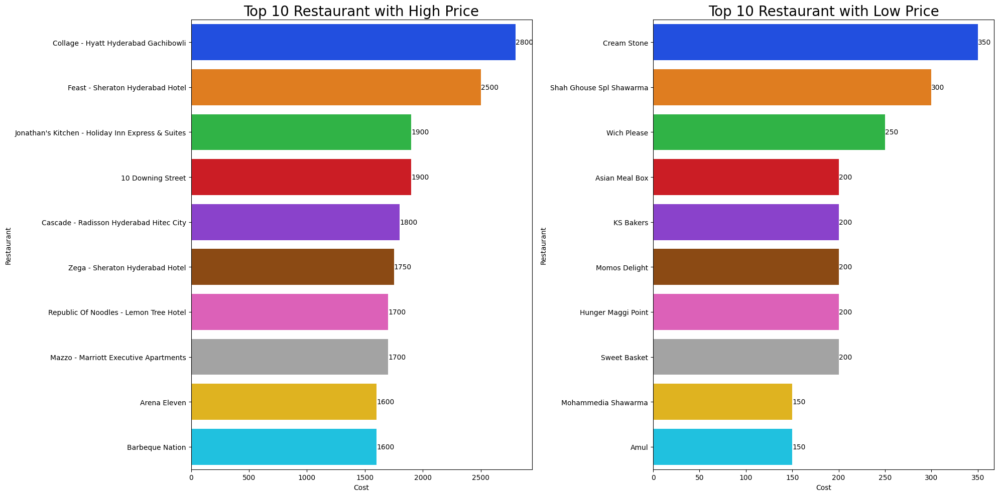

time: 1.4 s (started: 2023-08-04 09:37:44 +00:00)


In [ ]:
# Chart - 8 visualization code
plt.figure(figsize= (20,10))
plt.subplot(1,2,1)
plot = sns.barplot(x='Cost',y= 'Restaurant',data= cost_of_restaurant[:10],palette='bright')
plot.bar_label(plot.containers[0])
plt.title('Top 10 Restaurant with High Price',size = 20)
plt.subplot(1,2,2)
plot = sns.barplot(x='Cost',y= 'Restaurant',data= cost_of_restaurant[-10:],palette='bright')
plot.bar_label(plot.containers[0])
plt.title('Top 10 Restaurant with Low Price',size = 20)
plt.tight_layout()

##### 1. Why did you pick the specific chart?

Here I choose barplot because bar plot is a good choice for plotting hotel name and price point as it is a simple and effective way to display the comparison of different categories (hotel names) and their corresponding values (price points) on the same chart.
Also, it allow to have a sense of the price range of each hotel and how they compare to each other.

##### 2. What is/are the insight(s) found from the chart?

Price point for high rated hotel AB's= Absolute Barbecues is 1500 and price point for low rated restaurant Hotel Zara Hi-Fi is 400.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Since it is customer centered business i.e., direct to consumer it is important to understand price point which makes this business more affordable for evryone, therefore it is important for business to crack the price point.

Here most liked restaurant has a price point of 1500 which is even though a little high than average but as this business is all about food quality and taste it show maximum engagement which means it serve best quality of food, however deep dive on analysing review text can exactly give why this price point is prefered most.

Some restaurant with lowest rating even with low price point is not making engagement, this may create a negative impact on business.

However it can not be finalized that this hotel should unlisted as there may be chance of different cuisine they both serve and it also depend upon the locality they both serve, therefore based on that small promotional offers can also be given for low rated restaurant to increase sales.

#### Chart - 9

In [ ]:
#merging average rating and cost to find rating for expensive hotel
expected_revenue = avg_restaurant_rating.merge(df_restaurant[['Restaurant','Cost']], on = 'Restaurant')
#calculating expected revenue based on total review recieved
expected_revenue['Expected_Revenue'] = expected_revenue['Total_review'] * expected_revenue['Cost']

time: 15 ms (started: 2023-08-04 09:37:45 +00:00)


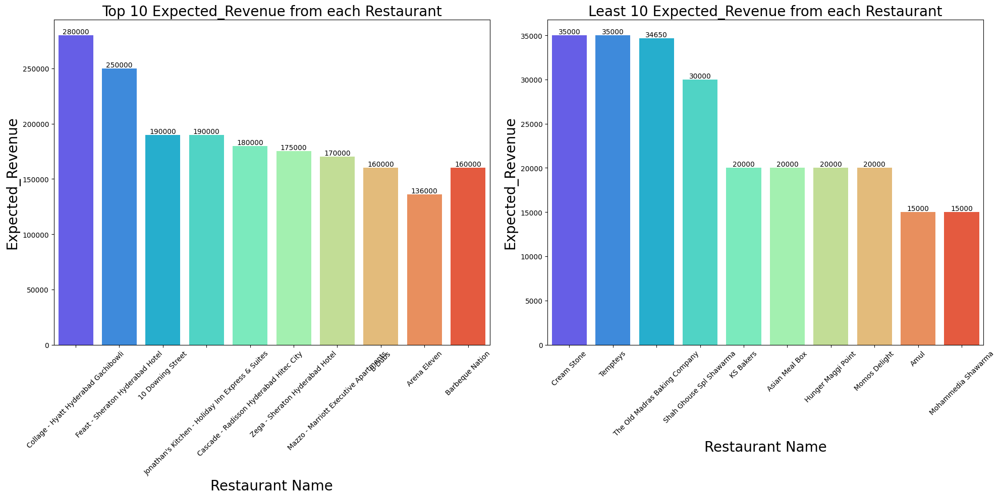

time: 1.53 s (started: 2023-08-04 09:37:45 +00:00)


In [ ]:
# Chart - 9 visualization code
fig = plt.figure(figsize=[20,10])
data = expected_revenue.sort_values('Cost', ascending  = False)
plt.subplot(1,2,1)
plot = sns.barplot(data= data[:10], x='Restaurant', y= 'Expected_Revenue', palette ="rainbow")
plot.bar_label(plot.containers[0])
plt.title("Top 10 Expected_Revenue from each Restaurant", size = 20)
plt.xlabel('Restaurant Name', size = 20)
plt.xticks(rotation=45)
plt.ylabel('Expected_Revenue', size = 20)
plt.subplot(1,2,2)
plot = sns.barplot(data= data[-10:], x='Restaurant', y= 'Expected_Revenue', palette ="rainbow")
plot.bar_label(plot.containers[0])
plt.title("Least 10 Expected_Revenue from each Restaurant", size = 20)
plt.xlabel('Restaurant Name', size = 20)
plt.xticks(rotation=45)
plt.ylabel('Expected_Revenue', size = 20)
plt.tight_layout()

##### 1. Why did you pick the specific chart?

Here I choose barplot because bar plot is a good choice for plotting hotel name and price point as it is a simple and effective way to display the comparison of different categories (hotel names) and their corresponding values (price points) on the same chart.
Also, it allow to have a sense of the price range of each hotel and how they compare to each other.

##### 2. What is/are the insight(s) found from the chart?

We have to fought that top 10 and bottom 10 restaurant name according to expected revenue generated of the restaurant.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Most expensive product are always center of attraction for a niche market (subset of the market on which a specific product is focused) at the same time for a business purpose, this product are preffered to be most revenue generating market.

Definetly for food delivery platform Zomato, it is very important to focus and improve sales based on these hotels.

#### Chart - 10

In [ ]:
most_followed_reviewer.columns

Index(['Reviewer', 'Reviewer_total_review', 'Reviewer_followers',
       'Average Rating'],
      dtype='object')

time: 4.81 ms (started: 2023-08-04 09:37:47 +00:00)


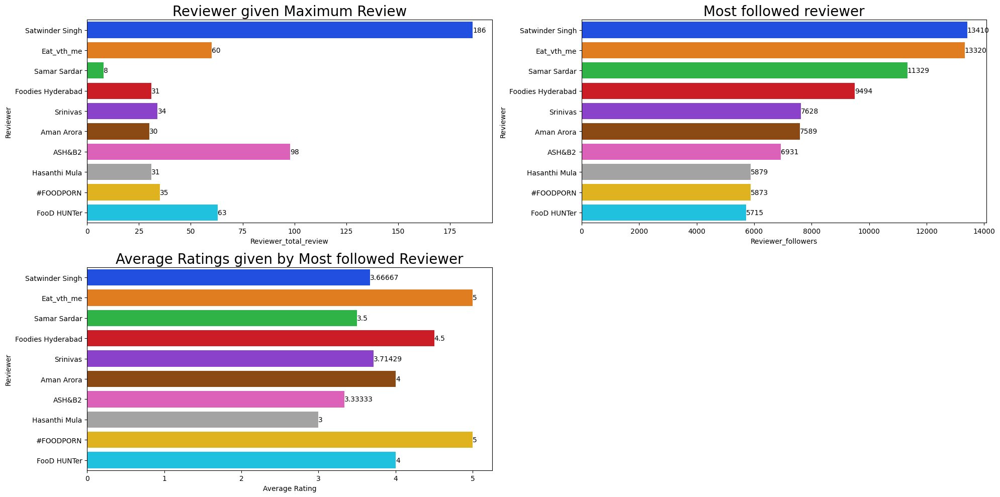

time: 1.81 s (started: 2023-08-04 09:37:47 +00:00)


In [ ]:
# Chart - 10 visualization code
plt.figure(figsize = (20,10))
plt.subplot(2,2,1)
plot = sns.barplot(data = most_followed_reviewer[:10], x = 'Reviewer_total_review',y = 'Reviewer', palette='bright')
plot.bar_label(plot.containers[0])
plt.title('Reviewer given Maximum Review',size = 20)
plt.subplot(2,2,2)
plot = sns.barplot(data = most_followed_reviewer[:10], x = 'Reviewer_followers',y = 'Reviewer', palette='bright')
plot.bar_label(plot.containers[0])
plt.title('Most followed reviewer',size = 20)
plt.subplot(2,2,3)
plot = sns.barplot(data = most_followed_reviewer[:10], x = 'Average Rating',y = 'Reviewer', palette='bright')
plot.bar_label(plot.containers[0])
plt.title('Average Ratings given by Most followed Reviewer',size = 20)
plt.tight_layout()

##### 1. Why did you pick the specific chart?

Understanding the frequency of rating, followers, and overall reviews in relation to the reviewer is made easier by barplots.
The association between these variables and how they relate to one another for each reviewer may be seen by plotting the total number of reviews, the average reviewer rating, and the total number of followers. It can also reveal information about reviewers' ratings, how many reviews they typically receive, etc.

##### 2. What is/are the insight(s) found from the chart?

Satwinder singh is the most popular critic who has maximum number of follower and on an average he give 3.5 rating.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Making strategic judgements about which reviewers to promote and extend can be done using this information. For instance, if a certain reviewer has a lot of followers and a high average rating, Zomato might concentrate on marketing their reviews to users.

It's vital to remember that this chart does not contain all of the company's information and cannot serve as the sole deciding element. However, it may be beneficial for food advertising based on feedback.

#### Chart - 11

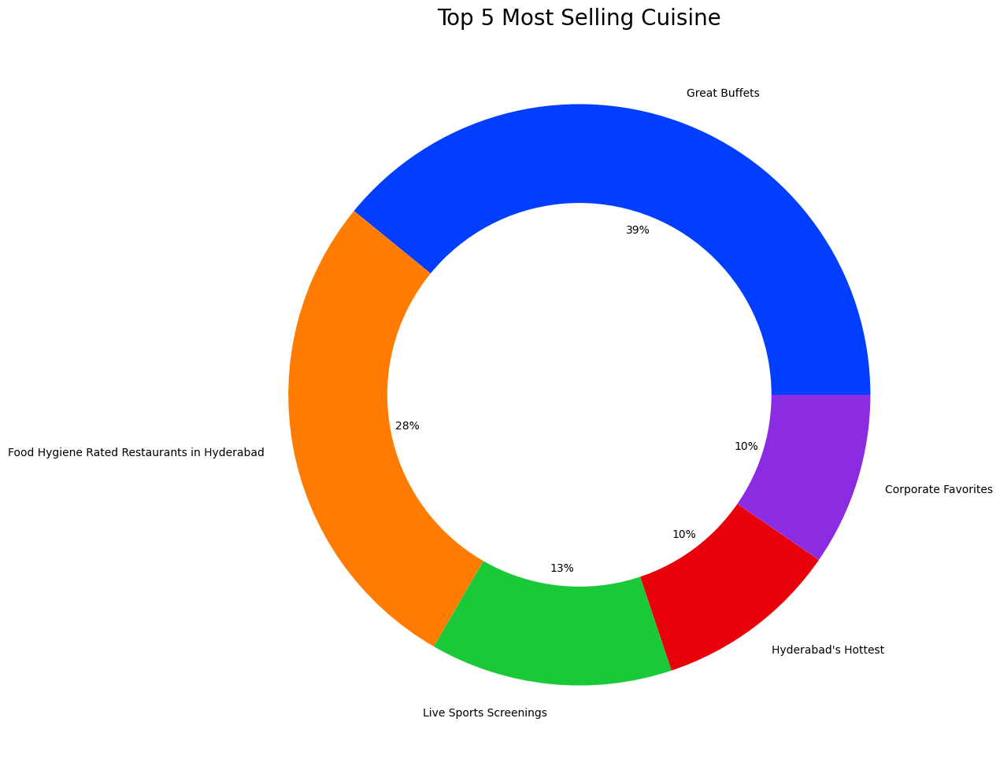

time: 365 ms (started: 2023-08-04 09:37:49 +00:00)


In [ ]:
# Chart - 11 visualization code
data = df_cuisine.sort_values('Number of Restaurant', ascending = False)['Number of Restaurant'].tolist()[:5]
labels = df_collection.sort_values('Number of Restaurant',ascending = False)['Tags'].tolist()[:5]

#define Seaborn color palette to use
colors = sns.color_palette('bright')[:5]

#create ring chart
plt.figure(figsize = (15,12))
plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%')
plt.title('Top 5 Most Selling Cuisine', size =20)
centre_circle = plt.Circle((0, 0), 0.66, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.show()

##### 1. Why did you pick the specific chart?

Here I choose to use pie chart because it show proportion of each quantity and used wordcloud because it show all text and highlight the most frequent words.

##### 2. What is/are the insight(s) found from the chart?

Based on the above chart it is clear that most of the hotel sold North Indian food followed by chinese.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Plotting a pie chart of cuisine types can help to identify the most popular cuisine types among its customers. This information can be used to make strategic decisions about which cuisines to focus on promoting and expanding. For example, as the significant portion of customers are searching for north indian restaurants, Zomato could focus on adding more north indian restaurants to its platform and promoting them to customers.

#### Chart - 12

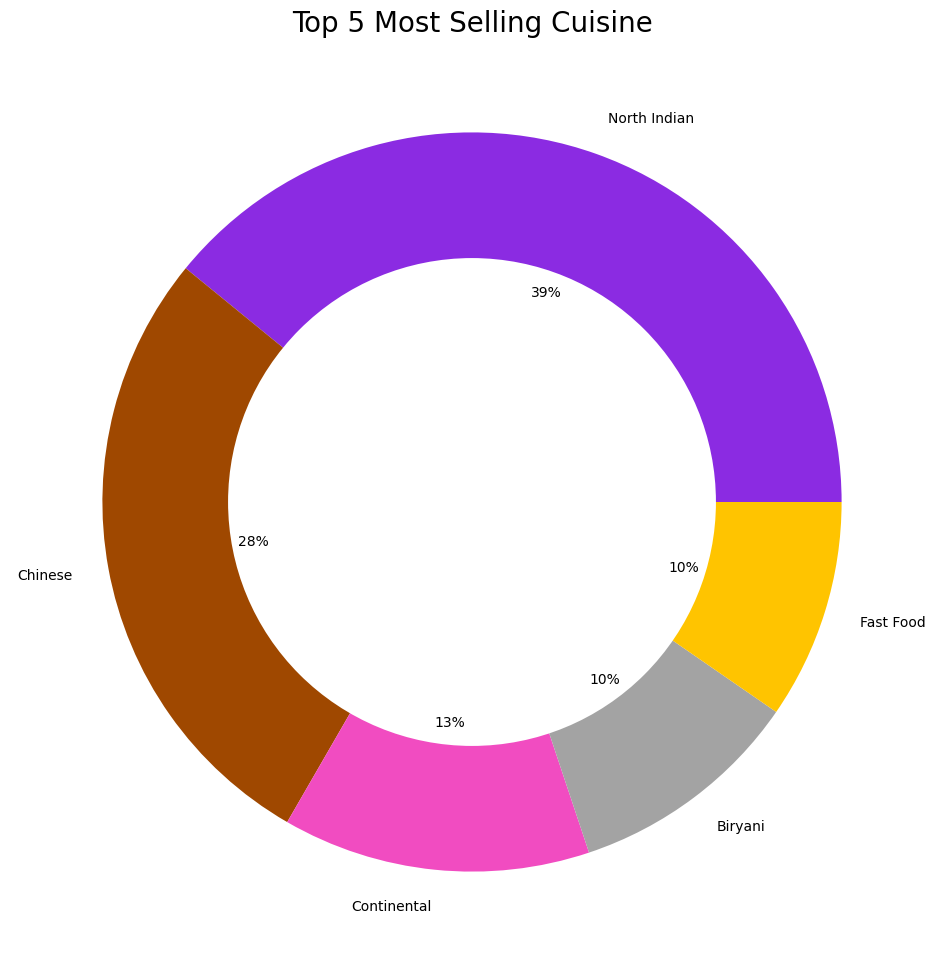

time: 228 ms (started: 2023-08-04 09:37:49 +00:00)


In [ ]:
# Chart - 12 visualization code pie chart for top 5 mpst selling cuisine
data = df_cuisine.sort_values('Number of Restaurant', ascending = False)['Number of Restaurant'].tolist()[:5]
labels = df_cuisine.sort_values('Number of Restaurant', ascending = False)['Cuisine'].tolist()[:5]

#define Seaborn color palette to use
colors = sns.color_palette('bright')[4:9]

#create ring chart
plt.figure(figsize = (15,12))
plt.pie(data, labels = labels, colors = colors, autopct='%.0f%%')
plt.title('Top 5 Most Selling Cuisine', size =20)
centre_circle = plt.Circle((0, 0), 0.66, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.show()

##### 1. Why did you pick the specific chart?

Here I choose to use pie chart because it show proportion of each quantity and used wordcloud because it show all text and highlight the most frequent words.

##### 2. What is/are the insight(s) found from the chart?

Based on the above chart it is clear that most of the hotel sold North Indian food followed by chinese.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Plotting a pie chart of cuisine types can help to identify the most popular cuisine types among its customers. This information can be used to make strategic decisions about which cuisines to focus on promoting and expanding. For example, as the significant portion of customers are searching for north indian restaurants, Zomato could focus on adding more north indian restaurants to its platform and promoting them to customers.

### **Multivariate Analysis**

#### Chart - 14 - Correlation Heatmap

Text(0.5, 1.0, 'Correlation Heatmap for Zamato')

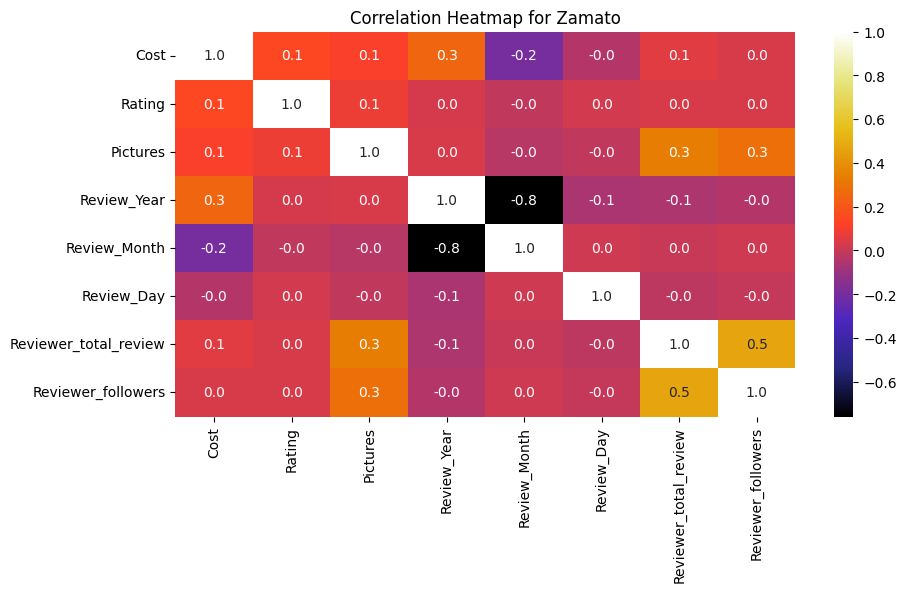

time: 597 ms (started: 2023-08-04 09:37:49 +00:00)


In [ ]:
# Correlation Heatmap visualization code
f, ax = plt.subplots(figsize=(10, 5))
sns.heatmap(df_inner.corr(),annot = True,fmt='0.1f',annot_kws={'size':10},vmax =1,cmap= plt.cm.CMRmap)
plt.title('Correlation Heatmap for Zamato')

##### 1. Why did you pick the specific chart?

It can give multiple visual aids in a single frame and various insights related to the data can be gained in one single look.

A correlation matrix is a table showing correlation coefficients between variables. Each cell in the table shows the correlation between two variables. A correlation matrix is used to summarize data, as an input into a more advanced analysis, and as a diagnostic for advanced analyses. The range of correlation is [-1,1].

Thus to know the correlation between all the variables along with the correlation coeficients, i used correlation heatmap.

##### 2. What is/are the insight(s) found from the chart?

From the above correlation heatmap, it can be depicted that few features are correlated, like reviewer total review is related to reviewer follower and again reviewer total review is related to pictures.

Rest all correlation can be depicted from the above chart.


#### Chart - 15 - Pair Plot

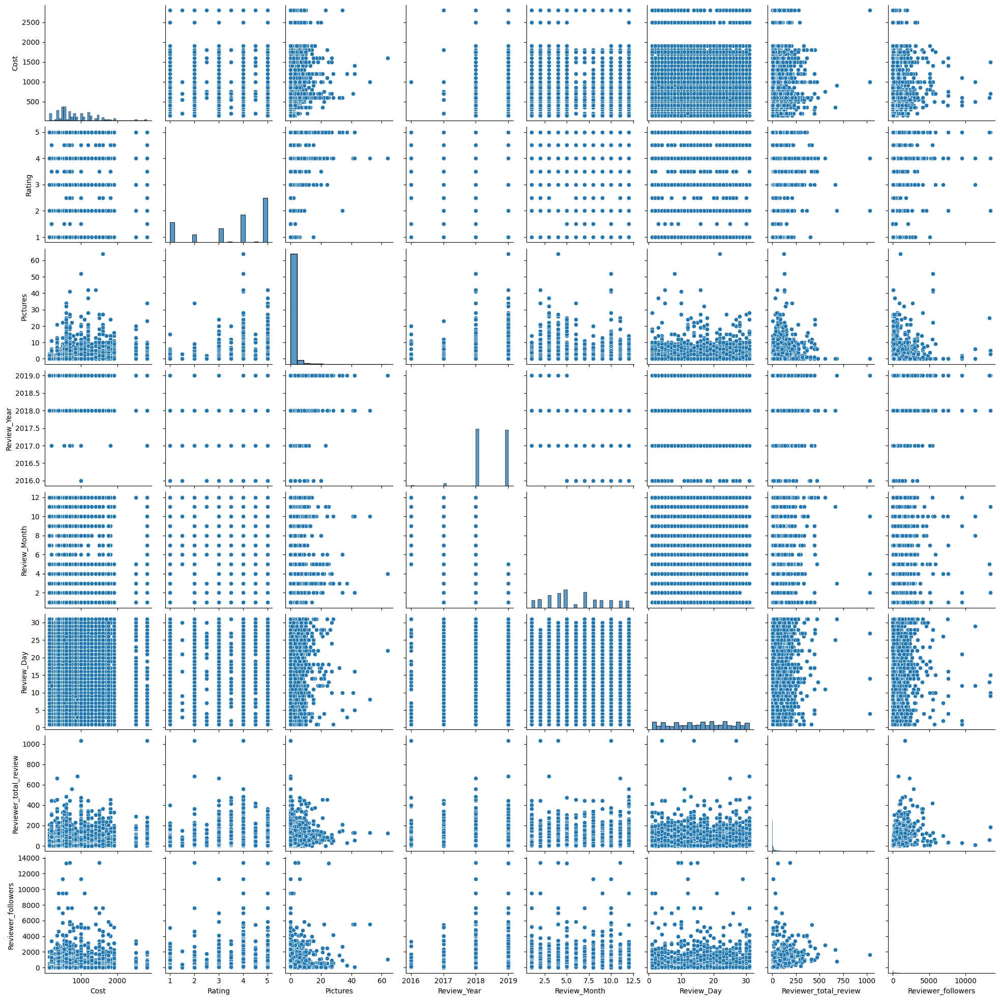

time: 33.3 s (started: 2023-08-04 09:37:50 +00:00)


In [ ]:
# Pair Plot visualization code
sns.pairplot(df_inner)

##### 1. Why did you pick the specific chart?

Pair plot is used to understand the best set of features to explain a relationship between two variables or to form the most separated clusters. It also helps to form some simple classification models by drawing some simple lines or make linear separation in our data-set.

Thus, I used pair plot to analyse the patterns of data and realationship between the features. It's exactly same as the correlation map but here you will get the graphical representation.

##### 2. What is/are the insight(s) found from the chart?

From the above chart I got to know, there are less linear relationship between variables and data poiunts aren't linearly separable.  In this whole pair plot, the importance of area code can be seen and the number of hotel with respect to different features are really insightful.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

We define the three hypothetical statements & performed the needed tests for the same:

Statement-1:

* Null Hypothesis: There is no relationship between Cost and Rating.(H0: 𝛽1 = 0)
* Alternate Hypothesis: There is a relationship between Cost and Rating.(H0: 𝛽1 > 0)
* Test: Simple Linear Regression Analysis


Statement-2:

* Null Hypothesis: There is no relationship between Reviewer_followers and Rating.(H0: 𝛽1 = 0)
* Alternate Hypothesis: There is a relationship between Reviewer_follower and Rating.(H0: 𝛽1 > 0)
* Test: Simple Linear Regression Analysis


Statement-3:

* Null Hypothesis: There is no relationship between Cuisines and Rating.(H0: 𝛽1 = 0)
* Alternate Hypothesis: There is a relationship between Cuisines and Rating.(H0: 𝛽1 > 0)
* Test: Chi-Squared Test.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.



* Null Hypothesis: There is no relationship between Cost and Rating.(H0: 𝛽1 = 0)
* Alternate Hypothesis: There is a relationship between Cost and Rating.(H0: 𝛽1 > 0)
* Test: Simple Linear Regression Analysis

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
from scipy.stats import pearsonr
first_sample = df_inner['Cost']
second_sample= df_inner['Rating']
stat, p_value = pearsonr(first_sample,second_sample)
print(f'Correlation between Cost & Rating: {round(stat,2)}')
print(f'P_Value : {round(p_value,2)}')
print('\n')
if p_value > 0.05:
  print('Accept the Null Hypothesis')
else:
  print('Reject the Null Hypothesis')

print('\n')

Correlation between Cost & Rating: 0.14
P_Value : 0.0


Reject the Null Hypothesis


time: 8.17 ms (started: 2023-08-04 09:38:23 +00:00)


##### Which statistical test have you done to obtain P-Value?

We have used Pearson Correlation test to obtain P-Value along with Pearson Correlation coefficient value.It is a measure of linear correlation between two sets of data.

##### Why did you choose the specific statistical test?

We want to check the relationship between two features if they are positively or negatively correlated.P-value and Pearson Correlation coefficient will always have a value between -1 and 1.Here we can see that after applying test on Cost and Rating features we got Correlation coefficient as 0.14 which implies that theses two features are having weak positve correlation between them.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

* Null Hypothesis: There is no relationship between Reviewer_followers and Rating.(H0: 𝛽1 = 0)
* Alternate Hypothesis: There is a relationship between Reviewer_follower and Rating.(H0: 𝛽1 > 0)
* Test: Simple Linear Regression Analysis

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value
from scipy.stats import pearsonr
first_sample = df_inner['Reviewer_followers']
second_sample= df_inner['Rating']
stat, p_value = pearsonr(first_sample,second_sample)
print(f'Correlation between Reviewer_followers & Rating: {round(stat,2)}')
print(f'P_Value : {round(p_value,2)}')
print('\n')
if p_value > 0.05:
  print('Accept the Null Hypothesis')
else:
  print('Reject the Null Hypothesis')

print('\n')

Correlation between Reviewer_followers & Rating: 0.04
P_Value : 0.0


Reject the Null Hypothesis


time: 12.1 ms (started: 2023-08-04 09:38:23 +00:00)


##### Which statistical test have you done to obtain P-Value?

We have used Pearson Correlation test to obtain P-Value along with Pearson Correlation coefficient value.It is a measure of linear correlation between two sets of data.

##### Why did you choose the specific statistical test?

We want to check the relationship between two features if they are positively or negatively correlated.P-value and Pearson Correlation coefficient will always have a value between -1 and 1.Here we can see that after applying test on Reviewer_followers and Rating features we got Correlation coefficient as 0.04 which implies that theses two features are having weak positve correlation between them.

### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.


* Null Hypothesis: There is no relationship between Cuisines and Rating.(H0: 𝛽1 = 0)
* Alternate Hypothesis: There is a relationship between Cuisines and Rating.(H0: 𝛽1 > 0)
* Test: Chi-Squared Test.

#### 2. Perform an appropriate statistical test.

In [ ]:
pd.crosstab(df_inner['Cuisines'], df_inner['Rating'])

Rating,1.0,1.5,2.0,2.5,3.0,3.5,4.0,4.5,5.0
Cuisines,,,,,,,,,
American,1,0,1,0,2,0,8,0,88
"American, Chinese, North Indian, Kebab, South Indian",18,0,4,0,14,0,24,0,40
"American, Fast Food, Salad, Burger",10,0,4,0,6,0,15,0,42
"American, Wraps, Desserts",14,0,7,0,19,0,27,0,33
"Andhra, Biryani, Hyderabadi, North Indian",24,0,8,0,8,0,17,0,43
...,...,...,...,...,...,...,...,...,...
"North Indian, South Indian",23,0,4,0,6,0,10,0,57
"Seafood, Goan, North Indian, Continental, Asian",5,0,5,0,5,0,33,0,52
"South Indian, North Indian, Chinese",44,0,13,0,26,0,48,0,69


time: 76.5 ms (started: 2023-08-04 09:38:23 +00:00)


In [ ]:
# Perform Statistical Test to obtain P-Value
# Import liberary
from scipy.stats import chi2_contingency

# create a contingency table
ct = pd.crosstab(df_inner['Cuisines'], df_inner['Rating'])

# perform chi-squared test
chi2, p, dof, expected = chi2_contingency(ct)
print(f'Chi-Squqred value between Cost & Rating: {round(chi2,2)}')
print(f'P_Value : {round(p_value,2)}')
print(f'Degree of freedom : {dof}')
print(f'Expected value : {expected[0]}')
print('\n')
if p_value > 0.05:
  print('Accept the Null Hypothesis')
else:
  print('Reject the Null Hypothesis')

print('\n')

Chi-Squqred value between Cost & Rating: 3984.03
P_Value : 0.0
Degree of freedom : 704
Expected value : [17.41792993  0.09035237  6.86678044  0.1907439  11.97670917  0.47184018
 23.82290935  0.69270154 38.47003313]


Reject the Null Hypothesis


time: 46 ms (started: 2023-08-04 09:38:23 +00:00)


##### Which statistical test have you done to obtain P-Value?

For the third hypothesis, I have used chi-squared test for independence to test the relationship between the variety of cuisines offered by a restaurant and its rating.

##### Why did you choose the specific statistical test?

 I choose this test because it is suitable for comparing the relationship between two categorical variables. This would involve creating a contingency table with the number of restaurants that offer each cuisine as the rows and the rating of the restaurant as the columns.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

,missing_value,% of missing values,Data_Type
Restaurant,0,0.0,object
Links,0,0.0,object
Cost,0,0.0,int64
Cuisines,0,0.0,object
Timings,0,0.0,object
Reviewer,0,0.0,object
Review,0,0.0,object
Rating,0,0.0,float64
Metadata,0,0.0,object
Time,0,0.0,object


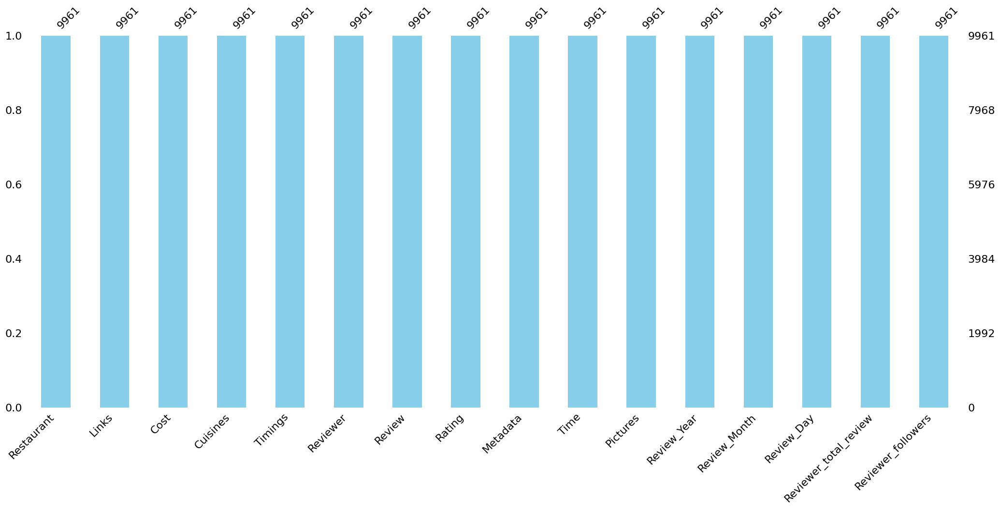

time: 7.66 s (started: 2023-08-05 20:03:41 +00:00)


In [99]:
# Handling Missing Values & Missing Value Imputation
missing_func(df_inner)

#### What all missing value imputation techniques have you used and why did you use those techniques?

As we have already treated null values so we do not have any more missing/null/duplicate values in our dataset and our dataset is good to go. In this dataset there is no null value preset in the dataset so there is no any method used to fill the NULL value.

### 2. Handling Outliers

#### **Anmoly Detection**

In [100]:
#Anamoly detection
# Import Isolation Forest liberary
from sklearn.ensemble import IsolationForest
#checking for normal distribution
def normal_distribution(df):
  numerical_features = [i for i in df.columns if df[i].dtypes != 'object']
  for i in numerical_features:
    print(f'Skewness of {i} : {round(df[i].skew(),2)}')
    print(f'Kurtosis of {i} : {round(df[i].kurt(),2)}')
    print('\n')


time: 239 ms (started: 2023-08-05 20:03:49 +00:00)


In [101]:
# Check the normal distribution of dataset
normal_distribution(df_inner)

Skewness of Cost : 1.15
Kurtosis of Cost : 1.57


Skewness of Rating : -0.71
Kurtosis of Rating : -0.95


Skewness of Pictures : 7.98
Kurtosis of Pictures : 105.55


Skewness of Review_Year : -0.54
Kurtosis of Review_Year : 0.15


Skewness of Review_Month : 0.29
Kurtosis of Review_Month : -0.94


Skewness of Review_Day : -0.06
Kurtosis of Review_Day : -1.16


Skewness of Reviewer_total_review : 5.84
Kurtosis of Reviewer_total_review : 67.22


Skewness of Reviewer_followers : 10.09
Kurtosis of Reviewer_followers : 151.31


time: 28 ms (started: 2023-08-05 20:03:49 +00:00)


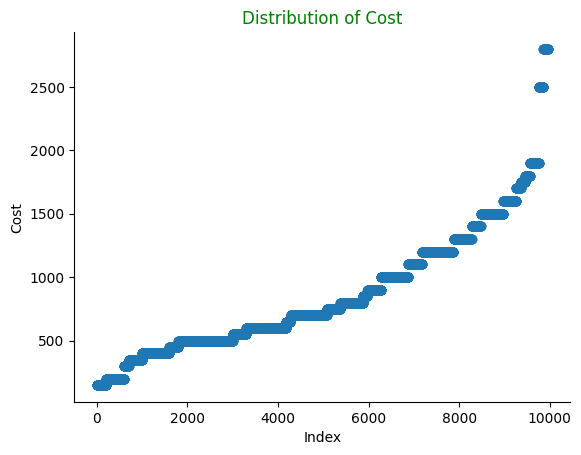

time: 839 ms (started: 2023-08-05 20:03:49 +00:00)


In [102]:
# Ploting of the Cost
plt.scatter(range(df_inner.shape[0]), np.sort(df_inner['Cost'].values))
plt.xlabel('Index')
plt.ylabel('Cost')
plt.title('Distribution of Cost',color = 'green')
sns.despine()

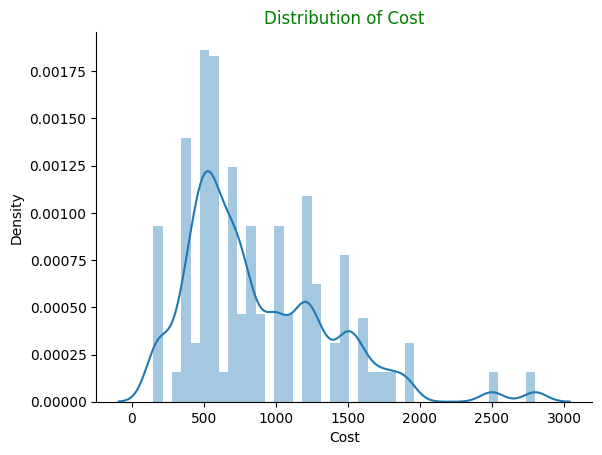

time: 1.02 s (started: 2023-08-05 20:03:50 +00:00)


In [103]:
# Distribution plot of Cost
sns.distplot(df_inner['Cost'])
plt.title('Distribution of Cost',color = 'green')
sns.despine()

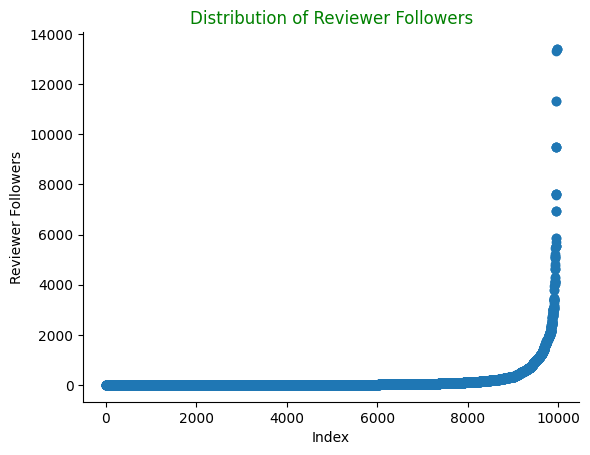

time: 822 ms (started: 2023-08-05 20:03:51 +00:00)


In [104]:
# Ploting of the Reviewer_followers
plt.scatter(range(df_inner.shape[0]), np.sort(df_inner['Reviewer_followers'].values))
plt.xlabel('Index')
plt.ylabel('Reviewer Followers')
plt.title('Distribution of Reviewer Followers',color = 'green')
sns.despine()

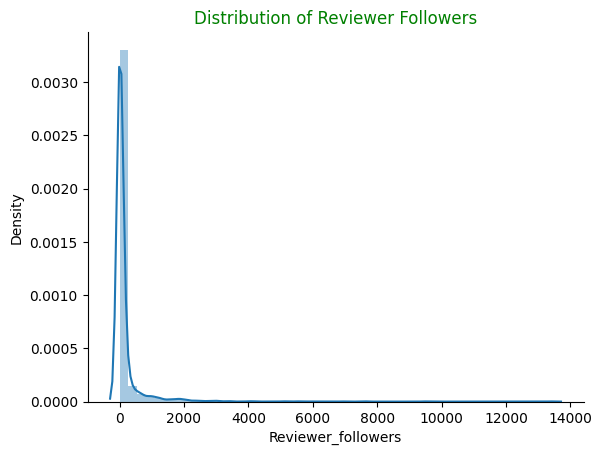

time: 894 ms (started: 2023-08-05 20:03:52 +00:00)


In [105]:
# Distribution plot of Reviewer Followers
sns.distplot(df_inner['Reviewer_followers'])
plt.title('Distribution of Reviewer Followers',color = 'green')
sns.despine()

In [106]:
#isolation forest for anamoly detection on cost
isolation_forest = IsolationForest(n_estimators=100, contamination=0.01)
isolation_forest.fit(df_inner['Cost'].values.reshape(-1, 1))
df_inner['anomaly_score_univariate_Cost'] = isolation_forest.decision_function(df_inner['Cost'].values.reshape(-1, 1))
df_inner['outlier_univariate_Cost'] = isolation_forest.predict(df_inner['Cost'].values.reshape(-1, 1))

time: 1.8 s (started: 2023-08-05 20:03:53 +00:00)


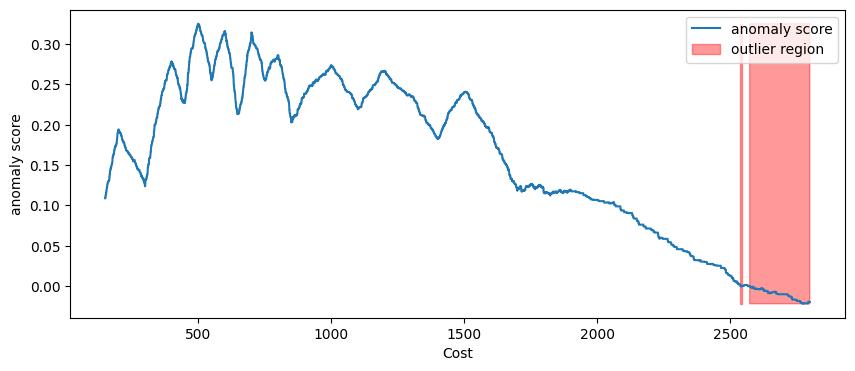

time: 1.95 s (started: 2023-08-05 20:03:54 +00:00)


In [107]:
#chart to visualize outliers
xx = np.linspace(df_inner['Cost'].min(), df_inner['Cost'].max(), len(df_inner)).reshape(-1,1)
anomaly_score = isolation_forest.decision_function(xx)
outlier = isolation_forest.predict(xx)
plt.figure(figsize=(10,4))
plt.plot(xx, anomaly_score, label='anomaly score')
plt.fill_between(xx.T[0], np.min(anomaly_score), np.max(anomaly_score),
where=outlier==-1, color='r',
alpha=.4, label='outlier region')
plt.legend()
plt.ylabel('anomaly score')
plt.xlabel('Cost')
plt.show();

In [108]:
#isolation forest for anamoly detection on cost
isolation_forest = IsolationForest(n_estimators=100, contamination=0.01)
isolation_forest.fit(df_inner['Cost'].values.reshape(-1, 1))
df_inner['anomaly_score_univariate_followers'] = isolation_forest.decision_function(df_inner['Reviewer_followers'].values.reshape(-1, 1))
df_inner['outlier_univariate_followers'] = isolation_forest.predict(df_inner['Reviewer_followers'].values.reshape(-1, 1))

time: 1.67 s (started: 2023-08-05 20:03:56 +00:00)


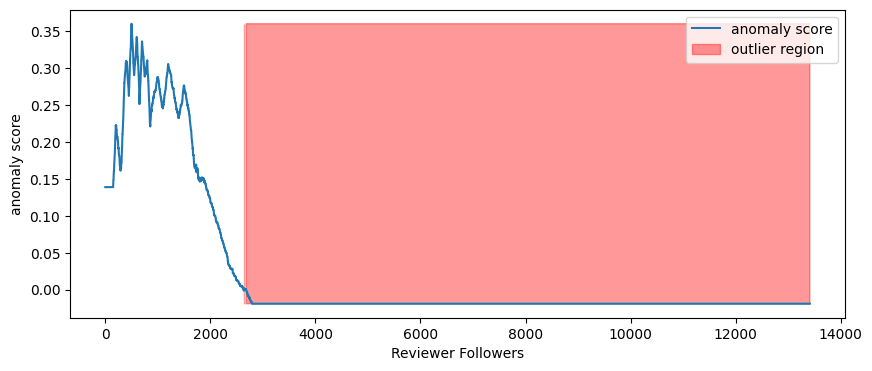

time: 2.91 s (started: 2023-08-05 20:03:58 +00:00)


In [109]:
#chart to visualize outliers
xx = np.linspace(df_inner['Reviewer_followers'].min(), df_inner['Reviewer_followers'].max(), len(df_inner)).reshape(-1,1)
anomaly_score = isolation_forest.decision_function(xx)
outlier = isolation_forest.predict(xx)
plt.figure(figsize=(10,4))
plt.plot(xx, anomaly_score, label='anomaly score')
plt.fill_between(xx.T[0], np.min(anomaly_score), np.max(anomaly_score),
where=outlier==-1, color='r',
alpha=.4, label='outlier region')
plt.legend()
plt.ylabel('anomaly score')
plt.xlabel('Reviewer Followers')
plt.show();

#### **Outliers Treatment**

In [110]:
# Check the information of merged dataset
df_inner.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9961 entries, 0 to 9960
Data columns (total 20 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Restaurant                          9961 non-null   object 
 1   Links                               9961 non-null   object 
 2   Cost                                9961 non-null   int64  
 3   Cuisines                            9961 non-null   object 
 4   Timings                             9961 non-null   object 
 5   Reviewer                            9961 non-null   object 
 6   Review                              9961 non-null   object 
 7   Rating                              9961 non-null   float64
 8   Metadata                            9961 non-null   object 
 9   Time                                9961 non-null   object 
 10  Pictures                            9961 non-null   int64  
 11  Review_Year                         9961 no

On the basis of the dataset info we can split the data into two parts:
* Object_features : Columns having containg the object datatype.
* Numerical_features : Columns having containing the int and float datatype.

In [111]:
# List of columns having contain the object data type
object_features

['Restaurant',
 'Links',
 'Cuisines',
 'Timings',
 'Reviewer',
 'Review',
 'Metadata',
 'Time']

time: 16.9 ms (started: 2023-08-05 20:04:01 +00:00)


In [112]:
# List of columns having numerical data type
numerical_features

['Cost',
 'Rating',
 'Pictures',
 'Review_Year',
 'Review_Month',
 'Review_Day',
 'Reviewer_total_review',
 'Reviewer_followers']

time: 5.46 ms (started: 2023-08-05 20:04:01 +00:00)


* In object features, there are no outliers are present in any features.
* Hence we have to treated outliers only continuous features.

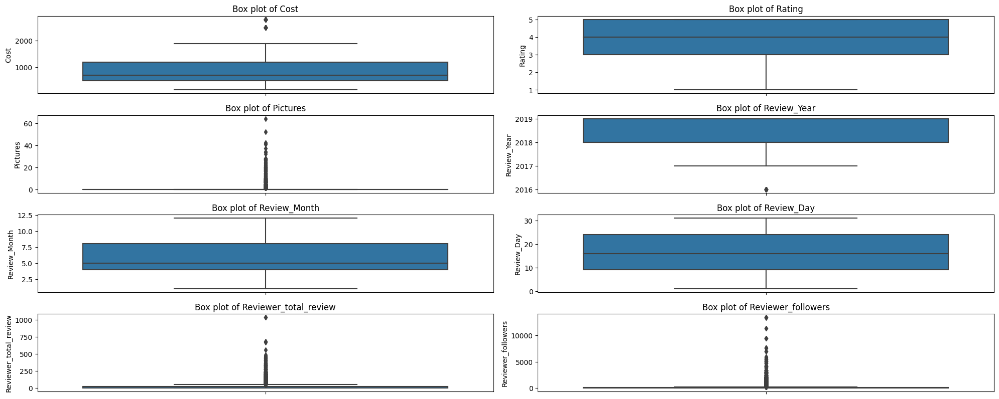

time: 7.99 s (started: 2023-08-05 20:04:01 +00:00)


In [113]:
# To cheack the outliers using boxplot
plt.figure(figsize= (20,10))
for n, c in enumerate(numerical_features):
  plt.subplot(int(len(numerical_features)/2 + 1),2,n+1)
  sns.boxplot(y= c ,data= df_inner)
  plt.title(f'Box plot of {c}')
  plt.tight_layout()

In [114]:
# Detect the outliers present in the dataset
for i in numerical_features:
  print(i)
  outliers_detection(df_inner[i])
  print('\n')

Cost
Q1 : 500.0 
 Q3 : 1200.0
Inter Quartile Range : 700.0
Lower Bound : -550.0 
 Upper Bound : 2250.0
Length of the otliers : 200
Percentage of outliers : 2.01%


Rating
Q1 : 3.0 
 Q3 : 5.0
Inter Quartile Range : 2.0
Lower Bound : 0.0 
 Upper Bound : 8.0
Length of the otliers : 0
Percentage of outliers : 0.0%


Pictures
Q1 : 0.0 
 Q3 : 0.0
Inter Quartile Range : 0.0
Lower Bound : 0.0 
 Upper Bound : 0.0
Length of the otliers : 1983
Percentage of outliers : 19.91%


Review_Year
Q1 : 2018.0 
 Q3 : 2019.0
Inter Quartile Range : 1.0
Lower Bound : 2016.5 
 Upper Bound : 2020.5
Length of the otliers : 43
Percentage of outliers : 0.43%


Review_Month
Q1 : 4.0 
 Q3 : 8.0
Inter Quartile Range : 4.0
Lower Bound : -2.0 
 Upper Bound : 14.0
Length of the otliers : 0
Percentage of outliers : 0.0%


Review_Day
Q1 : 9.0 
 Q3 : 24.0
Inter Quartile Range : 15.0
Lower Bound : -13.5 
 Upper Bound : 46.5
Length of the otliers : 0
Percentage of outliers : 0.0%


Reviewer_total_review
Q1 : 1.0 
 Q3 : 22.0


In [115]:
# Outlier treatments
def outliers_treatment(df):
  # Calculation of first and third percentile
  q1 = np.percentile(df,25)
  q3 = np.percentile(df,75)
  # Defining the inter quartile range(IQR)
  iqr = q3 - q1
  lower_bound = q1 - 1.5*iqr
  upper_bound = q3 + 1.5*iqr
  # Treated the outliers
  treated_data = []
  for i in df:
    if i < lower_bound:
      treated_data.append(q1)
    elif i > upper_bound:
      treated_data.append(q3)
    else:
      treated_data.append(i)
  return treated_data

time: 1.15 ms (started: 2023-08-05 20:04:10 +00:00)


In [116]:
#Passing all the feature one by one from the list of continous_value_feature in our above defined function for outlier treatment
for feature in numerical_features:
  df_inner[feature] = outliers_treatment(df_inner[feature])

time: 296 ms (started: 2023-08-05 20:04:10 +00:00)


In [117]:
# Detect the outliers present in the dataset
for i in numerical_features:
  print(i)
  outliers_detection(df_inner[i])
  print('\n')

Cost
Q1 : 500.0 
 Q3 : 1200.0
Inter Quartile Range : 700.0
Lower Bound : -550.0 
 Upper Bound : 2250.0
Length of the otliers : 0
Percentage of outliers : 0.0%


Rating
Q1 : 3.0 
 Q3 : 5.0
Inter Quartile Range : 2.0
Lower Bound : 0.0 
 Upper Bound : 8.0
Length of the otliers : 0
Percentage of outliers : 0.0%


Pictures
Q1 : 0.0 
 Q3 : 0.0
Inter Quartile Range : 0.0
Lower Bound : 0.0 
 Upper Bound : 0.0
Length of the otliers : 0
Percentage of outliers : 0.0%


Review_Year
Q1 : 2018.0 
 Q3 : 2019.0
Inter Quartile Range : 1.0
Lower Bound : 2016.5 
 Upper Bound : 2020.5
Length of the otliers : 0
Percentage of outliers : 0.0%


Review_Month
Q1 : 4.0 
 Q3 : 8.0
Inter Quartile Range : 4.0
Lower Bound : -2.0 
 Upper Bound : 14.0
Length of the otliers : 0
Percentage of outliers : 0.0%


Review_Day
Q1 : 9.0 
 Q3 : 24.0
Inter Quartile Range : 15.0
Lower Bound : -13.5 
 Upper Bound : 46.5
Length of the otliers : 0
Percentage of outliers : 0.0%


Reviewer_total_review
Q1 : 1.0 
 Q3 : 22.0
Inter Quar

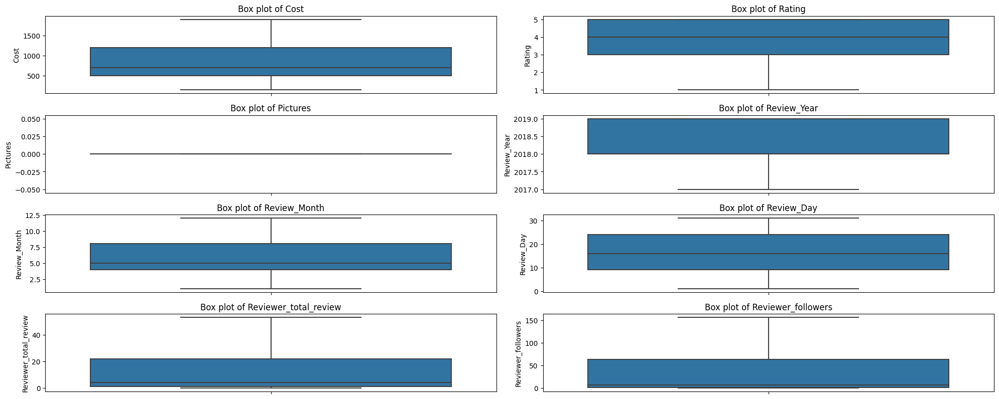

time: 5.04 s (started: 2023-08-05 20:04:10 +00:00)


In [118]:
# To cheack the outliers using boxplot
plt.figure(figsize= (20,10))
for n, c in enumerate(numerical_features):
  plt.subplot(int(len(numerical_features)/2 + 1),2,n+1)
  sns.boxplot(y= c ,data= df_inner)
  plt.title(f'Box plot of {c}')
  plt.tight_layout()

Hence we have to got finally outlier of the all featurn was suceessfully treated in the dataset.

##### What all outlier treatment techniques have you used and why did you use those techniques?

Since, the outliers present in some of the continous features i.e Cost contains 2.01%, Picture contains 19.91%, Review_Year contains 0.43% and Review_follower contains 15.84%.

We have defined the two seperate funtions one is for "outlier detection" and the other is for "outlier treatment using IQR" and passed all the observations of continous features through it. We have successfully capped out extreme left outliers(<25%) and extreme right outliers(>75%) in the 25th and 75th quartile value.

### 3. Categorical Encoding

In [119]:
# Dataset Information
df_inner.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9961 entries, 0 to 9960
Data columns (total 20 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Restaurant                          9961 non-null   object 
 1   Links                               9961 non-null   object 
 2   Cost                                9961 non-null   float64
 3   Cuisines                            9961 non-null   object 
 4   Timings                             9961 non-null   object 
 5   Reviewer                            9961 non-null   object 
 6   Review                              9961 non-null   object 
 7   Rating                              9961 non-null   float64
 8   Metadata                            9961 non-null   object 
 9   Time                                9961 non-null   object 
 10  Pictures                            9961 non-null   float64
 11  Review_Year                         9961 no

In [120]:
# Encode your categorical columns
#categorial encoding using pd.getdummies
#new df with important categories
cluster_dummy = df_restaurant[['Restaurant','Cuisines']]
#spliting cuisines as they are separted with comma and converting into list
cluster_dummy['Cuisines'] = cluster_dummy['Cuisines'].str.split(',')
#using explode converting list to unique individual items
cluster_dummy = cluster_dummy.explode('Cuisines')
#removing extra trailing space from cuisines after exploded
cluster_dummy['Cuisines'] = cluster_dummy['Cuisines'].apply(lambda x: x.strip())
#using get dummies to get dummies for cuisines
cluster_dummy = pd.get_dummies(cluster_dummy, columns=["Cuisines"], prefix=["Cuisines"])
#checking if the values are correct
cluster_dummy.loc[:, cluster_dummy.columns.str.startswith('Cuisines_')].idxmax(1)[:6]
#replacing cuisines_ from columns name - for better understanding run seperatly
cluster_dummy.columns = cluster_dummy.columns.str.replace("Cuisines_","")
#grouping each restaurant as explode created unnecessary rows
cluster_dummy = cluster_dummy.groupby("Restaurant").sum().reset_index()
cluster_dummy

,Restaurant,American,Andhra,Arabian,Asian,BBQ,Bakery,Beverages,Biryani,Burger,...,North Indian,Pizza,Salad,Seafood,South Indian,Spanish,Street Food,Sushi,Thai,Wraps
0,10 Downing Street,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
1,13 Dhaba,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,"3B's - Buddies, Bar & Barbecue",0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,AB's - Absolute Barbecues,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,Absolute Sizzlers,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100,Wich Please,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
101,Yum Yum Tree - The Arabian Food Court,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
102,Zega - Sheraton Hyderabad Hotel,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
103,Zing's Northeast Kitchen,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


time: 172 ms (started: 2023-08-05 20:04:15 +00:00)


In [121]:
#total cuisine count
df_restaurant['Total_Cuisine_Count'] = df_restaurant['Cuisines'].apply(lambda x : len(x.split(',')))

time: 2.93 ms (started: 2023-08-05 20:04:16 +00:00)


In [122]:
#adding average rating - will remove 5 unrated restaurant from 105 restaurant
avg_restaurant_rating.rename(columns = {'Rating':'Average_Rating'}, inplace =True)
df_restaurant = df_restaurant.merge(avg_restaurant_rating, on = 'Restaurant')
df_restaurant.head()

,Restaurant,Links,Cost,Cuisines,Timings,Total_Cuisine_Count,Average_Rating,Total_review
0,Beyond Flavours,https://www.zomato.com/hyderabad/beyond-flavou...,800,"Chinese, Continental, Kebab, European, South I...","12noon to 3:30pm, 6:30pm to 11:30pm (Mon-Sun)",6,4.28,100
1,Paradise,https://www.zomato.com/hyderabad/paradise-gach...,800,"Biryani, North Indian, Chinese",11 AM to 11 PM,3,4.70,100
2,Flechazo,https://www.zomato.com/hyderabad/flechazo-gach...,1300,"Asian, Mediterranean, North Indian, Desserts","11:30 AM to 4:30 PM, 6:30 PM to 11 PM",4,4.66,100
3,Shah Ghouse Hotel & Restaurant,https://www.zomato.com/hyderabad/shah-ghouse-h...,800,"Biryani, North Indian, Chinese, Seafood, Bever...",12 Noon to 2 AM,5,3.21,100
4,Over The Moon Brew Company,https://www.zomato.com/hyderabad/over-the-moon...,1200,"Asian, Continental, North Indian, Chinese, Med...","12noon to 11pm (Mon, Tue, Wed, Thu, Sun), 12no...",5,4.34,100


time: 57.9 ms (started: 2023-08-05 20:04:16 +00:00)


In [123]:
#adding cost column to the new dataset
cluster_dummy = df_restaurant[['Restaurant','Cost','Average_Rating','Total_Cuisine_Count'
                      ]].merge(cluster_dummy, on = 'Restaurant')

time: 9.63 ms (started: 2023-08-05 20:04:16 +00:00)


In [124]:
# First look of the cluster_dummy dataset
cluster_dummy.head()

,Restaurant,Cost,Average_Rating,Total_Cuisine_Count,American,Andhra,Arabian,Asian,BBQ,Bakery,...,North Indian,Pizza,Salad,Seafood,South Indian,Spanish,Street Food,Sushi,Thai,Wraps
0,Beyond Flavours,800,4.28,6,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
1,Paradise,800,4.70,3,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,Flechazo,1300,4.66,4,0,0,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
3,Shah Ghouse Hotel & Restaurant,800,3.21,5,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
4,Over The Moon Brew Company,1200,4.34,5,0,0,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0


time: 28.2 ms (started: 2023-08-05 20:04:16 +00:00)


In [125]:
# Encode your categorical columns

time: 499 µs (started: 2023-08-05 20:04:16 +00:00)


We can use the above code to create binary dummy variable using ONE-HOT ENCODING for each of the feature but we will face the issue of "multicollinearity" or "dummy variable trap" as the information given by the one feature can be explained by the other features and this results in the high "VIF". So its better to drop the redundant feature (one category among all other category) here only.

We can do this easily by passing the argument "drop_first = True" in get_dummies without doing it manually, thanks to python code development team to make our tasks easier.

In [126]:
#creating data frame for categorial encoding
cluster_df = df_restaurant[['Restaurant','Cuisines','Cost','Average_Rating','Total_Cuisine_Count']]

time: 12.4 ms (started: 2023-08-05 20:04:16 +00:00)


In [127]:
#creating new dataframe for clustering
cluster_df = pd.concat([cluster_df,pd.DataFrame(columns=list(cuisine_dict.keys()))])

time: 17.6 ms (started: 2023-08-05 20:04:16 +00:00)


Since we have several encoding techniques but the major ones are:
1. Ordinal encoding: When the features are ordinal in nature and have some rank between them.
2. Nominal encoding: When the features have equal weightage and are nominal in nature.

As our all the categorical columns are nominal in nature(do not have any rank or order) so will use One-Hot Encoding (Type of Nominal encoding) in our senario:

In [128]:
#creating categorial feature for cuisine
#iterate over every row in the dataframe
for i, row in cluster_df.iterrows():
  # iterate over the new columns
  for column in list(cluster_df.columns):
      if column not in ['Restaurant','Cost','Cuisines','Average_Rating','Total_Cuisine_Count']:
        # checking if the column is in the list of cuisines available for that row
        if column in row['Cuisines']:
          #assign it as 1 else 0
          cluster_df.loc[i,column] = 1
        else:
          cluster_df.loc[i,column] = 0

time: 983 ms (started: 2023-08-05 20:04:16 +00:00)


In [129]:
#result from encoding
cluster_df

,Restaurant,Cuisines,Cost,Average_Rating,Total_Cuisine_Count,Chinese,Continental,Kebab,European,South Indian,...,Spanish,Wraps,Thai,Indonesian,Modern Indian,Momos,Pizza,North Eastern,Mithai,Malaysian
0,Beyond Flavours,"Chinese, Continental, Kebab, European, South I...",800.0,4.280,6.0,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
1,Paradise,"Biryani, North Indian, Chinese",800.0,4.700,3.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Flechazo,"Asian, Mediterranean, North Indian, Desserts",1300.0,4.660,4.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Shah Ghouse Hotel & Restaurant,"Biryani, North Indian, Chinese, Seafood, Bever...",800.0,3.210,5.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Over The Moon Brew Company,"Asian, Continental, North Indian, Chinese, Med...",1200.0,4.340,5.0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,Desi Bytes,"North Indian, Chinese",400.0,2.900,2.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
96,Hyderabadi Daawat,"Hyderabadi, Chinese, Mughlai",600.0,3.830,3.0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
97,Zega - Sheraton Hyderabad Hotel,"Asian, Sushi",1750.0,4.450,2.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
98,Triptify,North Indian,400.0,3.550,1.0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


time: 113 ms (started: 2023-08-05 20:04:17 +00:00)


#### What all categorical encoding techniques have you used & why did you use those techniques?

* In order to make our categorical features of the object type compatible to be fed into multiple ML algorithms in the future, we employed the one-hot encoding technique to convert their dummies into int types.

* Since there are only 3 to 4 distinct orderless categories among all the categorical features, there are fewer of them. Thus, using Nominal encoding rather than Ordinal encoding is recommended.

### 4. Textual Data Preprocessing
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

#### 1. Expand Contraction

In [130]:
#creating new df for text processing of sentiment analysis
sentiment_df = df_review[['Reviewer','Restaurant','Rating','Review']]
#setting index
sentiment_df = sentiment_df.reset_index()
sentiment_df['index'] = sentiment_df.index
sentiment_df

,index,Reviewer,Restaurant,Rating,Review
0,0,Rusha Chakraborty,Beyond Flavours,5.0,"The ambience was good, food was quite good . h..."
1,1,Anusha Tirumalaneedi,Beyond Flavours,5.0,Ambience is too good for a pleasant evening. S...
2,2,Ashok Shekhawat,Beyond Flavours,5.0,A must try.. great food great ambience. Thnx f...
3,3,Swapnil Sarkar,Beyond Flavours,5.0,Soumen das and Arun was a great guy. Only beca...
4,4,Dileep,Beyond Flavours,5.0,Food is good.we ordered Kodi drumsticks and ba...
...,...,...,...,...,...
9957,9957,Abhishek Mahajan,Chinese Pavilion,3.0,Madhumathi Mahajan Well to start with nice cou...
9958,9958,Sharad Agrawal,Chinese Pavilion,4.5,This place has never disappointed us.. The foo...
9959,9959,Ramandeep,Chinese Pavilion,1.5,"Bad rating is mainly because of ""Chicken Bone ..."
9960,9960,Nayana Shanbhag,Chinese Pavilion,4.0,I personally love and prefer Chinese Food. Had...


time: 70.3 ms (started: 2023-08-05 20:04:17 +00:00)


In [131]:
# Information of sentiment dataframe
sentiment_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9962 entries, 0 to 9961
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   index       9962 non-null   int64  
 1   Reviewer    9962 non-null   object 
 2   Restaurant  9962 non-null   object 
 3   Rating      9962 non-null   float64
 4   Review      9962 non-null   object 
dtypes: float64(1), int64(1), object(3)
memory usage: 389.3+ KB
time: 46.7 ms (started: 2023-08-05 20:04:17 +00:00)


In [132]:
#importing contraction
!pip install contractions

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.8/110.8 kB 4.1 MB/s eta 0:00:00
time: 16.5 s (started: 2023-08-05 20:04:17 +00:00)


time: 16.5 s (started: 2023-08-05 20:04:17 +00:00)


In [133]:
# Expand Contraction
import contractions
import string
# applying fuction for contracting text
sentiment_df['Review'] = sentiment_df['Review'].apply(lambda x: str(x))
sentiment_df['Review'] = sentiment_df['Review'].apply(lambda x: x.lower())
sentiment_df['Review']=sentiment_df['Review'].apply(lambda x:contractions.fix(x))

time: 401 ms (started: 2023-08-05 20:04:34 +00:00)


#### 2. Lower Casing

In [134]:
# Lower Casing
sentiment_df['Review'] = sentiment_df['Review'].str.lower()

time: 27.4 ms (started: 2023-08-05 20:04:34 +00:00)


time: 39.2 ms (started: 2023-08-05 20:04:34 +00:00)


#### 3. Removing Punctuations

In [135]:
# Remove Punctuations
import string
def remove_punctuation(text):
  '''a function for removing punctuation'''

  # replacing the punctuations with no space,
  # which in effect deletes the punctuation marks
  translator = str.maketrans('', '', string.punctuation)
  # return the text stripped of punctuation marks
  return text.translate(translator)

time: 1.76 ms (started: 2023-08-05 20:04:34 +00:00)


In [136]:
#remove punctuation using function created
sentiment_df['Review'] = sentiment_df['Review'].apply(remove_punctuation)
sentiment_df

,index,Reviewer,Restaurant,Rating,Review
0,0,Rusha Chakraborty,Beyond Flavours,5.0,the ambience was good food was quite good had...
1,1,Anusha Tirumalaneedi,Beyond Flavours,5.0,ambience is too good for a pleasant evening se...
2,2,Ashok Shekhawat,Beyond Flavours,5.0,a must try great food great ambience thnx for ...
3,3,Swapnil Sarkar,Beyond Flavours,5.0,soumen das and arun was a great guy only becau...
4,4,Dileep,Beyond Flavours,5.0,food is goodwe ordered kodi drumsticks and bas...
...,...,...,...,...,...
9957,9957,Abhishek Mahajan,Chinese Pavilion,3.0,madhumathi mahajan well to start with nice cou...
9958,9958,Sharad Agrawal,Chinese Pavilion,4.5,this place has never disappointed us the food ...
9959,9959,Ramandeep,Chinese Pavilion,1.5,bad rating is mainly because of chicken bone f...
9960,9960,Nayana Shanbhag,Chinese Pavilion,4.0,i personally love and prefer chinese food had ...


time: 235 ms (started: 2023-08-05 20:04:34 +00:00)


#### 4. Removing URLs & Removing words and digits contain digits.

In [137]:
# Remove URLs & Remove words and digits contain digits
import re

# Remove links
sentiment_df["Review"] = sentiment_df["Review"].apply(lambda x: re.sub(r"http\S+", "", x))

# Remove digits
sentiment_df["Review"] = sentiment_df["Review"].apply(lambda x: re.sub(r"\d+", "", x))

time: 180 ms (started: 2023-08-05 20:04:35 +00:00)


In [138]:
# First view of sentiment dataframe
sentiment_df

,index,Reviewer,Restaurant,Rating,Review
0,0,Rusha Chakraborty,Beyond Flavours,5.0,the ambience was good food was quite good had...
1,1,Anusha Tirumalaneedi,Beyond Flavours,5.0,ambience is too good for a pleasant evening se...
2,2,Ashok Shekhawat,Beyond Flavours,5.0,a must try great food great ambience thnx for ...
3,3,Swapnil Sarkar,Beyond Flavours,5.0,soumen das and arun was a great guy only becau...
4,4,Dileep,Beyond Flavours,5.0,food is goodwe ordered kodi drumsticks and bas...
...,...,...,...,...,...
9957,9957,Abhishek Mahajan,Chinese Pavilion,3.0,madhumathi mahajan well to start with nice cou...
9958,9958,Sharad Agrawal,Chinese Pavilion,4.5,this place has never disappointed us the food ...
9959,9959,Ramandeep,Chinese Pavilion,1.5,bad rating is mainly because of chicken bone f...
9960,9960,Nayana Shanbhag,Chinese Pavilion,4.0,i personally love and prefer chinese food had ...


time: 26.8 ms (started: 2023-08-05 20:04:35 +00:00)


In [139]:
#function to extract location of the restaurant
def get_location(link):
  link_elements = link.split("/")
  return link_elements[3]

time: 821 µs (started: 2023-08-05 20:04:35 +00:00)


In [140]:
#create a location feature
df_restaurant['Location'] = df_restaurant['Links'].apply(get_location)
df_restaurant.sample(2)

,Restaurant,Links,Cost,Cuisines,Timings,Total_Cuisine_Count,Average_Rating,Total_review,Location
94,Dunkin' Donuts,https://www.zomato.com/hyderabad/dunkin-donuts...,550,"Desserts, Cafe, Beverages, Burger, Fast Food",10 AM to 11 PM,5,3.095,100,hyderabad
69,The Indi Grill,https://www.zomato.com/hyderabad/the-indi-gril...,1500,"BBQ, Asian, Modern Indian",12noon to 11pm (Mon-Sun),3,4.600,100,hyderabad


time: 37.5 ms (started: 2023-08-05 20:04:35 +00:00)


#### 5. Removing Stopwords & Removing White spaces

In [141]:
#importing stopwords
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


time: 4.75 s (started: 2023-08-05 20:04:35 +00:00)


In [142]:
# Remove Stopwords
sw = stopwords.words('english')

time: 20.1 ms (started: 2023-08-05 20:04:40 +00:00)


In [143]:
#function to remove stopwords
def delete_stopwords(text):
  '''a function for removing the stopword'''
  # removing the stop words and lowercasing the selected words
  text = [word.lower() for word in text.split() if word.lower() not in sw]
  # joining the list of words with space separator
  return " ".join(text)

time: 938 µs (started: 2023-08-05 20:04:40 +00:00)


In [144]:
#calling function to remove stopwords
sentiment_df['Review'] = sentiment_df['Review'].apply(delete_stopwords)

time: 2.47 s (started: 2023-08-05 20:04:40 +00:00)


In [145]:
# Remove White spaces
sentiment_df['Review'] =sentiment_df['Review'].apply(lambda x: " ".join(x.split()))

time: 70.9 ms (started: 2023-08-05 20:04:42 +00:00)


In [146]:
# First view of sentiment dataframe
sentiment_df

,index,Reviewer,Restaurant,Rating,Review
0,0,Rusha Chakraborty,Beyond Flavours,5.0,ambience good food quite good saturday lunch c...
1,1,Anusha Tirumalaneedi,Beyond Flavours,5.0,ambience good pleasant evening service prompt ...
2,2,Ashok Shekhawat,Beyond Flavours,5.0,must try great food great ambience thnx servic...
3,3,Swapnil Sarkar,Beyond Flavours,5.0,soumen das arun great guy behavior sincerety g...
4,4,Dileep,Beyond Flavours,5.0,food goodwe ordered kodi drumsticks basket mut...
...,...,...,...,...,...
9957,9957,Abhishek Mahajan,Chinese Pavilion,3.0,madhumathi mahajan well start nice courteous s...
9958,9958,Sharad Agrawal,Chinese Pavilion,4.5,place never disappointed us food courteous sta...
9959,9959,Ramandeep,Chinese Pavilion,1.5,bad rating mainly chicken bone found veg food ...
9960,9960,Nayana Shanbhag,Chinese Pavilion,4.0,personally love prefer chinese food couple tim...


time: 27.3 ms (started: 2023-08-05 20:04:42 +00:00)


#### 6. Rephrase Text

In [147]:
# Rephrase Text
# Not use in the project

time: 485 µs (started: 2023-08-05 20:04:42 +00:00)


#### 7. Tokenization

In [148]:
# Tokenization
sentiment_df['Review'] = sentiment_df['Review'].apply(nltk.word_tokenize)

time: 2.84 s (started: 2023-08-05 20:04:42 +00:00)


In [149]:
# First 5 rows of sentiment dataframe
sentiment_df.head()

,index,Reviewer,Restaurant,Rating,Review
0,0,Rusha Chakraborty,Beyond Flavours,5.0,"[ambience, good, food, quite, good, saturday, ..."
1,1,Anusha Tirumalaneedi,Beyond Flavours,5.0,"[ambience, good, pleasant, evening, service, p..."
2,2,Ashok Shekhawat,Beyond Flavours,5.0,"[must, try, great, food, great, ambience, thnx..."
3,3,Swapnil Sarkar,Beyond Flavours,5.0,"[soumen, das, arun, great, guy, behavior, sinc..."
4,4,Dileep,Beyond Flavours,5.0,"[food, goodwe, ordered, kodi, drumsticks, bask..."


time: 13.4 ms (started: 2023-08-05 20:04:45 +00:00)


#### 8. Text Normalization

In [150]:
# Normalizing Text (i.e., Stemming, Lemmatization etc.)
#applying Lemmatization
from nltk.stem import WordNetLemmatizer

# Create a lemmatizer
lemmatizer = WordNetLemmatizer()

def lemmatize_tokens(tokens):
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in tokens]
    return lemmatized_tokens

# Lemmatize the 'Review' column
sentiment_df['Review'] = sentiment_df['Review'].apply(lemmatize_tokens)


time: 3.08 s (started: 2023-08-05 20:04:45 +00:00)


In [151]:
# First 5 rows of sentiment dataframe
sentiment_df.head()

,index,Reviewer,Restaurant,Rating,Review
0,0,Rusha Chakraborty,Beyond Flavours,5.0,"[ambience, good, food, quite, good, saturday, ..."
1,1,Anusha Tirumalaneedi,Beyond Flavours,5.0,"[ambience, good, pleasant, evening, service, p..."
2,2,Ashok Shekhawat,Beyond Flavours,5.0,"[must, try, great, food, great, ambience, thnx..."
3,3,Swapnil Sarkar,Beyond Flavours,5.0,"[soumen, da, arun, great, guy, behavior, since..."
4,4,Dileep,Beyond Flavours,5.0,"[food, goodwe, ordered, kodi, drumstick, baske..."


time: 15.3 ms (started: 2023-08-05 20:04:48 +00:00)


##### Which text normalization technique have you used and why?

I have used **Lemmatization** as a text normalization technique.

Lemmatization is the process of reducing words to their base or root form, similar to stemming. However, lemmatization uses a dictionary-based approach and considers the context of the word in order to determine its base form, while stemming uses simple heuristics and does not consider the context of the word. Lemmatization is a more accurate way of finding the root form of a word as it takes into account the context of the word as well as its grammatical structure.

I have used lemmatization because it is a more accurate way of reducing words to their base form than stemming. Lemmatization considers the context of the word and its grammatical structure to determine its base form, which can help to improve the performance of natural language processing models. Lemmatization is often used in tasks such as text classification and information retrieval, where the meaning of the words is important.

#### 9. Part of speech tagging

In [152]:
# POS Taging

time: 439 µs (started: 2023-08-05 20:04:48 +00:00)


#### 10. Text Vectorization

In [153]:
#importing contraction
!pip install gensim
import gensim
from gensim import corpora

time: 12.3 s (started: 2023-08-05 20:04:48 +00:00)


In [154]:
# Vectorizing Text
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(tokenizer=lambda x: x, lowercase=False)
vectorizer.fit(sentiment_df['Review'].values)
#creating independent variable for sentiment analysis
X_tfidf = vectorizer.transform(sentiment_df['Review'].values)
X_tfidf

<9962x17327 sparse matrix of type '<class 'numpy.float64'>'
	with 232298 stored elements in Compressed Sparse Row format>

time: 1.81 s (started: 2023-08-05 20:05:01 +00:00)


In [155]:
#Bag of Words
tokenized_text = []
for token in sentiment_df['Review']:
    tokenized_text.append(token)

#creating token dict
tokens_dict = gensim.corpora.Dictionary(tokenized_text)

time: 1.45 s (started: 2023-08-05 20:05:03 +00:00)


In [156]:
#using tokens_dict.doc2bow() to generate BoW features for each tokenized course
texts_bow = [tokens_dict.doc2bow(text) for text in tokenized_text]

#creating a new text_bow dataframe based on the extracted BoW features
tokens = []
bow_values = []
doc_indices = []
doc_ids = []
for text_idx, text_bow in enumerate(texts_bow):
    for token_index, token_bow in text_bow:
        token = tokens_dict.get(token_index)
        tokens.append(token)
        bow_values.append(token_bow)
        doc_indices.append(text_idx)
        doc_ids.append(sentiment_df["Restaurant"][text_idx])

bow_dict = {"doc_index": doc_indices,
            "doc_id": doc_ids,
            "token": tokens,
            "bow": bow_values,
            }
bows_df = pd.DataFrame(bow_dict)
bows_df

,doc_index,doc_id,token,bow
0,0,Beyond Flavours,also,1
1,0,Beyond Flavours,ambience,1
2,0,Beyond Flavours,brunch,1
3,0,Beyond Flavours,chill,1
4,0,Beyond Flavours,cost,1
...,...,...,...,...
232293,9961,Chinese Pavilion,tax,1
232294,9961,Chinese Pavilion,kimchi,1
232295,9961,Chinese Pavilion,an,1
232296,9961,Chinese Pavilion,luncheon,2


time: 4.65 s (started: 2023-08-05 20:05:04 +00:00)


##### Which text vectorization technique have you used and why?

Here I have used Tf-idf Vectorization technique.

TF-IDF (term frequency-inverse document frequency) is a technique that assigns a weight to each word in a document. It is calculated as the product of the term frequency (tf) and the inverse document frequency (idf).

The term frequency (tf) is the number of times a word appears in a document, while the inverse document frequency (idf) is a measure of how rare a word is across all documents in a collection. The intuition behind tf-idf is that words that appear frequently in a document but not in many documents across the collection are more informative and thus should be given more weight.

The mathematical formula for tf-idf is as follows:

tf-idf(t, d, D) = tf(t, d) * idf(t, D)

where t is a term (word), d is a document, D is a collection of documents, tf(t, d) is the term frequency of t in d, and idf(t, D) is the inverse document frequency of t in D.

The tf component of the weight assigns a value to a word based on how often it appears in the document, while the idf component assigns a value based on how rare the word is in the entire collection of documents. Tf-idf is commonly used in text classification and information retrieval tasks because it can help to down-weight the effect of common words and up-weight the effect of rare words which are more informative.

It also helps to reduce the dimensionality of the data and increases the weight of important words, thus providing more informative and robust feature set for the model to work on.

Text vectorization is the process of converting text data into numerical vectors that can be used as input for machine learning models.

There are several ways to vectorize text data, one of the most common methods is using Tf-idf Vectorization, other methods are bag-of-words (BoW - uses CountVectorizer), word2vec, or doc2vec model.

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

##### **Restaurant Dataset**

In [157]:
# Restaurent Dataset shape
df_restaurant.shape

(100, 9)

time: 4.52 ms (started: 2023-08-05 20:05:09 +00:00)


In [158]:
# Columns of the Restaurant dataset
df_restaurant.columns

Index(['Restaurant', 'Links', 'Cost', 'Cuisines', 'Timings',
       'Total_Cuisine_Count', 'Average_Rating', 'Total_review', 'Location'],
      dtype='object')

time: 8.27 ms (started: 2023-08-05 20:05:09 +00:00)


In [159]:
# Drop the Links and Locations columns in the restaurant dataset
df_restaurant = df_restaurant.drop(columns = ['Links','Location'],axis = 1)

time: 6.97 ms (started: 2023-08-05 20:05:09 +00:00)


In [160]:
# New shape of the restaurant dataset
df_restaurant.shape

(100, 7)

time: 16.9 ms (started: 2023-08-05 20:05:09 +00:00)


##### **Review Dataset**

In [161]:
# Shape of the review dataset
df_review.shape

(9962, 12)

time: 9.95 ms (started: 2023-08-05 20:05:09 +00:00)


In [162]:
# Columns of the review dataset
df_review.columns

Index(['Restaurant', 'Reviewer', 'Review', 'Rating', 'Metadata', 'Time',
       'Pictures', 'Review_Year', 'Review_Month', 'Review_Day',
       'Reviewer_total_review', 'Reviewer_followers'],
      dtype='object')

time: 13.9 ms (started: 2023-08-05 20:05:09 +00:00)


##### **Cluster Dataset**

In [163]:
# Shape of the Cluster DataFrame
cluster_df.shape

(100, 49)

time: 9.14 ms (started: 2023-08-05 20:05:09 +00:00)


In [164]:
# Columns of the Cluster Dataset
cluster_df.columns

Index(['Restaurant', 'Cuisines', 'Cost', 'Average_Rating',
       'Total_Cuisine_Count', 'Chinese', 'Continental', 'Kebab', 'European',
       'South Indian', 'North Indian', 'Biryani', 'Asian', 'Mediterranean',
       'Desserts', 'Seafood', 'Beverages', 'Goan', 'Healthy Food', 'Lebanese',
       'American', 'Ice Cream', 'Street Food', 'Fast Food', 'BBQ', 'Italian',
       'Finger Food', 'Burger', 'Japanese', 'Salad', 'Sushi', 'Mexican',
       'Mughlai', 'Andhra', 'Bakery', 'Juices', 'Arabian', 'Hyderabadi',
       'Cafe', 'Spanish', 'Wraps', 'Thai', 'Indonesian', 'Modern Indian',
       'Momos', 'Pizza', 'North Eastern', 'Mithai', 'Malaysian'],
      dtype='object')

time: 4.94 ms (started: 2023-08-05 20:05:09 +00:00)


In [165]:
# Information of the cluster dummy dataset
cluster_dummy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100 entries, 0 to 99
Data columns (total 48 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Restaurant           100 non-null    object 
 1   Cost                 100 non-null    int64  
 2   Average_Rating       100 non-null    float64
 3   Total_Cuisine_Count  100 non-null    int64  
 4   American             100 non-null    uint8  
 5   Andhra               100 non-null    uint8  
 6   Arabian              100 non-null    uint8  
 7   Asian                100 non-null    uint8  
 8   BBQ                  100 non-null    uint8  
 9   Bakery               100 non-null    uint8  
 10  Beverages            100 non-null    uint8  
 11  Biryani              100 non-null    uint8  
 12  Burger               100 non-null    uint8  
 13  Cafe                 100 non-null    uint8  
 14  Chinese              100 non-null    uint8  
 15  Continental          100 non-null    uint

In [166]:
# Drop the Links and Locations columns in the restaurant dataset
cluster_df = cluster_df.drop(columns = ['Restaurant','Cuisines'],axis = 1)

time: 4.75 ms (started: 2023-08-05 20:05:09 +00:00)


In [167]:
# Shape of the Cluster DataFrame
cluster_df.shape

(100, 47)

time: 6.21 ms (started: 2023-08-05 20:05:09 +00:00)


In [168]:
# Type casting of the cluster dataframe
for i in cluster_df.columns:
  cluster_df[i] = cluster_df[i].astype(int)

time: 81.3 ms (started: 2023-08-05 20:05:09 +00:00)


In [169]:
# Shape of the cluster dummy
cluster_dummy.shape

(100, 48)

time: 6.92 ms (started: 2023-08-05 20:05:09 +00:00)


In [170]:
# Columns of the cluster dummy
cluster_dummy.columns

Index(['Restaurant', 'Cost', 'Average_Rating', 'Total_Cuisine_Count',
       'American', 'Andhra', 'Arabian', 'Asian', 'BBQ', 'Bakery', 'Beverages',
       'Biryani', 'Burger', 'Cafe', 'Chinese', 'Continental', 'Desserts',
       'European', 'Fast Food', 'Finger Food', 'Goan', 'Healthy Food',
       'Hyderabadi', 'Ice Cream', 'Indonesian', 'Italian', 'Japanese',
       'Juices', 'Kebab', 'Lebanese', 'Malaysian', 'Mediterranean', 'Mexican',
       'Mithai', 'Modern Indian', 'Momos', 'Mughlai', 'North Eastern',
       'North Indian', 'Pizza', 'Salad', 'Seafood', 'South Indian', 'Spanish',
       'Street Food', 'Sushi', 'Thai', 'Wraps'],
      dtype='object')

time: 7.43 ms (started: 2023-08-05 20:05:09 +00:00)


In [171]:
# Information of cluster dummy dataset
cluster_dummy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100 entries, 0 to 99
Data columns (total 48 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Restaurant           100 non-null    object 
 1   Cost                 100 non-null    int64  
 2   Average_Rating       100 non-null    float64
 3   Total_Cuisine_Count  100 non-null    int64  
 4   American             100 non-null    uint8  
 5   Andhra               100 non-null    uint8  
 6   Arabian              100 non-null    uint8  
 7   Asian                100 non-null    uint8  
 8   BBQ                  100 non-null    uint8  
 9   Bakery               100 non-null    uint8  
 10  Beverages            100 non-null    uint8  
 11  Biryani              100 non-null    uint8  
 12  Burger               100 non-null    uint8  
 13  Cafe                 100 non-null    uint8  
 14  Chinese              100 non-null    uint8  
 15  Continental          100 non-null    uint

In [172]:
# Shape of the sentiment dataset
sentiment_df.shape

(9962, 5)

time: 6.04 ms (started: 2023-08-05 20:05:09 +00:00)


In [173]:
# Columns of the sentiment dataset
sentiment_df.columns

Index(['index', 'Reviewer', 'Restaurant', 'Rating', 'Review'], dtype='object')

time: 8.54 ms (started: 2023-08-05 20:05:09 +00:00)


In [174]:
#creating new binary feature called sentiment based on rating which has 1 = positive and 0 = negative
sentiment_df['sentiment'] = sentiment_df['Rating'].apply(lambda x: 1 if x >=sentiment_df['Rating'].mean() else 0)

time: 2.07 s (started: 2023-08-05 20:05:09 +00:00)


In [175]:
# Information of sentiment dataset
sentiment_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9962 entries, 0 to 9961
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   index       9962 non-null   int64  
 1   Reviewer    9962 non-null   object 
 2   Restaurant  9962 non-null   object 
 3   Rating      9962 non-null   float64
 4   Review      9962 non-null   object 
 5   sentiment   9962 non-null   int64  
dtypes: float64(1), int64(2), object(3)
memory usage: 467.1+ KB
time: 27.9 ms (started: 2023-08-05 20:05:11 +00:00)


#### 2. Feature Selection

##### **Restaurant Dataset**

In [176]:
# Dataset information
df_restaurant.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100 entries, 0 to 99
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Restaurant           100 non-null    object 
 1   Cost                 100 non-null    int64  
 2   Cuisines             100 non-null    object 
 3   Timings              100 non-null    object 
 4   Total_Cuisine_Count  100 non-null    int64  
 5   Average_Rating       100 non-null    float64
 6   Total_review         100 non-null    int64  
dtypes: float64(1), int64(3), object(3)
memory usage: 6.2+ KB
time: 22.9 ms (started: 2023-08-05 20:05:11 +00:00)


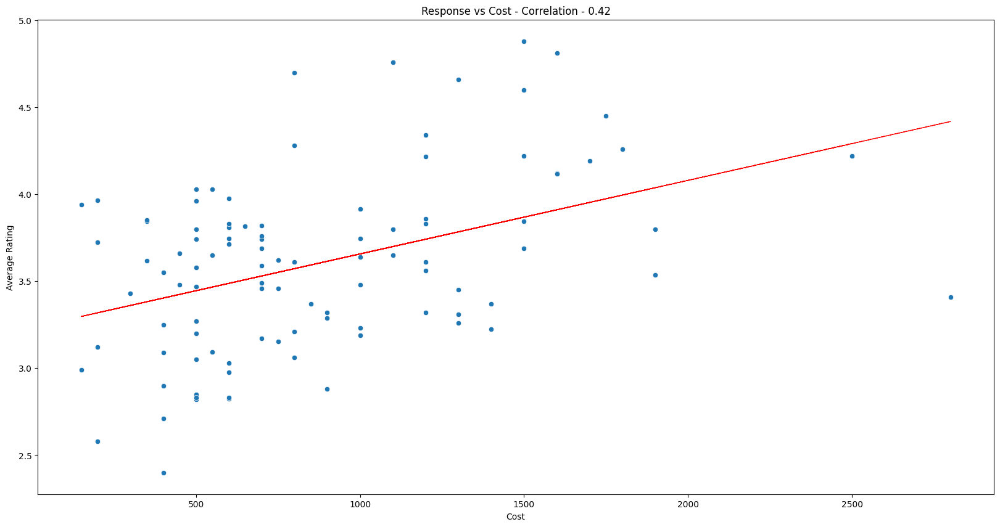

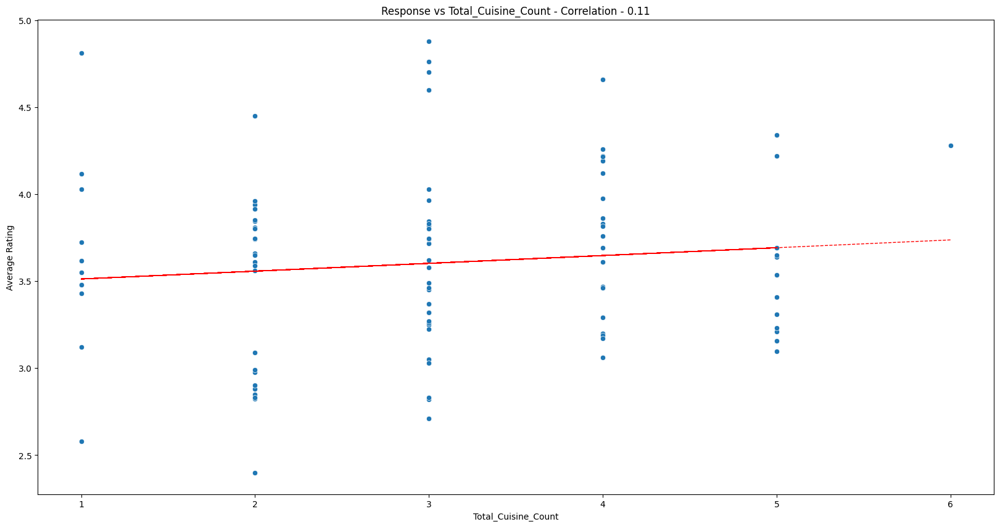

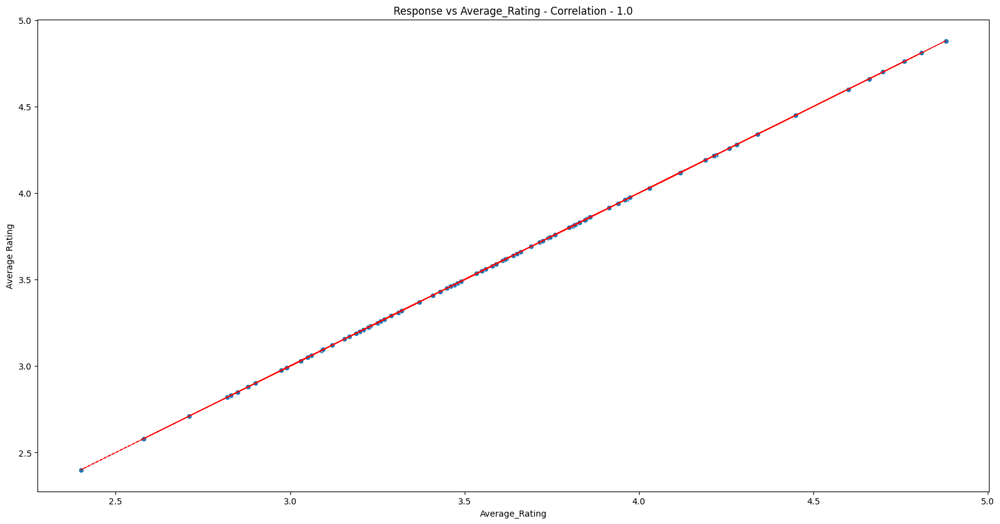

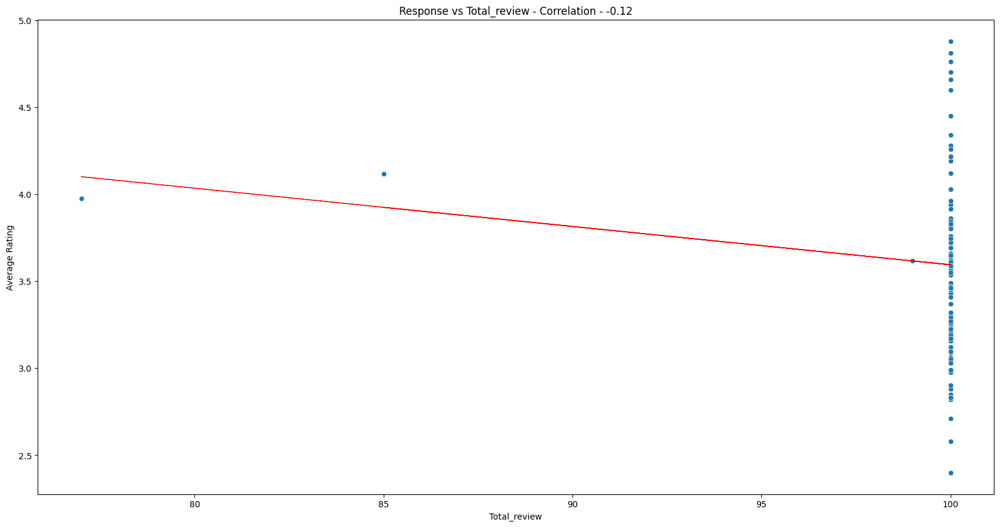

time: 1.57 s (started: 2023-08-05 20:05:11 +00:00)


In [177]:
# Let's see how to relation between sales and other features
for i in [i for i in df_restaurant.columns if df_restaurant[i].dtypes != 'object']:
  fig = plt.figure(figsize= (20,10))
  fig = fig.gca()
  feature = df_restaurant[i]
  label = df_restaurant['Average_Rating']
  corr = feature.corr(label)
  sns.scatterplot(x= feature, y= label)
  plt.xlabel(i)
  plt.ylabel('Average Rating')
  plt.title('Response vs '+i+' - Correlation - ' + str(round(corr,2)))
  z = np.polyfit(df_restaurant[i], df_restaurant['Average_Rating'], 1)
  y_hat = np.poly1d(z)(df_restaurant[i])
  plt.plot(df_restaurant[i], y_hat, "r--", lw=1)
  plt.show()

<Axes: >

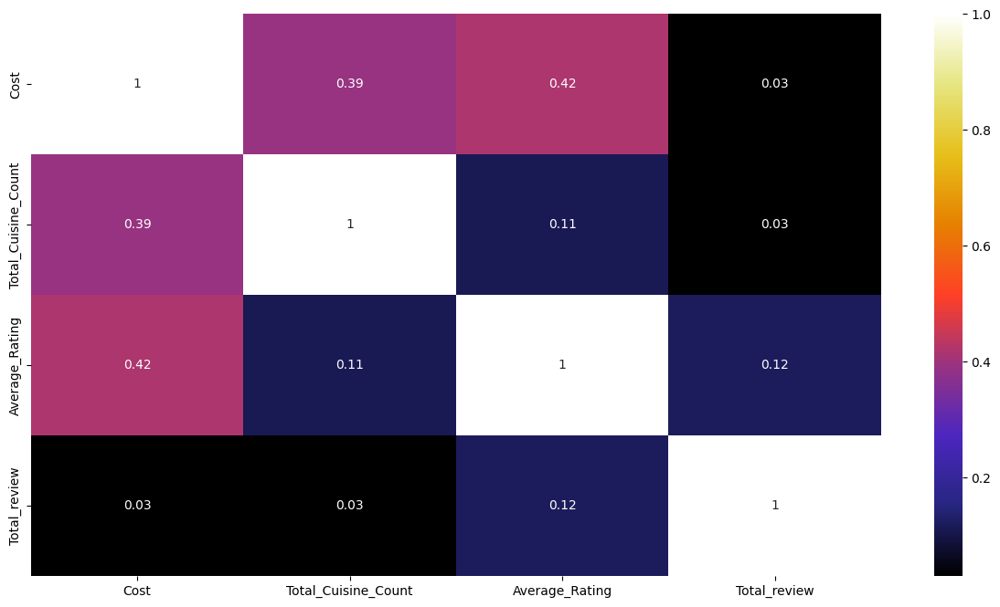

time: 425 ms (started: 2023-08-05 20:05:13 +00:00)


In [178]:
# Select your features wisely to avoid overfitting
plt.figure(figsize = (15,8))
sns.heatmap(abs(round(df_restaurant.corr(),2)), annot = True, cmap= plt.cm.CMRmap)

Now we have to need that those features contain our final dataset which have highly impacting our dependent variable i.e. Sales. Using Variance Inflation Factor(VIF) determine the multicolinearity of the feature and finally select the feature of the final dataset.

In [179]:
# Import  VIF factor
from statsmodels.stats.outliers_influence import variance_inflation_factor

time: 127 ms (started: 2023-08-05 20:05:13 +00:00)


In [180]:
# Defining the function variance_inflation_factor
def vif_func(data):
  vif = pd.DataFrame()
  vif['var'] = data.columns
  vif['VIF'] = [variance_inflation_factor(data.values,i) for i in range(data.shape[1])]
  return vif

time: 750 µs (started: 2023-08-05 20:05:14 +00:00)


In [181]:
# calculating the vif by excluding some features
vif_func(df_restaurant[[i for i in df_restaurant.describe().columns]])

,var,VIF
0,Cost,5.668285
1,Total_Cuisine_Count,8.585178
2,Average_Rating,58.451380
3,Total_review,55.115141


time: 59.4 ms (started: 2023-08-05 20:05:14 +00:00)


##### **Review Dataset**

In [182]:
# Information of review dataset
df_review.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9962 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Restaurant             9962 non-null   object 
 1   Reviewer               9962 non-null   object 
 2   Review                 9962 non-null   object 
 3   Rating                 9962 non-null   float64
 4   Metadata               9962 non-null   object 
 5   Time                   9962 non-null   object 
 6   Pictures               9962 non-null   int64  
 7   Review_Year            9962 non-null   float64
 8   Review_Month           9962 non-null   float64
 9   Review_Day             9962 non-null   float64
 10  Reviewer_total_review  9962 non-null   float64
 11  Reviewer_followers     9962 non-null   float64
dtypes: float64(6), int64(1), object(5)
memory usage: 1011.8+ KB
time: 39.5 ms (started: 2023-08-05 20:05:14 +00:00)


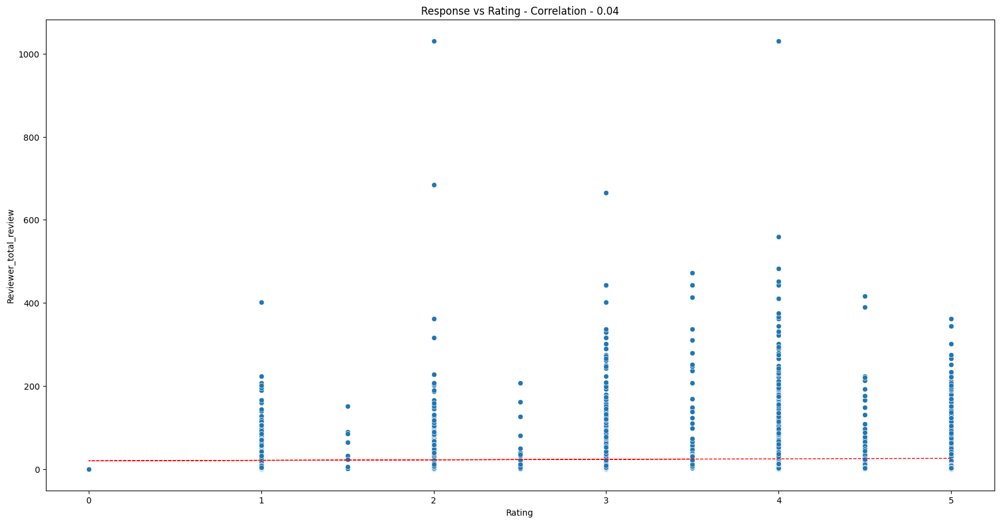

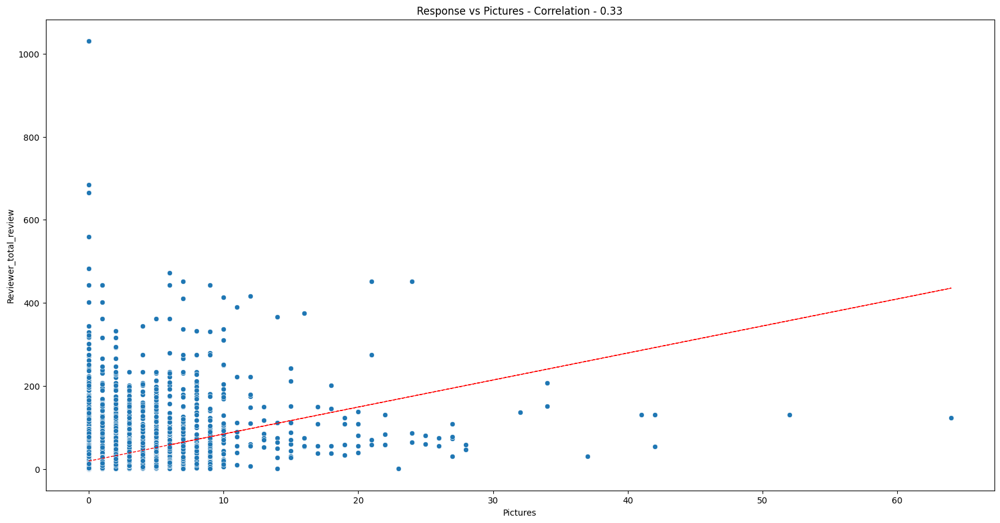

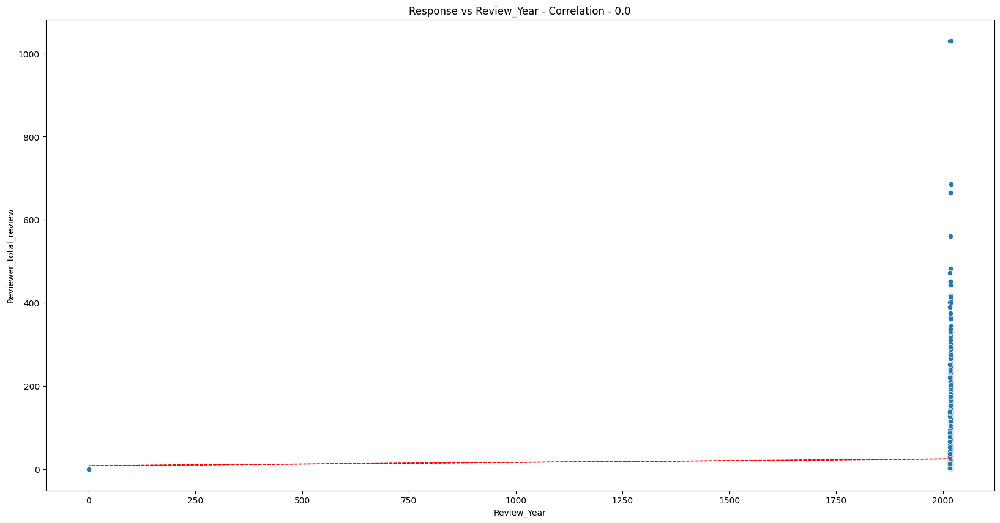

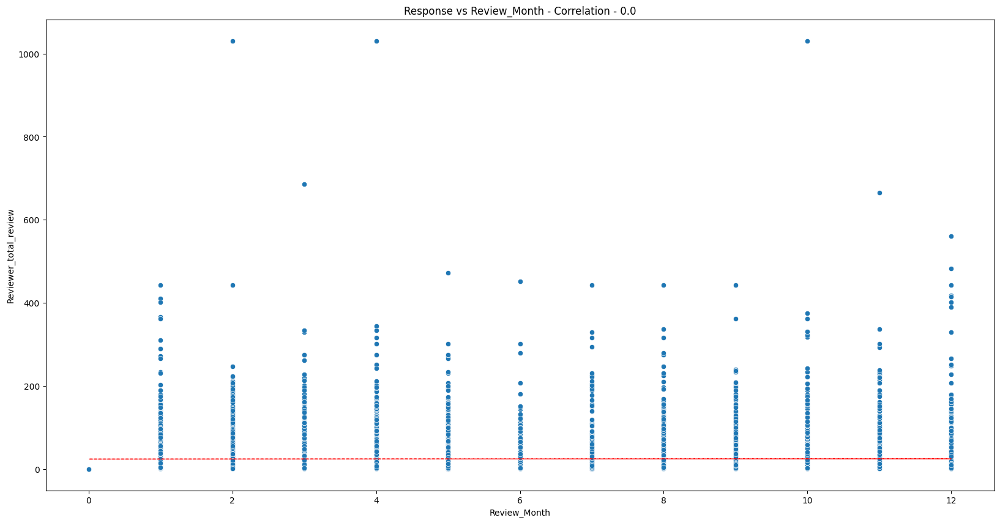

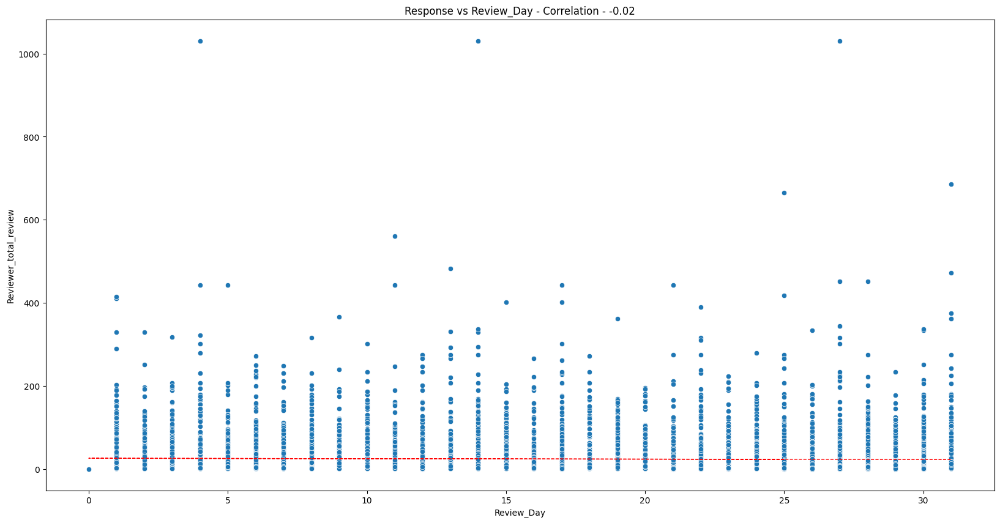

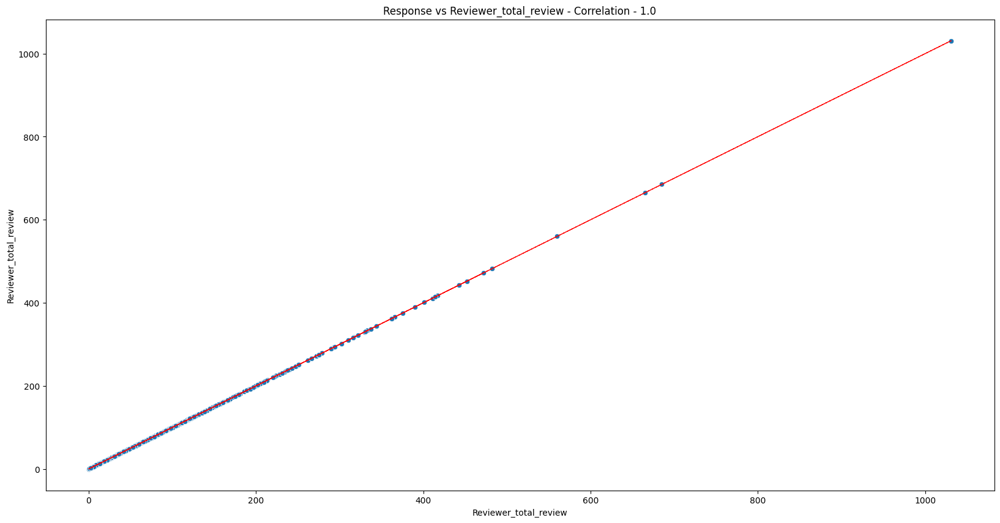

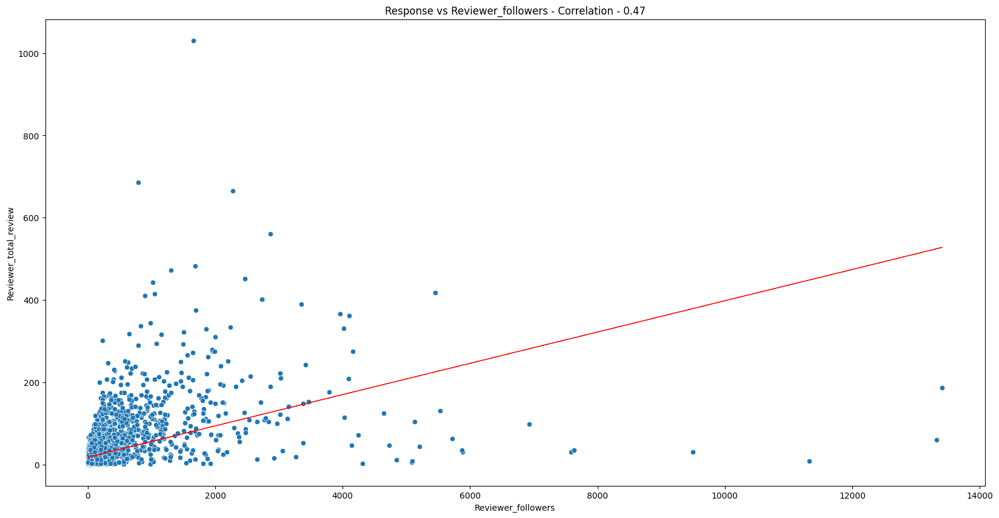

time: 4.39 s (started: 2023-08-05 20:05:14 +00:00)


In [183]:
# Let's see how to relation between sales and other features
for i in [i for i in df_review.columns if df_review[i].dtypes != 'object']:
  fig = plt.figure(figsize= (20,10))
  fig = fig.gca()
  feature = df_review[i]
  label = df_review['Reviewer_total_review']
  corr = feature.corr(label)
  sns.scatterplot(x= feature, y= label)
  plt.xlabel(i)
  plt.ylabel('Reviewer_total_review')
  plt.title('Response vs '+i+' - Correlation - ' + str(round(corr,2)))
  z = np.polyfit(df_review[i], df_review['Reviewer_total_review'], 1)
  y_hat = np.poly1d(z)(df_review[i])
  plt.plot(df_review[i], y_hat, "r--", lw=1)
  plt.show()

<Axes: >

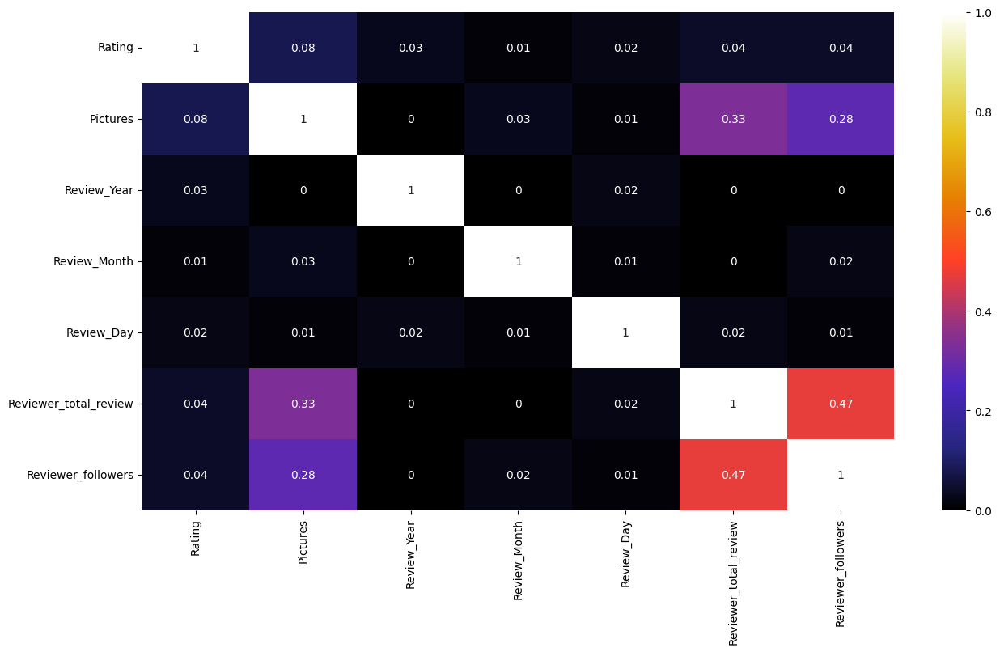

time: 971 ms (started: 2023-08-05 20:05:18 +00:00)


In [184]:
# Select your features wisely to avoid overfitting
plt.figure(figsize = (15,8))
sns.heatmap(abs(round(df_review.corr(),2)), annot = True, cmap= plt.cm.CMRmap)

In [185]:
# calculating the vif by excluding some features
vif_func(df_review[[i for i in df_review.describe().columns]])

,var,VIF
0,Rating,6.947463
1,Pictures,1.257779
2,Review_Year,13.889626
3,Review_Month,4.634561
4,Review_Day,4.369152
5,Reviewer_total_review,1.654539
6,Reviewer_followers,1.400371


time: 167 ms (started: 2023-08-05 20:05:19 +00:00)


##### **Cluster Dataset**

In [186]:
cluster_df

,Cost,Average_Rating,Total_Cuisine_Count,Chinese,Continental,Kebab,European,South Indian,North Indian,Biryani,...,Spanish,Wraps,Thai,Indonesian,Modern Indian,Momos,Pizza,North Eastern,Mithai,Malaysian
0,800,4,6,1,1,1,1,1,1,0,...,0,0,0,0,0,0,0,0,0,0
1,800,4,3,1,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
2,1300,4,4,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,800,3,5,1,0,0,0,0,1,1,...,0,0,0,0,0,0,0,0,0,0
4,1200,4,5,1,1,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,400,2,2,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
96,600,3,3,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
97,1750,4,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
98,400,3,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0


time: 79.9 ms (started: 2023-08-05 20:05:19 +00:00)


In [187]:
# Information of cluster dataset
cluster_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100 entries, 0 to 99
Data columns (total 47 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   Cost                 100 non-null    int64
 1   Average_Rating       100 non-null    int64
 2   Total_Cuisine_Count  100 non-null    int64
 3   Chinese              100 non-null    int64
 4   Continental          100 non-null    int64
 5   Kebab                100 non-null    int64
 6   European             100 non-null    int64
 7   South Indian         100 non-null    int64
 8   North Indian         100 non-null    int64
 9   Biryani              100 non-null    int64
 10  Asian                100 non-null    int64
 11  Mediterranean        100 non-null    int64
 12  Desserts             100 non-null    int64
 13  Seafood              100 non-null    int64
 14  Beverages            100 non-null    int64
 15  Goan                 100 non-null    int64
 16  Healthy Food         100 no

<Axes: >

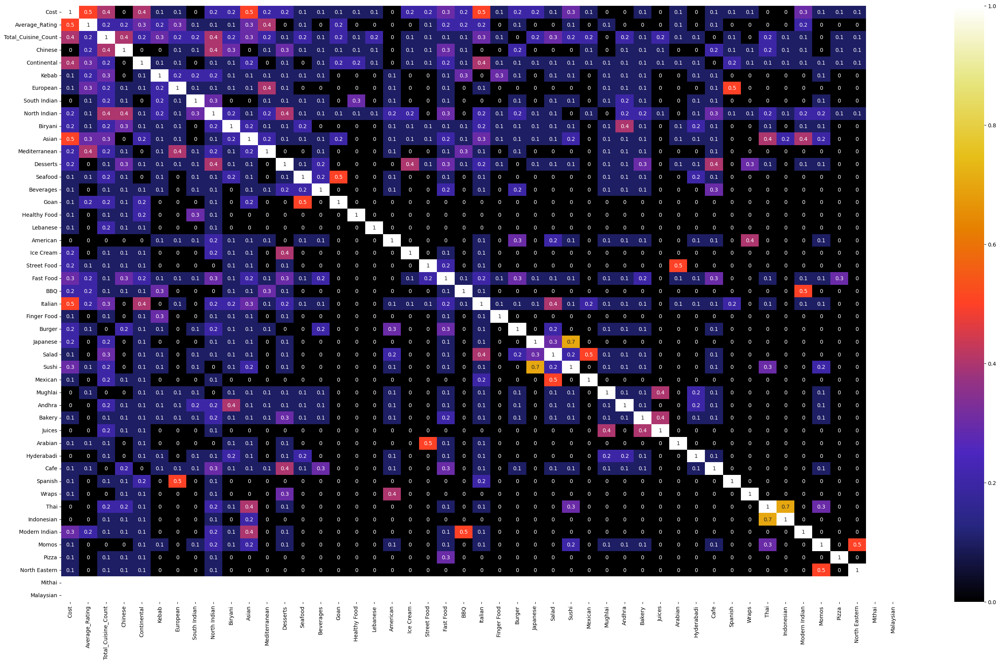

time: 6.7 s (started: 2023-08-05 20:05:19 +00:00)


In [188]:
# Select your features wisely to avoid overfitting
plt.figure(figsize = (35,20))
sns.heatmap(abs(round(cluster_df.corr(),1)), annot = True, cmap= plt.cm.CMRmap)

##### What all feature selection methods have you used  and why?

I will be usign **PCA for feature selection**, which will be again beneficial for dimensional reduction, therefore will do the needfull in the precedding step.

The goal of PCA is to identify the most important variables or features that capture the most variation in the data, and then to project the data onto a lower-dimensional space while preserving as much of the variance as possible.

##### Which all features you found important and why?

Answer Here.

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

In [189]:
# Numerical columns of the cluster dummy dataset
col = [i for i in cluster_dummy.columns if cluster_dummy[i].dtypes == 'int' or cluster_dummy[i].dtypes == 'float64']
col

['Cost', 'Average_Rating', 'Total_Cuisine_Count']

time: 4.96 ms (started: 2023-08-05 20:05:26 +00:00)


In [190]:
# Typecasting of the float data type to int datatype
for i in col:
  cluster_dummy[i] = cluster_dummy[i].astype(int)

time: 2.58 ms (started: 2023-08-05 20:05:26 +00:00)


Generally we have to apply tha the Data Transform in continuous feature, in our final dataset we have to got Cost, Average_Rating and Total_Cuisine_Count in continuous in nature, so we have to apply the transform only these two features.


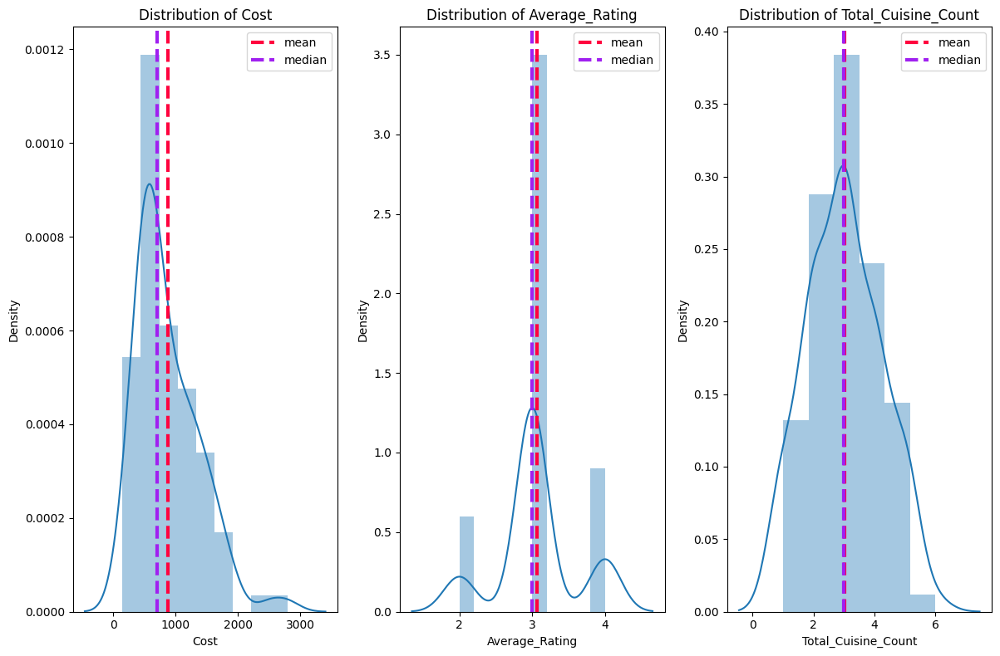

time: 1.41 s (started: 2023-08-05 20:05:26 +00:00)


In [191]:
## Checking the distribution of each continuous feature
plt.figure(figsize= (20,8))
for n,i in enumerate(col):
  plt.subplot(1,5,n+1)
  sns.distplot(cluster_dummy[i])
  feature = cluster_dummy[i]
  plt.axvline(feature.mean(), color='#ff033e', linestyle='dashed', linewidth=3,label= 'mean');  #red
  plt.axvline(feature.median(), color='#A020F0', linestyle='dashed', linewidth=3,label='median'); #cyan
  plt.legend(bbox_to_anchor = (1.0, 1))
  plt.title(f'Distribution of {i}')
  plt.tight_layout()

It is clearly show that the above plot is approxmetly normally distributed, So we have to apply those transform which get the normally distributed data so it is one of the most underlying assumption of the linear model.

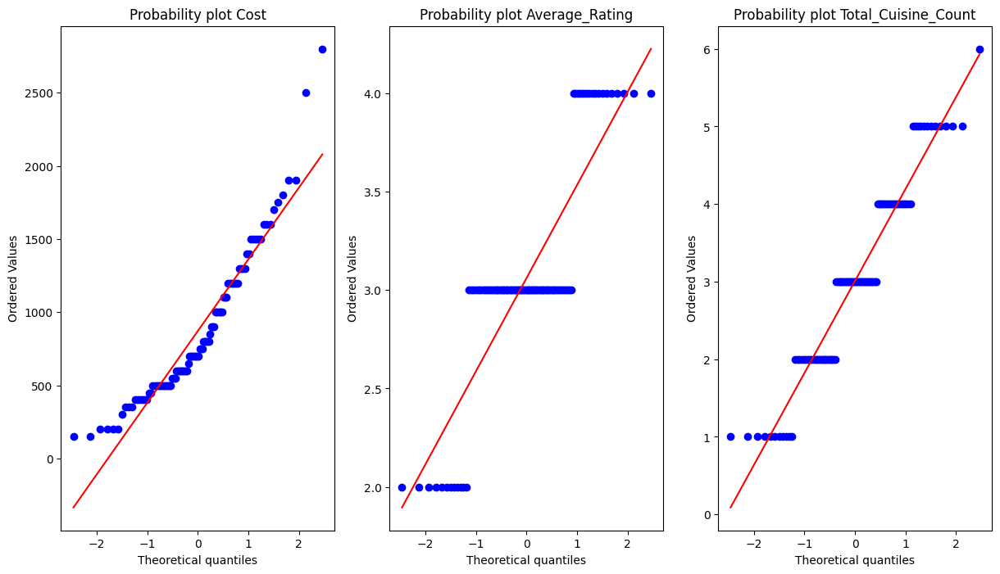

time: 1.44 s (started: 2023-08-05 20:05:28 +00:00)


In [192]:
# Import liberary for statics
import scipy.stats as stat
import pylab
# Q-Q ploting before transforming
plt.figure(figsize= (25,8))
for index,column in enumerate(col):
  plt.subplot(1,5,index+1)
  stat.probplot(cluster_dummy[column],dist= 'norm',plot= pylab)
  plt.title(f'Probability plot {column}')
plt.show()

As it is clear from above plots that our continous numeric features are not following perfectly normal distribution trend. So, now we will try various transformations techniques to get gaussian distributed curve.

In [193]:
# Copy the final dataset into test dataset
test_df1 = cluster_dummy.copy()
test_df2 = cluster_dummy.copy()
test_df3 = cluster_dummy.copy()
test_df4 = cluster_dummy.copy()
test_df5 = cluster_dummy.copy()

time: 11 ms (started: 2023-08-05 20:05:29 +00:00)


#### Logrithemic transform

In [194]:
col

['Cost', 'Average_Rating', 'Total_Cuisine_Count']

time: 10.4 ms (started: 2023-08-05 20:05:29 +00:00)


In [195]:
# Logrithemic Transform Your data
test_df1['Cost'] = np.log(test_df1['Cost'] + 1)
test_df1['Average_Rating'] = np.log(test_df1['Average_Rating'] + 1)
test_df1['Total_Cuisine_Count'] = np.log(test_df1['Total_Cuisine_Count'] + 1)

time: 12.6 ms (started: 2023-08-05 20:05:29 +00:00)


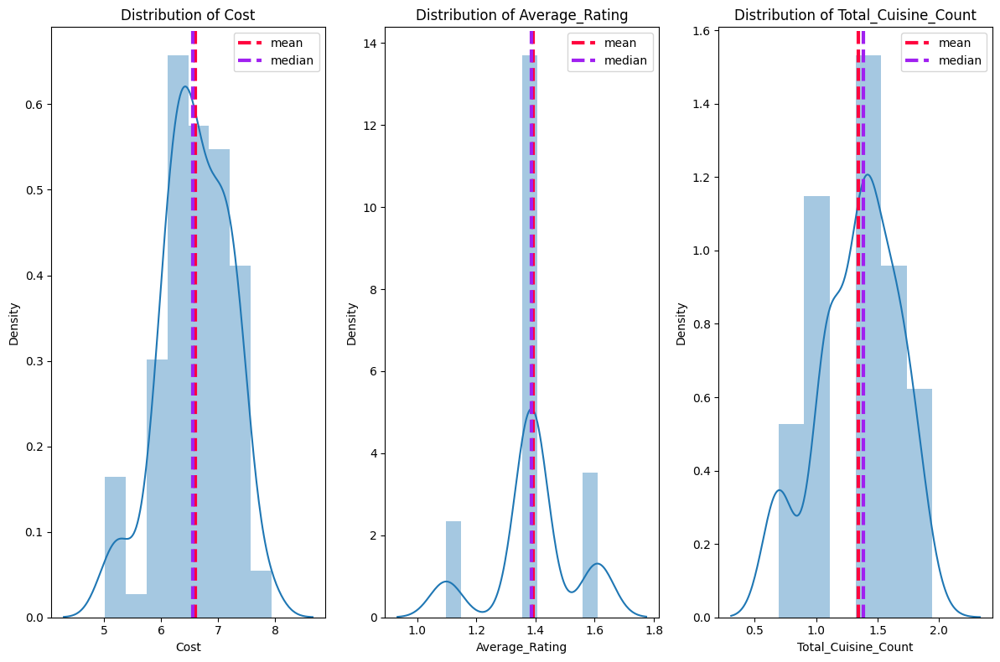

time: 3.86 s (started: 2023-08-05 20:05:29 +00:00)


In [196]:
## Checking the distribution of each continuous feature
plt.figure(figsize= (20,8))
for n,i in enumerate(col):
  plt.subplot(1,5,n+1)
  sns.distplot(test_df1[i])
  feature = test_df1[i]
  plt.axvline(feature.mean(), color='#ff033e', linestyle='dashed', linewidth=3,label= 'mean');  #red
  plt.axvline(feature.median(), color='#A020F0', linestyle='dashed', linewidth=3,label='median'); #cyan
  plt.legend(bbox_to_anchor = (1.0, 1))
  plt.title(f'Distribution of {i}')
  plt.tight_layout()

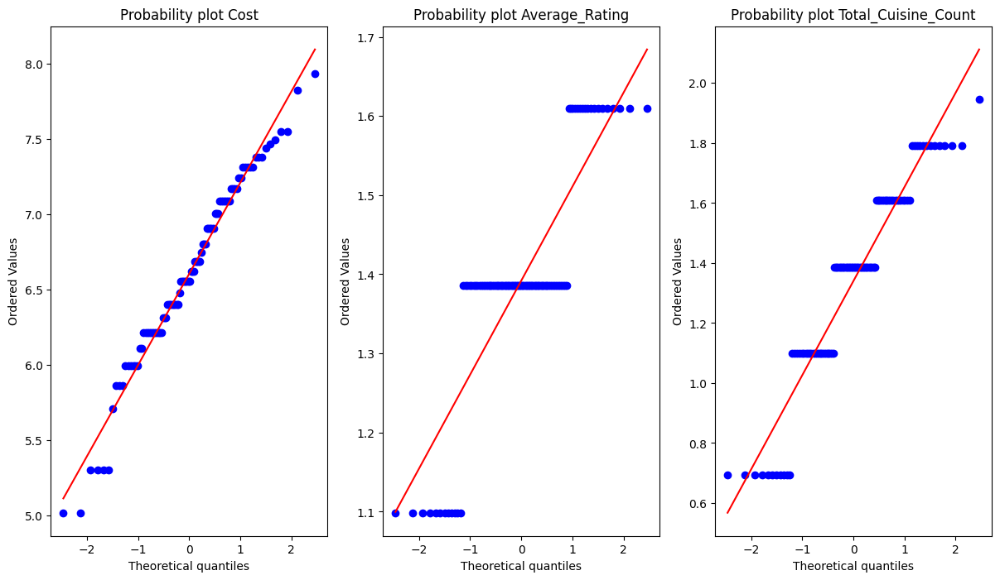

time: 2.85 s (started: 2023-08-05 20:05:33 +00:00)


In [197]:
# Import liberary for statics
import scipy.stats as stat
import pylab
# Q-Q ploting before transforming
plt.figure(figsize= (25,8))
for index,column in enumerate(col):
  plt.subplot(1,5,index+1)
  stat.probplot(test_df1[column],dist= 'norm',plot= pylab)
  plt.title(f'Probability plot {column}')
plt.show()

#### Square Root transform

In [198]:
# Convert the numerical feature datatype into in float datatype
for i in col:
  test_df3[i] = test_df3[i].astype(int)

time: 6.42 ms (started: 2023-08-05 20:05:36 +00:00)


In [199]:
# Logrithemic Transform Your data
test_df3['Cost'] = (test_df3['Cost'])**0.5
test_df3['Average_Rating'] = (test_df3['Average_Rating'])**0.5
test_df3['Total_Cuisine_Count'] = (test_df3['Total_Cuisine_Count'])**0.5

time: 9.98 ms (started: 2023-08-05 20:05:36 +00:00)


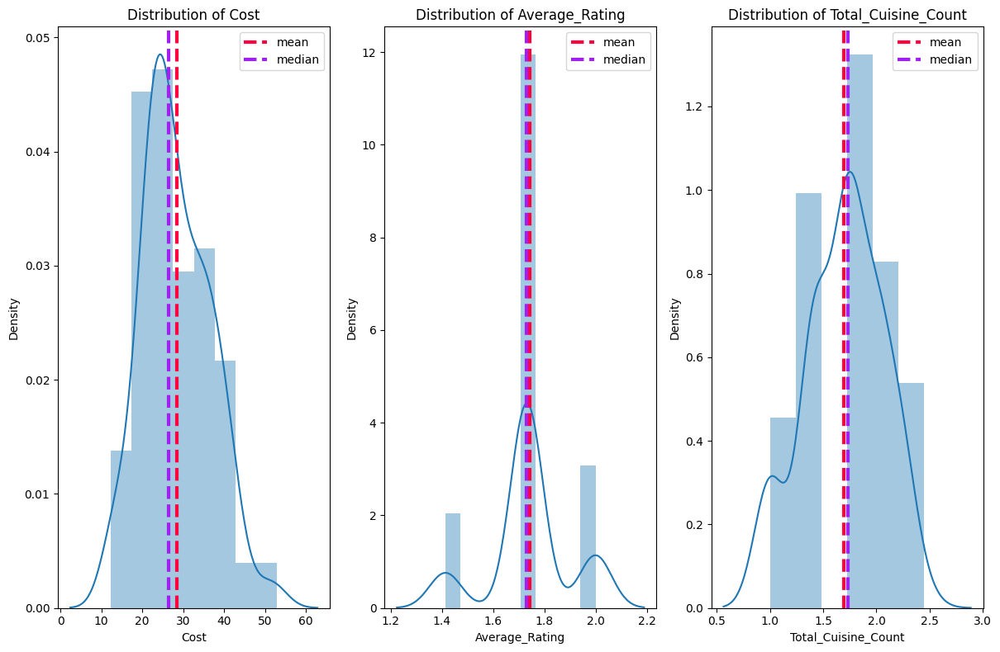

time: 5.13 s (started: 2023-08-05 20:05:36 +00:00)


In [200]:
## Checking the distribution of each continuous feature
plt.figure(figsize= (20,8))
for n,i in enumerate(col):
  plt.subplot(1,5,n+1)
  sns.distplot(test_df3[i])
  feature = test_df3[i]
  plt.axvline(feature.mean(), color='#ff033e', linestyle='dashed', linewidth=3,label= 'mean');  #red
  plt.axvline(feature.median(), color='#A020F0', linestyle='dashed', linewidth=3,label='median'); #cyan
  plt.legend(bbox_to_anchor = (1.0, 1))
  plt.title(f'Distribution of {i}')
  plt.tight_layout()

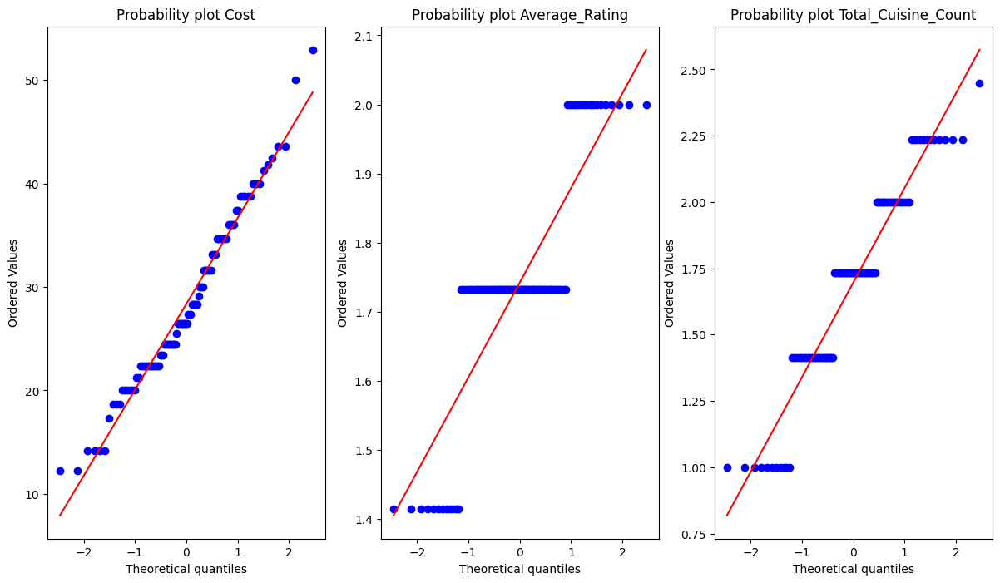

time: 1.36 s (started: 2023-08-05 20:05:41 +00:00)


In [201]:
# Import liberary for statics
import scipy.stats as stat
import pylab
# Q-Q ploting before transforming
plt.figure(figsize= (25,8))
for index,column in enumerate(col):
  plt.subplot(1,5,index+1)
  stat.probplot(test_df3[column],dist= 'norm',plot= pylab)
  plt.title(f'Probability plot {column}')
plt.show()

#### Reciprocal transform

In [202]:
# Convert the numerical feature datatype into in float datatype
for i in col:
  test_df4[i] = test_df4[i].astype(int)

time: 9.5 ms (started: 2023-08-05 20:05:43 +00:00)


In [203]:
# Logrithemic Transform Your data
test_df4['Cost'] = 1/(test_df4['Cost'])
test_df4['Average_Rating'] = 1/(test_df4['Average_Rating'])
test_df4['Total_Cuisine_Count'] = 1/(test_df4['Total_Cuisine_Count'])

time: 3.19 ms (started: 2023-08-05 20:05:43 +00:00)


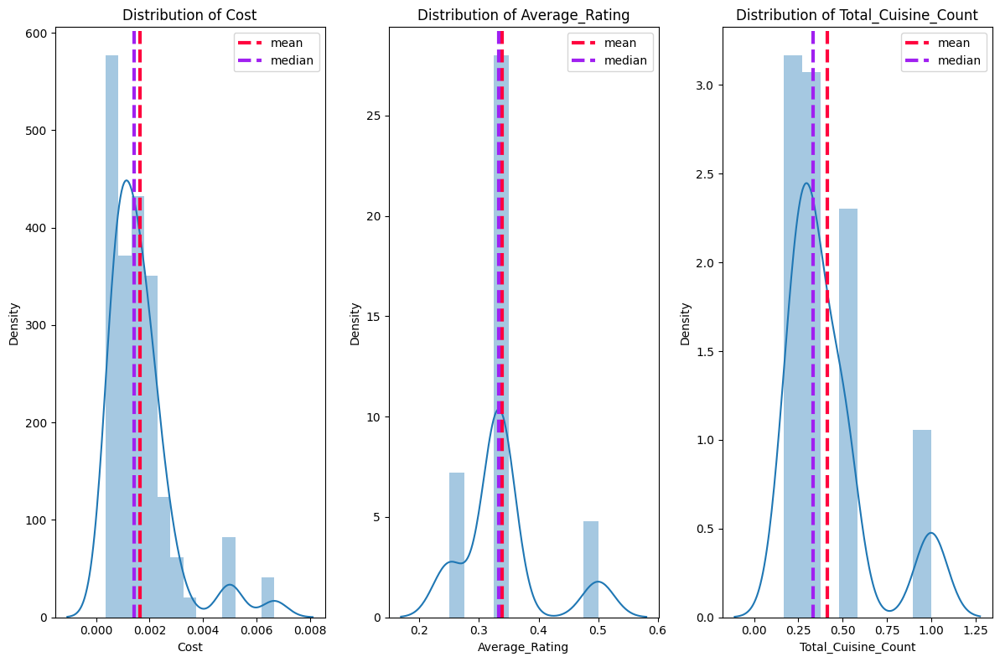

time: 2.94 s (started: 2023-08-05 20:05:43 +00:00)


In [204]:
## Checking the distribution of each continuous feature
plt.figure(figsize= (20,8))
for n,i in enumerate(col):
  plt.subplot(1,5,n+1)
  sns.distplot(test_df4[i])
  feature = test_df4[i]
  plt.axvline(feature.mean(), color='#ff033e', linestyle='dashed', linewidth=3,label= 'mean');  #red
  plt.axvline(feature.median(), color='#A020F0', linestyle='dashed', linewidth=3,label='median'); #cyan
  plt.legend(bbox_to_anchor = (1.0, 1))
  plt.title(f'Distribution of {i}')
  plt.tight_layout()

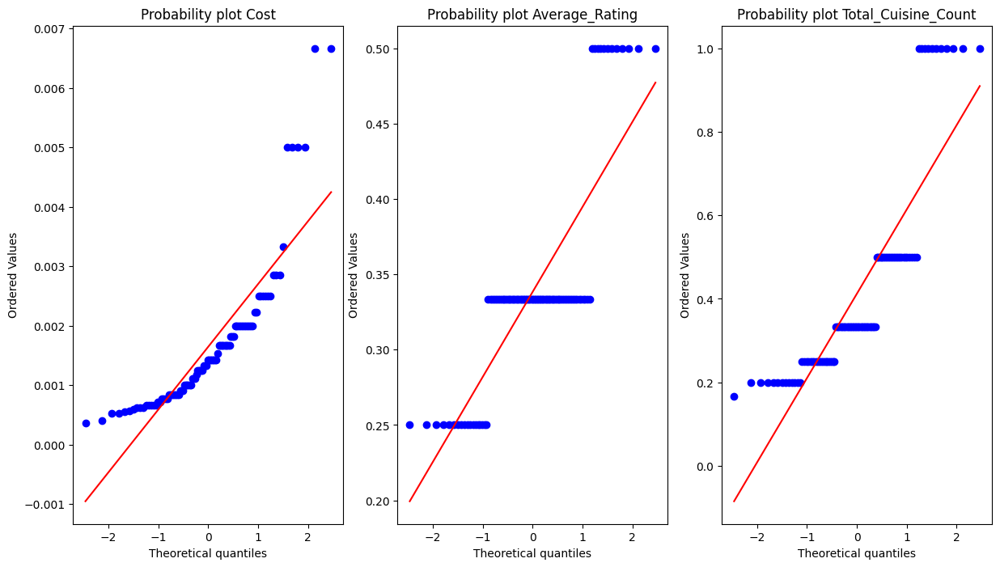

time: 1.5 s (started: 2023-08-05 20:05:46 +00:00)


In [205]:
# Import liberary for statics
import scipy.stats as stat
import pylab
# Q-Q ploting before transforming
plt.figure(figsize= (25,8))
for index,column in enumerate(col):
  plt.subplot(1,5,index+1)
  stat.probplot(test_df4[column],dist= 'norm',plot= pylab)
  plt.title(f'Probability plot {column}')
plt.show()

From the above plots it is clear that:
1. Feature "Cost" need not to any transformation
2. Feature "Average_Rating" need not to any transformation.
3. Feature 'Total_Cuisine_Count' need not to any transformation.

### 6. Data Scaling

In [206]:
# Select 5 randomly data in the cluster dataframe
cluster_dummy.sample(5)

,Restaurant,Cost,Average_Rating,Total_Cuisine_Count,American,Andhra,Arabian,Asian,BBQ,Bakery,...,North Indian,Pizza,Salad,Seafood,South Indian,Spanish,Street Food,Sushi,Thai,Wraps
32,Marsala Food Company,700,3,3,0,0,1,0,0,0,...,1,0,0,0,0,0,0,0,0,0
86,The Chocolate Room,600,2,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
73,Driven Cafe,600,3,3,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
89,Mohammedia Shawarma,150,2,2,0,0,1,0,0,0,...,0,0,0,0,0,0,1,0,0,0
58,Tempteys,350,3,2,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


time: 49.6 ms (started: 2023-08-05 20:05:47 +00:00)


In [207]:
# Import Scaling liberary
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

time: 3.48 ms (started: 2023-08-05 20:05:47 +00:00)


In [208]:
# Scaling your data
scaler.fit(cluster_dummy[col])
scaled_df = cluster_dummy.copy()
scaled_df[col] = scaler.transform(cluster_dummy[col])

time: 36.7 ms (started: 2023-08-05 20:05:47 +00:00)


In [209]:
# First view of scaled dataset
scaled_df

,Restaurant,Cost,Average_Rating,Total_Cuisine_Count,American,Andhra,Arabian,Asian,BBQ,Bakery,...,North Indian,Pizza,Salad,Seafood,South Indian,Spanish,Street Food,Sushi,Thai,Wraps
0,Beyond Flavours,-0.143026,1.726588,2.483145,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
1,Paradise,-0.143026,1.726588,-0.008305,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,Flechazo,0.850211,1.726588,0.822179,0,0,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
3,Shah Ghouse Hotel & Restaurant,-0.143026,-0.110208,1.652662,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
4,Over The Moon Brew Company,0.651564,1.726588,1.652662,0,0,0,1,0,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,Desi Bytes,-0.937616,-1.947004,-0.838788,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
96,Hyderabadi Daawat,-0.540321,-0.110208,-0.008305,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
97,Zega - Sheraton Hyderabad Hotel,1.744125,1.726588,-0.838788,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
98,Triptify,-0.937616,-0.110208,-1.669272,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


time: 71.8 ms (started: 2023-08-05 20:05:47 +00:00)


##### Which method have you used to scale you data and why?

To scale our data, we used the StandardScaler liberary of the Sklearn toolkit.  We need to know this since features on various scales can result in poor performance or a slow convergence. The features' standardisation also facilitates the comparison of various characteristics and the observation of a feature's impact on the target variable ("Response") by comparing the size of the feature's coefficient. Additionally, we'll use a linear regression model, which makes the statistical assumption that the data are normally distributed. Standardisation can assist enforce this model.

### 7. Dimesionality Reduction

##### Do you think that dimensionality reduction is needed? Explain Why?

Answer Here.

In [210]:
# import principal component analysis liberary
from sklearn.decomposition import PCA
pca = PCA()

time: 2.56 ms (started: 2023-08-05 20:05:47 +00:00)


In [211]:
# DImensionality Reduction (If needed)
scaled_df.set_index(['Restaurant'],inplace = True)
pca.fit(scaled_df)

PCA()

time: 48.9 ms (started: 2023-08-05 20:05:47 +00:00)


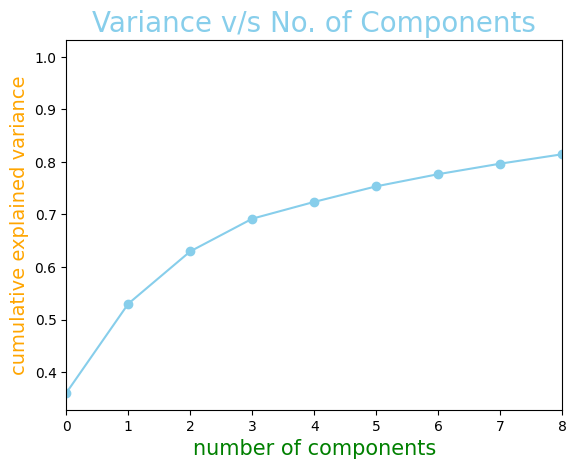

time: 590 ms (started: 2023-08-05 20:05:48 +00:00)


In [212]:
#explained variance v/s number of components
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker ='o', color= 'skyblue')
plt.xlabel('number of components',size = 15, color = 'green')
plt.ylabel('cumulative explained variance',size = 14, color = 'orange')
plt.title('Variance v/s No. of Components',size = 20, color = 'skyblue')
plt.xlim([0, 8])
plt.show()

In [213]:
# using n_component = 5
pca = PCA(n_components = 5)

# fit PCA on feature
pca.fit(scaled_df)

# Explained varience ratio of each pricipal componenet
print(f'Explained variation per principal component: {pca.explained_variance_ratio_}')
# Variance explained by five componenet
print(f'Cumulative variance explained by 5 principal components: {round(np.sum(pca.explained_variance_ratio_),2)}')
# transform data to principal component space
df_pca = pca.transform(scaled_df)

Explained variation per principal component: [0.36028996 0.16978646 0.09973793 0.06220322 0.03200214]
Cumulative variance explained by 5 principal components: 0.72
time: 26.9 ms (started: 2023-08-05 20:05:48 +00:00)


##### Do you think that dimensionality reduction is needed? Explain Why?

Yes, it is important to use dimensionality reduction techniques as dataset has 40 or more features. This is because, as the number of features increases, the computational cost of clustering algorithms also increases. In addition, high dimensionality can lead to the "curse of dimensionality", where the data becomes sparse and the clusters become harder to identify. Dimensionality reduction techniques such as PCA, t-SNE, or LLE can help reduce the number of features while maintaining the important information in the data, making it easier to cluster and interpret the results.

##### Which dimensionality reduction technique have you used and why? (If dimensionality reduction done on dataset.)

I have used PCA as dimension reduction technique, because PCA (Principal Component Analysis) is a widely used dimensionality reduction technique because it is able to identify patterns in the data that are responsible for the most variation. These patterns, known as principal components, are linear combinations of the original features that are uncorrelated with each other. By using the first few principal components, which account for the majority of the variation in the data, one can effectively reduce the dimensionality of the data while maintaining most of the important information.

Another advantage of PCA is that it is a linear technique, which means it can be applied to data that have a linear relationship between features. It is also easy to interpret the results as the principal components can be thought of as new, uncorrelated features. Additionally, PCA can be used for data visualization by projecting high-dimensional data onto a 2D or 3D space for easy visualization.


When PCA is applied before k-means, it is used to reduce the dimensionality of the data by transforming the original feature space into a new feature space of uncorrelated principal components. The k-means algorithm is then applied to the transformed data, resulting in clusters that are defined in the new feature space. The advantage of this approach is that it can help to remove noise and correlated features from the data, which can make the clustering results more interpretable. However, it also means that the clusters may be harder to interpret in the original feature space.

When PCA is applied after k-means, it is used to visualize the clusters in a lower-dimensional space. The k-means algorithm is applied to the original data, resulting in clusters that are defined in the original feature space. PCA is then used to project the data into a lower-dimensional space, making it easier to visualize and interpret the clusters. The advantage of this approach is that the clusters can be easily interpreted in the original feature space. However, it may not be as effective in removing noise and correlated features from the data.



### 8. Data Splitting

In [214]:
# Split your data to train and test. Choose Splitting ratio wisely.
X = X_tfidf
y = sentiment_df['sentiment']

time: 881 µs (started: 2023-08-05 20:05:48 +00:00)


In [215]:
# Import liberary
from sklearn.model_selection import train_test_split
x_tr,x_tst,y_tr,y_tst = train_test_split(X,y)

time: 32.9 ms (started: 2023-08-05 20:05:48 +00:00)


In [216]:
# Describe the shape of the train and test dataset
print('Shape of the X train dataset : ',x_tr.shape)
print('Shape of the X test dataset :  ',x_tst.shape)
print('Shape of the y train dataset : ',y_tr.shape)
print('Shape of the y test dataset :  ',y_tst.shape)

Shape of the X train dataset :  (7471, 17327)
Shape of the X test dataset :   (2491, 17327)
Shape of the y train dataset :  (7471,)
Shape of the y test dataset :   (2491,)
time: 8.78 ms (started: 2023-08-05 20:05:48 +00:00)


##### What data splitting ratio have you used and why?

Since our dataset is large set of data having nearly 10lakh obsevations. So, We have assigned 80% data into train set and 20% into the test set with random_state=0 so that we do not get different observations in every split.

### 9. Handling Imbalanced Dataset

##### Do you think the dataset is imbalanced? Explain Why.

Using class imbalance ratio (CIR) to measure data imbalance. The CIR is calculated as the ratio of the number of observations in the majority class (Nm) to the number of observations in the minority class (Nm). The CIR can be expressed as: CIR = Nm / Ns, where Nm is the number of observations in the majority class and Ns is the number of observations in the minority class.

In [217]:
# Handling Imbalanced Dataset (If needed)
a = sentiment_df.sentiment.value_counts().reset_index()
a.columns = ['Sentiment','Counts']

time: 13.2 ms (started: 2023-08-05 20:05:48 +00:00)


In [218]:
# Defining the majority and minority value
majority_class = sentiment_df[sentiment_df['sentiment'] == 1].shape[0]
minority_class = sentiment_df[sentiment_df['sentiment'] == 0].shape[0]

time: 16.4 ms (started: 2023-08-05 20:05:48 +00:00)


In [219]:
# Checking the value of the CIR to reach the problem that Class is inbalance or not
CIR = majority_class / minority_class
print(round(CIR,2))
print('\n')

1.7


time: 7.77 ms (started: 2023-08-05 20:05:48 +00:00)


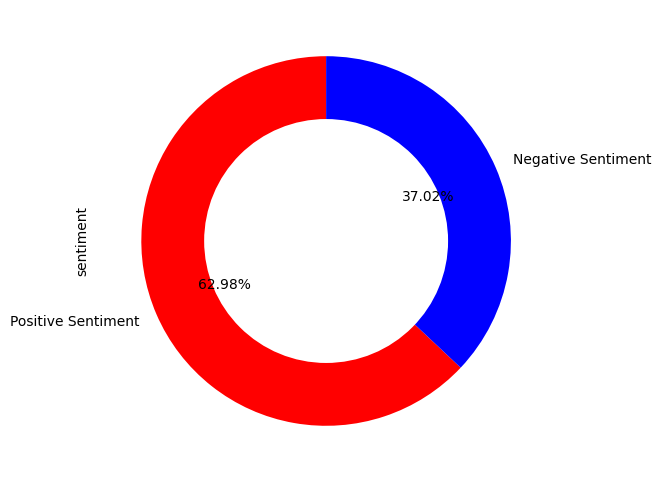

time: 400 ms (started: 2023-08-05 20:05:48 +00:00)


In [220]:
# Dependant Variable Column Visualization
sentiment_df['sentiment'].value_counts().plot(kind='pie',
                              figsize=(15,6),
                               autopct="%1.2f%%",
                               startangle= 90,
                               shadow=False,
                               labels=['Positive Sentiment','Negative Sentiment'],
                               colors=['red','blue'],
                               explode=[0,0]
                              )
centre_circle = plt.Circle((0, 0), 0.66, fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)
plt.show()

##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)

Yes, the dataset is unbalanced, with a ratio of 60:40, where 60 represents the majority class and 40 represents the minority class. Even the CIR score indicates that the dominant class is greater than the minority class by a factor of 1.73. However, since it is only a tiny imbalance, **not required** to cure class imbalance, no under or over sampling technique is used.

## ***7. ML Model Implementation***

### ML Model - 1 (Cluster Analysis)

K-Means Clustering is an Unsupervised Learning algorithm.The algorithm takes the unlabeled dataset as input, divides the dataset into k-number of clusters, and repeats the process until it does not find the best clusters. The value of k should be predetermined in this algorithm.

It is a centroid-based algorithm, where each cluster is associated with a centroid. The main aim of this algorithm is to minimize the sum of distances between the data point and their corresponding clusters.

The k-means clustering algorithm mainly performs two tasks:

Determines the best value for K center points or centroids by an iterative process.

Assigns each data point to its closest k-center. Those data points which are near to the particular k-center, create a cluster.

**ELBOW METHOD**

> This method uses the concept of WCSS value. WCSS stands for Within Cluster Sum of Squares, which defines the total variations within a cluster.

**SILHOUETTE METHOD**

> The silhouette coefficient or silhouette score kmeans is a measure of how similar a data point is within-cluster (cohesion) compared to other clusters (separation).

In [222]:
# Import K-Means Liberary
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

time: 148 ms (started: 2023-08-05 20:09:28 +00:00)


In [223]:
#Within Cluster Sum of Squared Errors(CSSE) for different values of k
csse=[]
for i in range(1,11):
    km=KMeans(n_clusters=i,random_state = 20)
    km.fit(df_pca)
    csse.append(km.inertia_)

Exception ignored on calling ctypes callback function: <function ThreadpoolController._find_libraries_with_dl_iterate_phdr.<locals>.match_library_callback at 0x78551cb304c0>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/threadpoolctl.py", line 847, in match_library_callback
    self._make_controller_from_path(filepath)
  File "/usr/local/lib/python3.10/dist-packages/threadpoolctl.py", line 984, in _make_controller_from_path
    lib_controller = controller_class(filepath=filepath, prefix=prefix)
  File "/usr/local/lib/python3.10/dist-packages/threadpoolctl.py", line 111, in __init__
    self.dynlib = ctypes.CDLL(filepath, mode=_RTLD_NOLOAD)
  File "/usr/lib/python3.10/ctypes/__init__.py", line 374, in __init__
    self._handle = _dlopen(self._name, mode)
OSError: /usr/local/lib/python3.10/dist-packages/numpy.libs/libopenblas64_p-r0-2f7c42d4.3.18.so: cannot open shared object file: No such file or directory


time: 284 ms (started: 2023-08-05 20:09:29 +00:00)


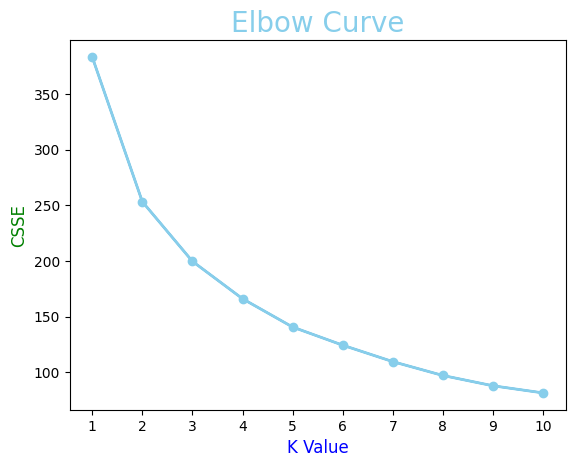

time: 270 ms (started: 2023-08-05 20:09:29 +00:00)


In [224]:
#elbow curve
plt.plot(range(1,11),csse)
plt.plot(range(1,11),csse, linewidth=2, color="skyblue", marker ="o")
plt.xlabel("K Value", size = 12, color = 'blue')
plt.xticks(np.arange(1,11,1))
plt.ylabel("CSSE", size = 12, color = 'green')
plt.title('Elbow Curve', size = 20, color = 'skyblue')
plt.show()

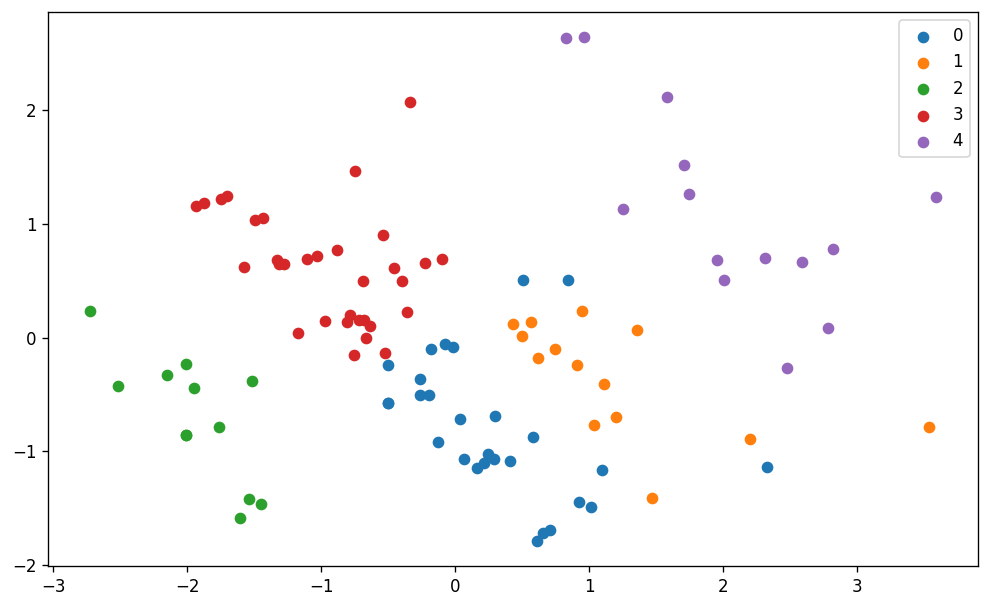

time: 427 ms (started: 2023-08-05 20:09:29 +00:00)


In [225]:
#vizualizing the clusters and the datapoints in each clusters
plt.figure(figsize = (10,6), dpi = 120)

kmeans= KMeans(n_clusters = 5, init= 'k-means++', random_state = 42)
kmeans.fit(df_pca)

#predict the labels of clusters.
label = kmeans.fit_predict(df_pca)
#Getting unique labels
unique_labels = np.unique(label)

#plotting the results:
for i in unique_labels:
    plt.scatter(df_pca[label == i , 0] , df_pca[label == i , 1] , label = i)
plt.legend()
plt.show()

In [226]:
#making df for pca
kmeans_pca_df = pd.DataFrame(df_pca,columns=['PC1','PC2','PC3','PC4','PC5'],index=scaled_df.index)
kmeans_pca_df["label"] = label
kmeans_pca_df.sample(5)

,PC1,PC2,PC3,PC4,PC5,label
Restaurant,,,,,,
The Chocolate Room,-2.007467,-0.229321,0.912028,0.929135,-0.026006,2
Shree Santosh Dhaba Family Restaurant,-1.542949,-1.423148,0.644241,-0.030394,-0.178744,2
PourHouse7,1.037121,-0.772070,0.594344,-0.146578,-0.284693,1
Hunger Maggi Point,-1.935451,1.155492,-0.415782,0.135659,-0.065598,3
10 Downing Street,1.357101,0.063895,1.566584,-0.461375,0.094068,1


time: 29.4 ms (started: 2023-08-05 20:09:30 +00:00)


In [227]:
#joining the cluster labels to names dataframe
cluster_dummy.set_index(['Restaurant'],inplace=True)
cluster_dummy = cluster_dummy.join(kmeans_pca_df['label'])
cluster_dummy.sample(5)

,Cost,Average_Rating,Total_Cuisine_Count,American,Andhra,Arabian,Asian,BBQ,Bakery,Beverages,...,Pizza,Salad,Seafood,South Indian,Spanish,Street Food,Sushi,Thai,Wraps,label
Restaurant,,,,,,,,,,,,,,,,,,,,,
Being Hungry,450,3,2,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3
Over The Moon Brew Company,1200,4,5,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,4
Triptify,400,3,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3
Hyderabadi Daawat,600,3,3,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Shah Ghouse Hotel & Restaurant,800,3,5,0,0,0,0,0,0,1,...,0,0,1,0,0,0,0,0,0,0


time: 30.1 ms (started: 2023-08-05 20:09:30 +00:00)


In [228]:
#creating df to store cluster data
clustering_result = cluster_dummy.copy().reset_index()
clustering_result = df_restaurant[['Restaurant','Cuisines']].merge(clustering_result[['Restaurant','Cost',
                  'Average_Rating',	'Total_Cuisine_Count','label']], on = 'Restaurant')
clustering_result.head()

,Restaurant,Cuisines,Cost,Average_Rating,Total_Cuisine_Count,label
0,Beyond Flavours,"Chinese, Continental, Kebab, European, South I...",800,4,6,0
1,Paradise,"Biryani, North Indian, Chinese",800,4,3,0
2,Flechazo,"Asian, Mediterranean, North Indian, Desserts",1300,4,4,4
3,Shah Ghouse Hotel & Restaurant,"Biryani, North Indian, Chinese, Seafood, Bever...",800,3,5,0
4,Over The Moon Brew Company,"Asian, Continental, North Indian, Chinese, Med...",1200,4,5,4


time: 25 ms (started: 2023-08-05 20:09:30 +00:00)


In [229]:
# Counting content in each cluster
cluster_count = cluster_dummy['label'].value_counts().reset_index().rename(
    columns={'index':'label','label':'Total_Restaurant'}).sort_values(by='Total_Restaurant')
cluster_count

,label,Total_Restaurant
4,2,12
2,4,14
3,1,14
1,0,28
0,3,32


time: 13.3 ms (started: 2023-08-05 20:09:30 +00:00)


In [230]:
#creating new df for checkign cuising in each cluster
new_cluster_df = clustering_result.copy()
new_cluster_df['Cuisines'] = new_cluster_df['Cuisines'].str.split(',')
new_cluster_df = new_cluster_df.explode('Cuisines')
#removing extra trailing space from cuisines after exploded
new_cluster_df['Cuisines'] = new_cluster_df['Cuisines'].apply(lambda x: x.strip())
new_cluster_df.sample(5)

,Restaurant,Cuisines,Cost,Average_Rating,Total_Cuisine_Count,label
53,Diners Pavilion,Continental,1200,3,3,1
38,The Glass Onion,Asian,1200,3,4,1
32,Marsala Food Company,Arabian,700,3,3,0
89,Mohammedia Shawarma,Arabian,150,2,2,2
46,Ulavacharu,Andhra,1400,3,3,1


time: 30.1 ms (started: 2023-08-05 20:09:30 +00:00)


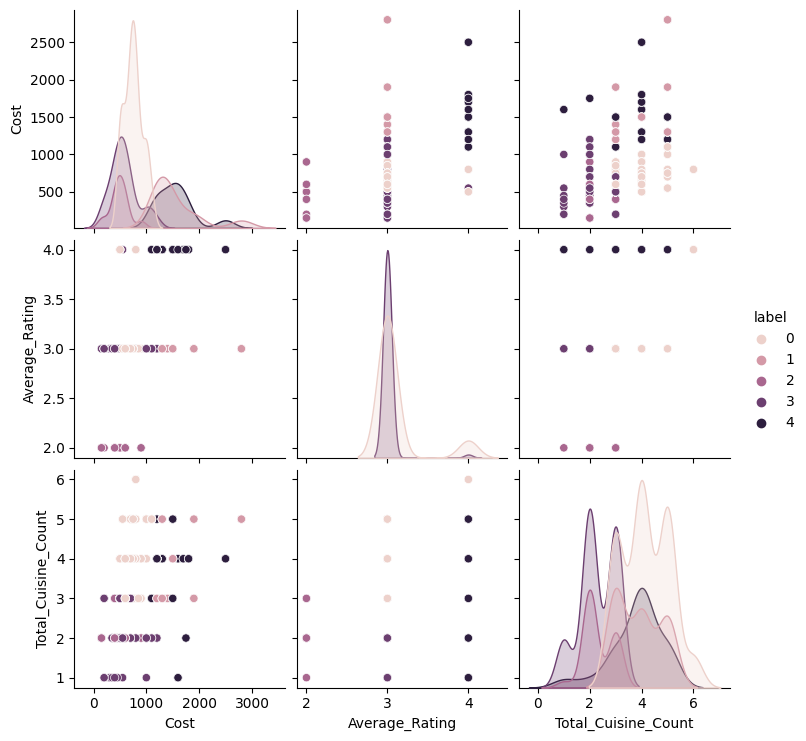

time: 4.73 s (started: 2023-08-05 20:09:30 +00:00)


In [231]:
sns.pairplot(new_cluster_df,diag_kind = 'kde', hue='label')

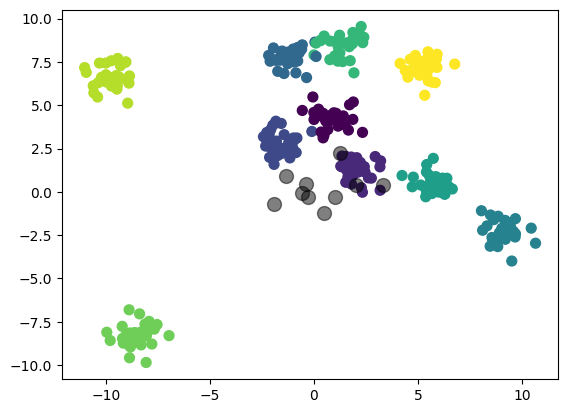

time: 334 ms (started: 2023-08-05 20:09:35 +00:00)


In [232]:
for i in range(1,20):
    points = np.array(new_cluster_df.loc[new_cluster_df['label'] == i])

points

#from sklearn.datasets.samples_generator import make_blobs
X, y_true = make_blobs(n_samples=300, centers=10,
                       cluster_std=0.60, random_state=0)
# Scatter plot
plt.scatter(X[:, 0], X[:, 1], c=y_true, s=50, cmap='viridis')

centers = km.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=100, alpha=0.5)

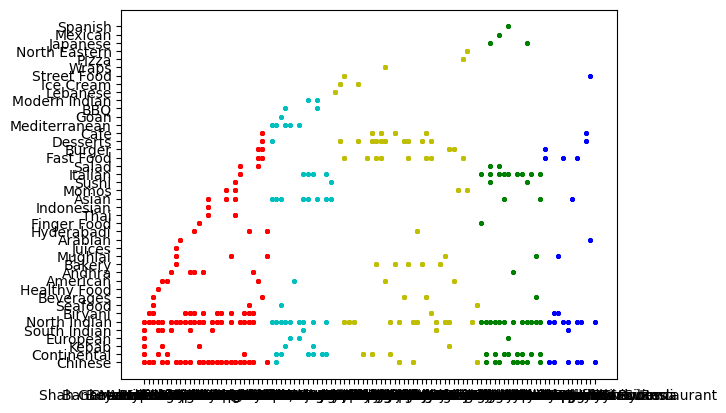

time: 5.33 s (started: 2023-08-05 20:09:35 +00:00)


In [233]:
colors = ['r', 'g', 'b', 'y', 'c']
fig, ax = plt.subplots()
c = np.array([3,3])

for i in label:
        points = np.array(new_cluster_df.loc[new_cluster_df['label'] == i])
        #c[i] = np.mean(points, axis=0)
        ax.scatter(points[:, 0], points[:, 1], s=5, c=colors[i])

The fundamental model assumptions of k-means (points will be closer to their own cluster center than to others) means that the algorithm will often be ineffective if the clusters have complicated geometries.In particular, the boundaries between k-means clusters will always be linear, which means that it will fail for more complicated boundaries.

In [234]:
from sklearn.datasets import make_moons
X, y = make_moons(200, noise=.05, random_state=0)

time: 3.74 ms (started: 2023-08-05 20:09:40 +00:00)


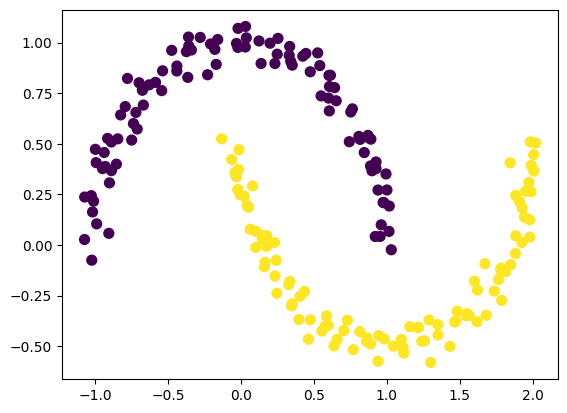

time: 1.02 s (started: 2023-08-05 20:09:40 +00:00)


In [235]:
plt.scatter(X[:, 0], X[:, 1],c=y,s=50)

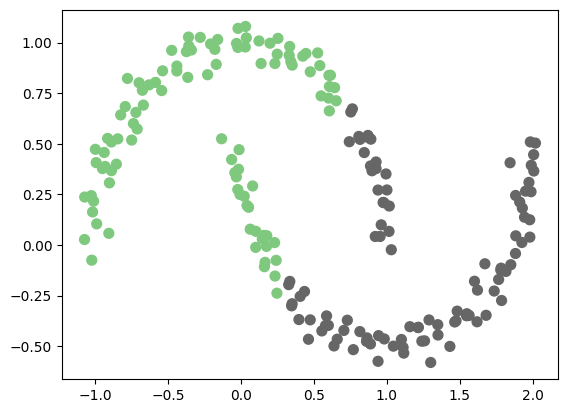

time: 1.13 s (started: 2023-08-05 20:09:41 +00:00)


In [236]:
labels = KMeans(2, random_state=0).fit_predict(X)
plt.scatter(X[:, 0], X[:, 1], c=labels,
            s=50, cmap='Accent')

This situation is reminiscent of the discussion in Support Vector Machines, where we used a kernel transformation to project the data into a higher dimension where a linear separation is possible.We might imagine using the same trick to allow k-means to discover non-linear boundaries.One version of this kernelized k-means is implemented in Scikit-Learn within the SpectralClustering estimator.It uses the graph of nearest neighbors to compute a higher-dimensional representation of the data, and then assigns labels using a k-means algorithm.

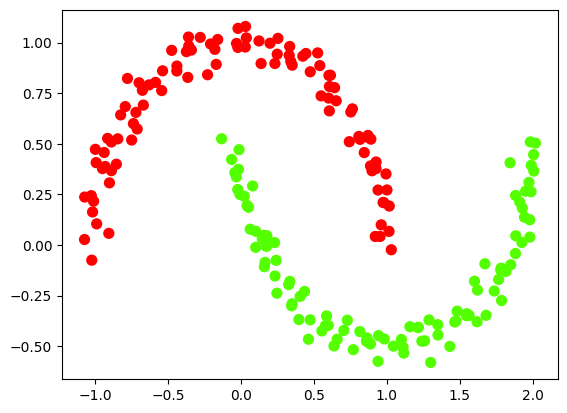

time: 2.25 s (started: 2023-08-05 20:09:43 +00:00)


In [237]:
from sklearn.cluster import SpectralClustering
model = SpectralClustering(n_clusters=2, affinity='nearest_neighbors',
                           assign_labels='kmeans')
labels = model.fit_predict(X)
plt.scatter(X[:, 0], X[:, 1], c=labels,
            s=50, cmap='prism')

In [238]:
#printing cuisine list for each cluster
for cluster in new_cluster_df['label'].unique().tolist():
  print('Cuisine List for Cluster :', cluster,'\n')
  print(new_cluster_df[new_cluster_df["label"]== cluster]['Cuisines'].unique(),'\n')
  print('='*120)

Cuisine List for Cluster : 0 

['Chinese' 'Continental' 'Kebab' 'European' 'South Indian' 'North Indian'
 'Biryani' 'Seafood' 'Beverages' 'Healthy Food' 'American' 'Andhra'
 'Bakery' 'Mughlai' 'Juices' 'Arabian' 'Hyderabadi' 'Finger Food' 'Thai'
 'Indonesian' 'Asian' 'Momos' 'Sushi' 'Italian' 'Salad' 'Fast Food'
 'Burger' 'Desserts' 'Cafe'] 

Cuisine List for Cluster : 4 

['Asian' 'Mediterranean' 'North Indian' 'Desserts' 'Continental' 'Chinese'
 'Seafood' 'Goan' 'Kebab' 'BBQ' 'European' 'American' 'Italian'
 'South Indian' 'Modern Indian' 'Sushi'] 

Cuisine List for Cluster : 3 

['Lebanese' 'Ice Cream' 'Desserts' 'Street Food' 'North Indian'
 'Fast Food' 'Continental' 'Cafe' 'Bakery' 'American' 'Wraps' 'Chinese'
 'Beverages' 'Hyderabadi' 'Biryani' 'South Indian' 'Mughlai' 'Burger'
 'Kebab' 'Momos' 'Pizza' 'North Eastern' 'Seafood'] 

Cuisine List for Cluster : 1 

['North Indian' 'Italian' 'Finger Food' 'Chinese' 'Continental' 'Japanese'
 'Salad' 'Sushi' 'Mexican' 'Asian' 'European'

For n_clusters = 2 average silhouette_score is : 0.2971178700222362
For n_clusters = 3 average silhouette_score is : 0.27099365756216526
For n_clusters = 4 average silhouette_score is : 0.29571080398869015
For n_clusters = 5 average silhouette_score is : 0.30940576619002574
For n_clusters = 6 average silhouette_score is : 0.308291102354189
For n_clusters = 7 average silhouette_score is : 0.29856369856530024
For n_clusters = 8 average silhouette_score is : 0.31891370536512087
For n_clusters = 9 average silhouette_score is : 0.3327552631781031


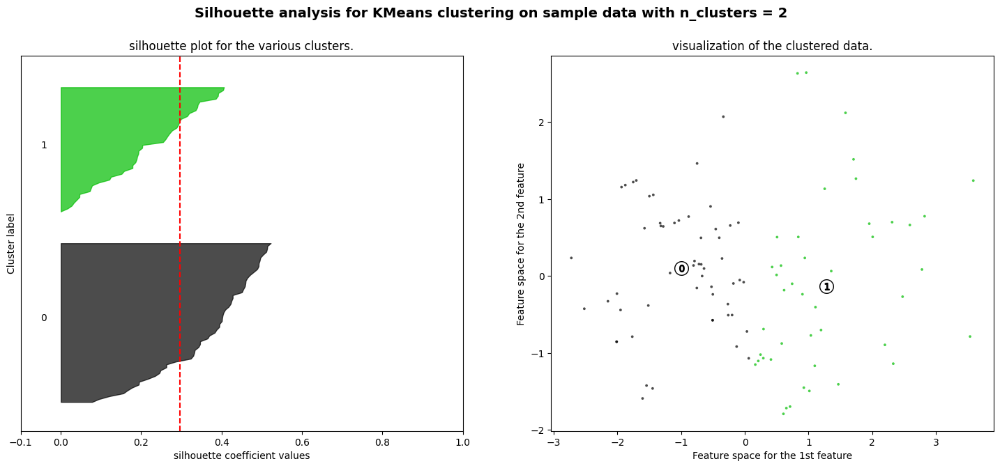

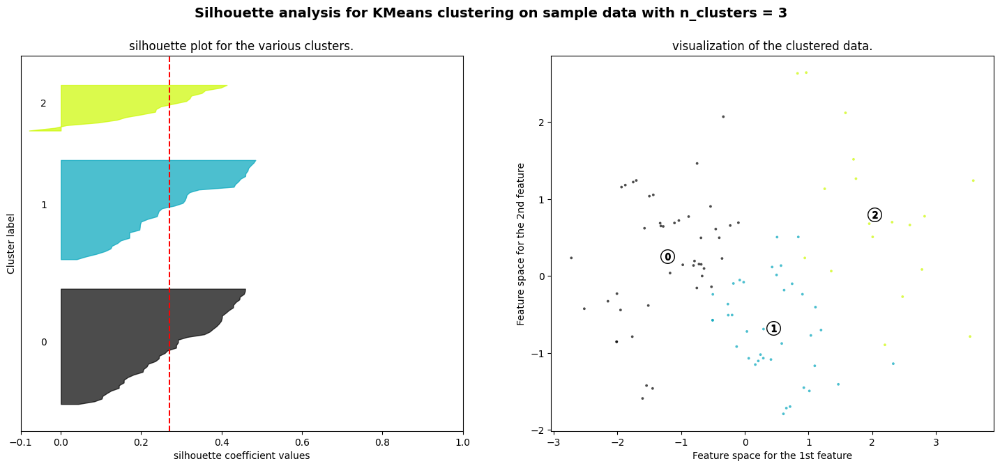

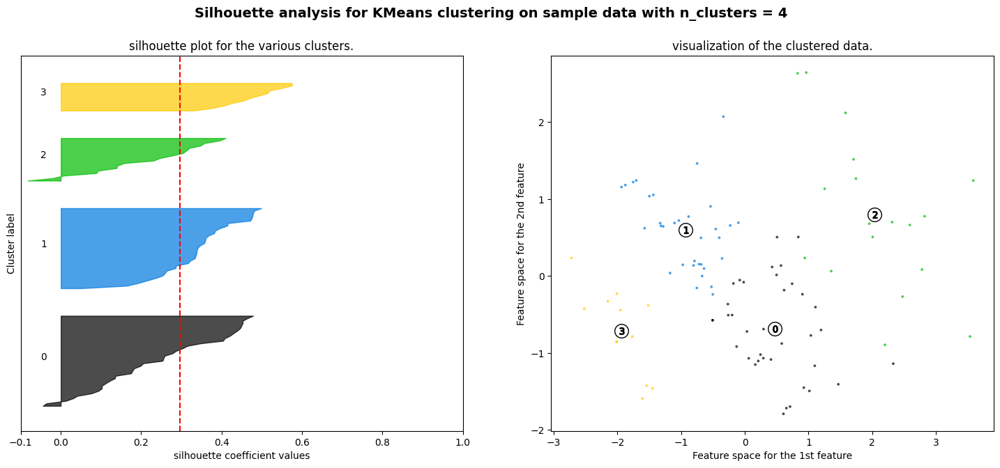

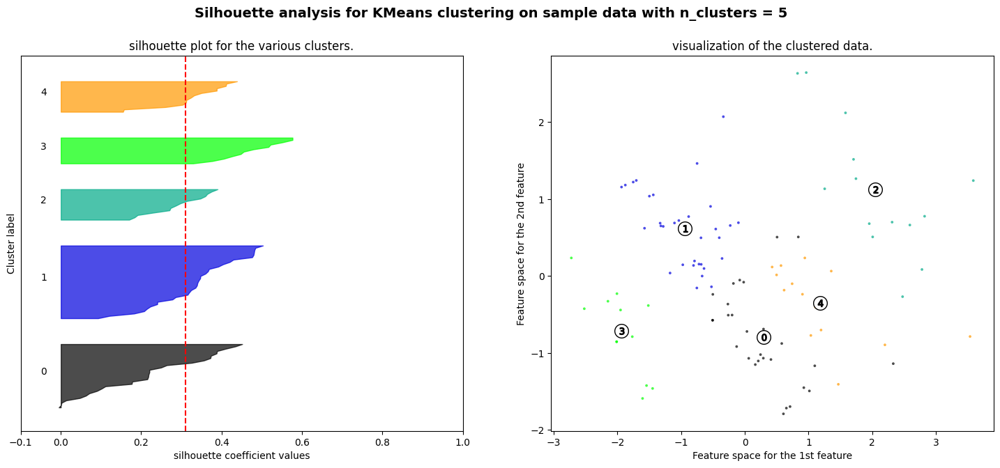

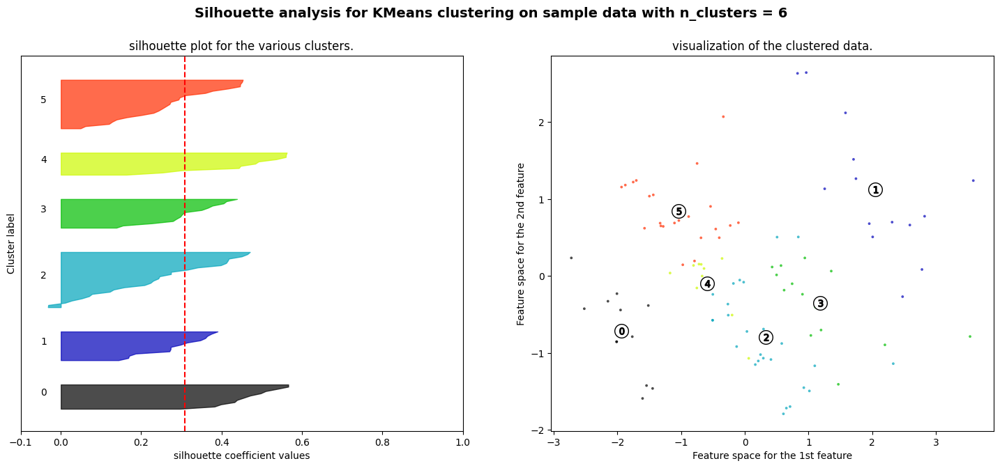

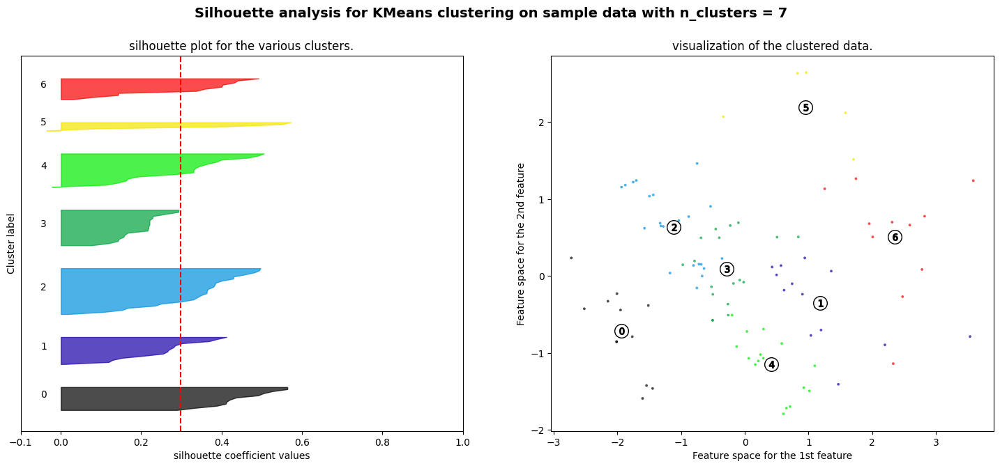

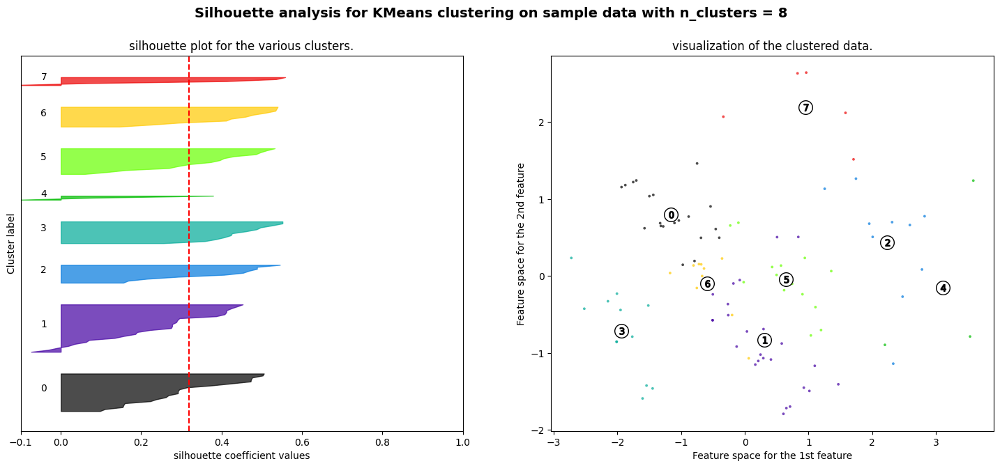

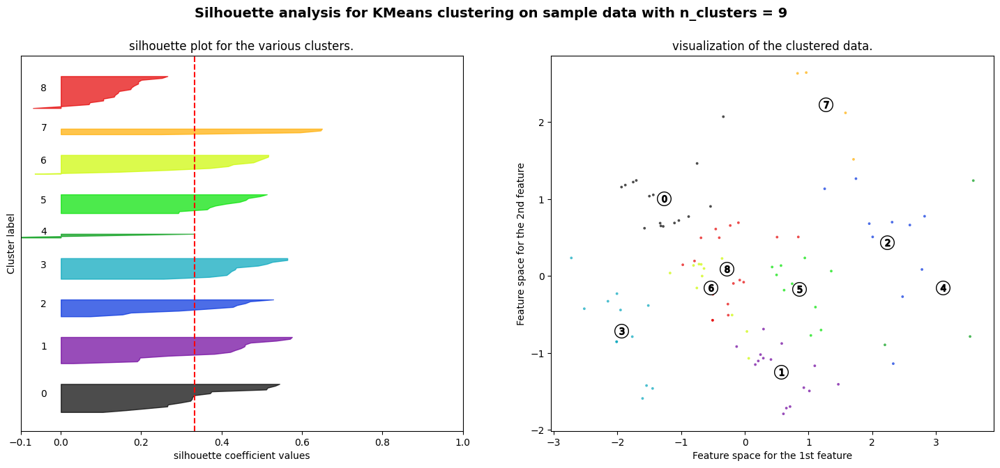

time: 13.2 s (started: 2023-08-05 20:09:45 +00:00)


In [239]:
#silhouette score
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
from sklearn.model_selection import ParameterGrid
# candidates for the number of cluster
parameters = list(range(2,10))
#parameters
parameter_grid = ParameterGrid({'n_clusters': parameters})
best_score = -1
#visualizing Silhouette Score for individual clusters and the clusters made
for n_clusters in parameters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # 1st subplot is the silhouette plot
    # silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(df_pca) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(df_pca)

    # silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(df_pca, cluster_labels)
    print("For n_clusters =", n_clusters,
          "average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_pca, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = plt.cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("silhouette plot for the various clusters.")
    ax1.set_xlabel("silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = plt.cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(df_pca[:, 0], df_pca[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')
    #marker='$%d$' % i will give numer in cluster in 2 plot
    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")
    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

####Agglomerative Hierarchical Clustering

Hierarchial clustering algorithms group similar objects into groups called clusters. There are two types of hierarchical clustering algorithms:

Agglomerative — Bottom up approach. Start with many small clusters and merge them together to create bigger clusters. Divisive — Top down approach. Start with a single cluster than break it up into smaller clusters.

**Agglomerative hierarchical clustering**
> The agglomerative hierarchical clustering algorithm is a popular example of HCA. To group the datasets into clusters, it follows the bottom-up approach. It means, this algorithm considers each dataset as a single cluster at the beginning, and then start combining the closest pair of clusters together. It does this until all the clusters are merged into a single cluster that contains all the datasets. This hierarchy of clusters is represented in the form of the dendrogram.

**Dendrogram in Hierarchical clustering**

> The dendrogram is a tree-like structure that is mainly used to store each step as a memory that the HC algorithm performs. In the dendrogram plot, the Y-axis shows the Euclidean distances between the data points, and the x-axis shows all the data points of the given dataset.

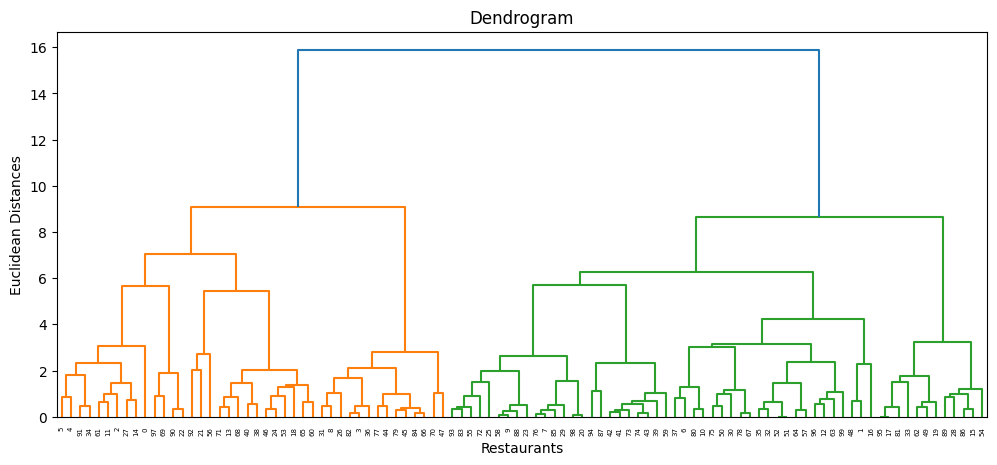

time: 4.42 s (started: 2023-08-05 20:09:58 +00:00)


In [240]:
#importing module for hierarchial clustering and vizualizing dendograms
import scipy.cluster.hierarchy as sch
plt.figure(figsize=(12,5))
dendrogram = sch.dendrogram(sch.linkage(df_pca, method = 'ward'),orientation='top',
            distance_sort='descending',
            show_leaf_counts=True)

plt.title('Dendrogram')
plt.xlabel('Restaurants')
plt.ylabel('Euclidean Distances')

plt.show()

In [241]:
#Checking the Silhouette score for 15 clusters
from sklearn.cluster import AgglomerativeClustering

range_n_clusters = [2,3,4,5,6,7,8,9,10,11,12,13,14,15]
for n_clusters in range_n_clusters:
    hc = AgglomerativeClustering(n_clusters = n_clusters, affinity = 'euclidean', linkage = 'ward')
    y_hc = hc.fit_predict(df_pca)
    score = silhouette_score(df_pca, y_hc)
    print(f"For n_clusters = {n_clusters}, silhouette score is {round(score,2)}")

For n_clusters = 2, silhouette score is 0.29
For n_clusters = 3, silhouette score is 0.23
For n_clusters = 4, silhouette score is 0.25
For n_clusters = 5, silhouette score is 0.28
For n_clusters = 6, silhouette score is 0.27
For n_clusters = 7, silhouette score is 0.29
For n_clusters = 8, silhouette score is 0.31
For n_clusters = 9, silhouette score is 0.33
For n_clusters = 10, silhouette score is 0.34
For n_clusters = 11, silhouette score is 0.34
For n_clusters = 12, silhouette score is 0.35
For n_clusters = 13, silhouette score is 0.34
For n_clusters = 14, silhouette score is 0.34
For n_clusters = 15, silhouette score is 0.34
time: 230 ms (started: 2023-08-05 20:10:03 +00:00)


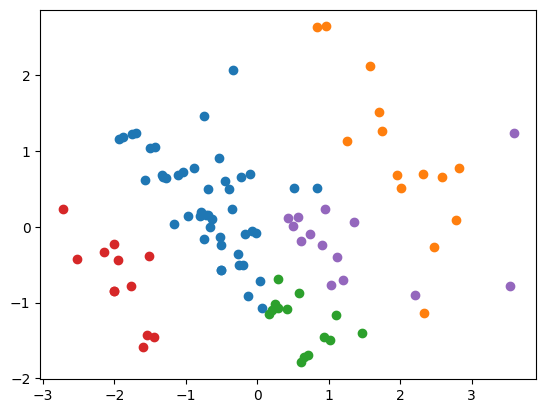

Silhouette Coefficient: 0.278
davies_bouldin_score 1.167
time: 936 ms (started: 2023-08-05 20:10:03 +00:00)


In [242]:
# agglomerative clustering
from numpy import unique
from numpy import where
from sklearn.datasets import make_classification

# define the model
model = AgglomerativeClustering(n_clusters = 5)      #n_clusters=5
# fit model and predict clusters
y_hc = model.fit_predict(df_pca)
# retrieve unique clusters
clusters = unique(y_hc)
# create scatter plot for samples from each cluster
for cluster in clusters:
	# get row indexes for samples with this cluster
	row_ix = where(y_hc == cluster)
	# create scatter of these samples
	plt.scatter(df_pca[row_ix, 0], df_pca[row_ix, 1])
# show the plot
plt.show()
#Evaluation

#Silhouette Coefficient
print("Silhouette Coefficient: %0.3f"%silhouette_score(df_pca,y_hc, metric='euclidean'))

#davies_bouldin_score of our clusters
from sklearn.metrics import davies_bouldin_score
davies_bouldin_score(df_pca, y_hc)
print("davies_bouldin_score %0.3f"%davies_bouldin_score(df_pca, y_hc))

In [243]:
#creating new colummn for predicting cluster using hierarcial clsutering
clustering_result['label_hr'] = y_hc
clustering_result.sample(5)

,Restaurant,Cuisines,Cost,Average_Rating,Total_Cuisine_Count,label,label_hr
10,Sardarji's Chaats & More,"Street Food, North Indian, Fast Food",400,3,3,3,0
20,13 Dhaba,North Indian,450,3,1,3,0
25,Tiki Shack,Continental,1000,3,1,3,0
61,Prism Club & Kitchen,"Kebab, Continental, Italian, North Indian",1200,4,4,4,1
64,Hyderabad Chefs,"North Indian, Chinese",600,3,2,3,0


time: 63.8 ms (started: 2023-08-05 20:10:04 +00:00)


 **K-means** and **hierarchical clustering** are two different methods for grouping data points into clusters. K-means is a centroid-based method, where each cluster is defined by the mean of the data points assigned to it. Hierarchical clustering, on the other hand, is a linkage-based method, where clusters are defined by the similarity of data points. Because these methods use different criteria to define clusters, the labels they assign to data points can be different. Additionally, the number of clusters and initialization of the algorithm can also affect the outcome, which can cause the labels to differ.

### ML Model - 2 (Sentiment Analysis)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [244]:
#calculating silhouette score for n_component
from sklearn.metrics import silhouette_score
from sklearn.decomposition import LatentDirichletAllocation

topic_range = range(2, 11)
silhouette_scores = []

for n_components in topic_range:
    lda = LatentDirichletAllocation(n_components=n_components)
    lda.fit(X_tfidf)
    labels = lda.transform(X_tfidf).argmax(axis=1)
    silhouette_scores.append(silhouette_score(X_tfidf, labels))


time: 5min 10s (started: 2023-08-05 20:16:55 +00:00)


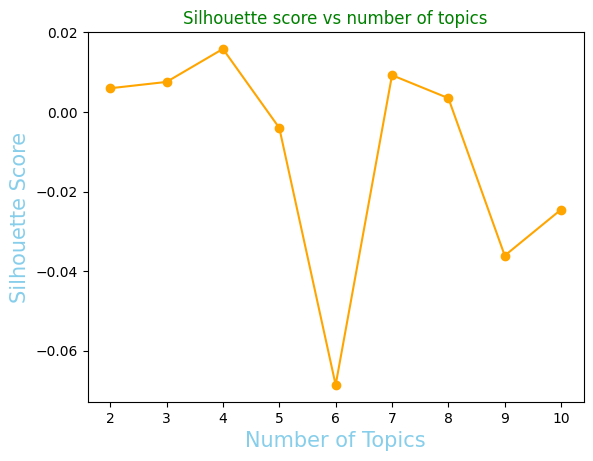

time: 284 ms (started: 2023-08-05 20:22:06 +00:00)


In [245]:
#plotting silhouette score
plt.plot(topic_range, silhouette_scores, marker ='o', color='orange')
plt.xlabel('Number of Topics', size = 15, color = 'skyblue')
plt.ylabel('Silhouette Score', size = 15, color = 'skyblue')
plt.title('Silhouette score vs number of topics',color = 'green')
plt.show()

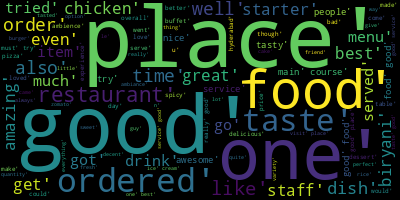

<Figure size 1500x800 with 0 Axes>

time: 2.9 s (started: 2023-08-05 20:22:07 +00:00)


In [247]:
# Word cloud for positive reviews.
plt.figure(figsize=(15,8))
from wordcloud import WordCloud
sentiment_df['Review']=sentiment_df['Review'].astype(str)
from nltk.stem import PorterStemmer
ps = PorterStemmer()
sentiment_df['Review']=sentiment_df['Review'].map(lambda x: ps.stem(x))
long_string = ','.join(list(sentiment_df['Review'].values))
long_string
wordcloud = WordCloud(background_color="black", max_words=100, contour_width=3, contour_color='steelblue')
wordcloud.generate(long_string)
wordcloud.to_image()

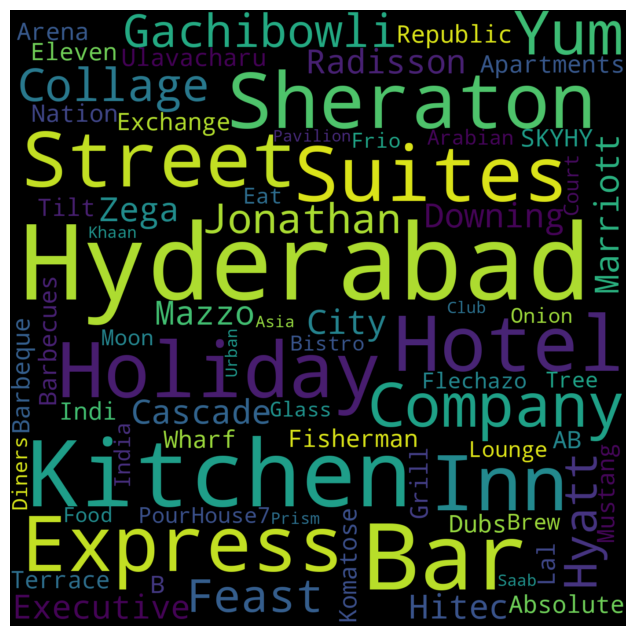

time: 3.25 s (started: 2023-08-05 20:22:10 +00:00)


In [248]:
# Creating word cloud for expensive restaurants.
plt.figure(figsize=(15,8))
text = " ".join(name for name in df_restaurant.sort_values('Cost',ascending=False).Restaurant[:30])

# Creating word_cloud with text as argument in .generate() method.
word_cloud = WordCloud(width = 1400, height = 1400,collocations = False, background_color = 'black').generate(text)

# Display the generated Word Cloud.
plt.imshow(word_cloud, interpolation='bilinear')

plt.axis("off");

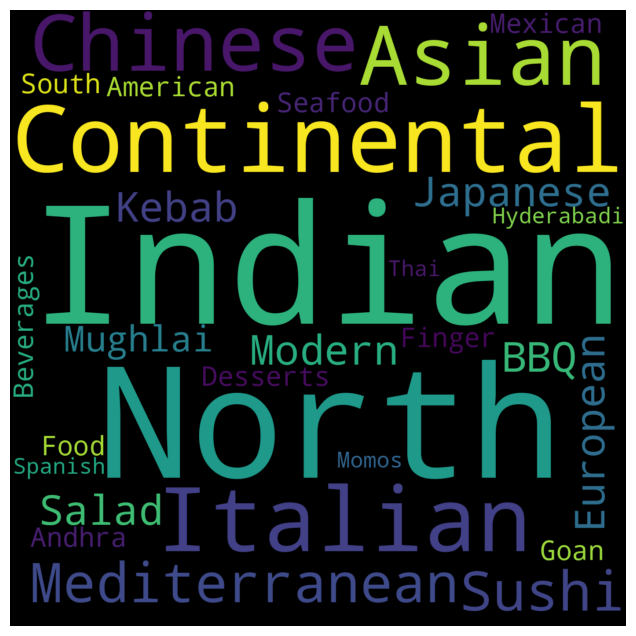

time: 2.55 s (started: 2023-08-05 20:22:13 +00:00)


In [249]:
# Creating word cloud for expensive restaurants.
plt.figure(figsize=(15,8))
text = " ".join(cuin for cuin in df_restaurant.sort_values('Cost',ascending=False).Cuisines[:30])

# Creating word_cloud with text as argument in .generate() method.
word_cloud = WordCloud(width = 1400, height = 1400,collocations = False, background_color = 'black').generate(text)

# Display the generated Word Cloud.
plt.imshow(word_cloud, interpolation='bilinear')

plt.axis("off");

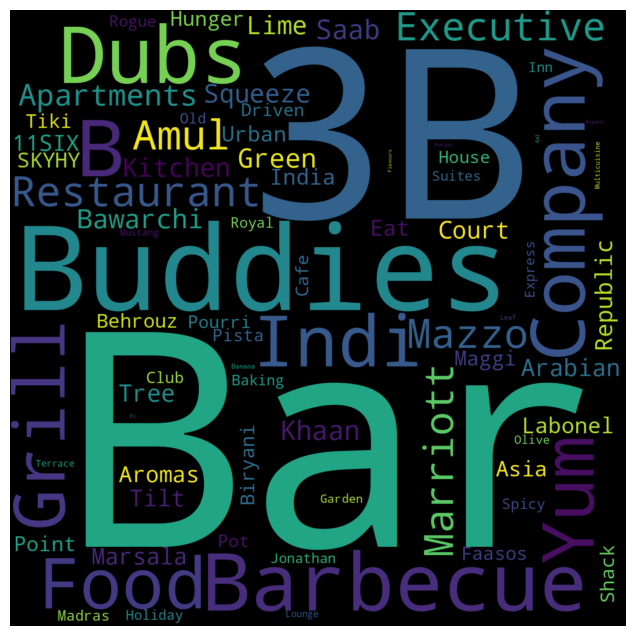

time: 3.98 s (started: 2023-08-05 20:22:16 +00:00)


In [250]:
# Creating word cloud for expensive restaurants.
plt.figure(figsize=(15,8))
text = " ".join(cuin for cuin in sentiment_df.sort_values('Rating',ascending = False).Restaurant[:1000])

# Creating word_cloud with text as argument in .generate() method.
word_cloud = WordCloud(width = 1400, height = 1400,collocations = False, background_color = 'black').generate(text)

# Display the generated Word Cloud.
plt.imshow(word_cloud, interpolation='bilinear')

plt.axis("off");

In [251]:
#creating copy to store predicted sentiments
review_sentiment_prediction = df_review[['Restaurant','Reviewer','Review','Rating','Metadata','Time','Pictures']].copy()
review_sentiment_prediction.sample(5)

,Restaurant,Reviewer,Review,Rating,Metadata,Time,Pictures
548,The Fisherman's Wharf,Yamini Natarajan,"Away from the city, set up at a perfect locati...",5.0,"6 Reviews , 4 Followers",4/18/2019 19:25,0
8520,Momos Delight,Shweta Rapriya,I had ordered veg friend momos and the Momo ha...,3.0,1 Review,2/16/2019 23:32,1
5760,Being Hungry,Sandhya,Great,4.0,0 Reviews,7/29/2018 22:03,0
7403,Faasos,Shyam Tiwari,Mohsin was really helpful in handling the situ...,5.0,6 Reviews,5/10/2019 12:16,0
1691,NorFest - The Dhaba,Sneha Das,I love this place and keep coming back here. P...,5.0,"14 Reviews , 88 Followers",6/19/2018 19:28,0


time: 36.9 ms (started: 2023-08-05 20:22:20 +00:00)


In [252]:
# predicting the sentiments and storing in a feature
topic_results = lda.transform(X_tfidf)
review_sentiment_prediction['Prediction'] = topic_results.argmax(axis=1)
review_sentiment_prediction.sample(5)

,Restaurant,Reviewer,Review,Rating,Metadata,Time,Pictures,Prediction
3695,Banana Leaf Multicuisine Restaurant,Prudhvi,average taste,3.0,3 Reviews,6/3/2018 19:16,0,6
3264,Marsala Food Company,Simanto Bagchi,Customers won't really care about your ambienc...,1.0,"158 Reviews , 229 Followers",3/16/2019 15:15,0,6
6585,Komatose - Holiday Inn Express & Suites,Lalit Pathak,These stars are just for the food and drinks. ...,3.0,3 Reviews,4/25/2018 16:27,0,6
5820,Tempteys,Ankit,I had ordered Choco Brownie Shake and it was d...,4.0,"93 Reviews , 241 Followers",10/6/2018 23:19,0,5
7537,Royal Spicy Restaurant,Sai Manikonda,very less quantity and tastless food,1.0,"3 Reviews , 6 Followers",8/27/2018 13:27,0,0


time: 1.24 s (started: 2023-08-05 20:22:20 +00:00)


In [253]:
from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import plotly.express as px


time: 578 ms (started: 2023-08-05 20:22:21 +00:00)


In [254]:
# Create a function to get the subjectivity
def subjectivity(text):
    return TextBlob(text).sentiment.subjectivity

time: 740 µs (started: 2023-08-05 20:22:22 +00:00)


In [255]:
# Create a function to get the polarity
def polarity(text):
    return TextBlob(text).sentiment.polarity

time: 629 µs (started: 2023-08-05 20:22:22 +00:00)


In [256]:
# Applying subjectivity and the polarity function to the respective columns
sentiment_df['Subjectivity'] = sentiment_df['Review'].apply(subjectivity)
sentiment_df['Polarity'] = sentiment_df['Review'].apply(polarity)

time: 18.9 s (started: 2023-08-05 20:22:22 +00:00)


In [257]:
# Checking for created columns
sentiment_df['Polarity'].sample(5)


7880    0.183333
5420   -0.434524
2582    0.538889
9346    0.387500
2844   -0.425000
Name: Polarity, dtype: float64

time: 11.3 ms (started: 2023-08-05 20:22:41 +00:00)


In [258]:
# Checking for created columns
sentiment_df['Subjectivity'].sample(5)

6151    0.441667
8677    0.875000
5818    0.916667
3987    0.647619
658     0.620000
Name: Subjectivity, dtype: float64

time: 10.6 ms (started: 2023-08-05 20:22:41 +00:00)


In [259]:
# Create a function to compute the negative, neutral and positive analysis
def getAnalysis(score):
    if score <0:
        return 'Negative'
    elif score == 0:
        return 'Neutral'
    else:
        return 'Positive'

time: 960 µs (started: 2023-08-05 20:22:41 +00:00)


In [260]:
# Apply get analysis function to separate the sentiments from the column
sentiment_df['Analysis'] = sentiment_df['Polarity'].apply(getAnalysis)

time: 12.6 ms (started: 2023-08-05 20:22:41 +00:00)


In [261]:
# plot the polarity and subjectivity
fig = px.scatter(sentiment_df,
                 x='Polarity',
                 y='Subjectivity',
                 color = 'Analysis',
                 size='Subjectivity')

time: 1.41 s (started: 2023-08-05 20:22:41 +00:00)


In [262]:
# Add a vertical line at x=0 for Netural Reviews
fig.update_layout(title='Sentiment Analysis',
                  shapes=[dict(type= 'line',
                               yref= 'paper', y0= 0, y1= 1,
                               xref= 'x', x0= 0, x1= 0)])
fig.show()

time: 136 ms (started: 2023-08-05 20:22:42 +00:00)


#### Supervised Sentiment Analysis

Let's apply different Machine Learning Models to our data set and see how each of them performs. Firstly, We will tune the hyper-parameters of those models and then we will compare and choose the best model among them, based on Elapsed Time and Evaluation Metrics of the best parameters.

List of **Machine Learning Models** we are going to train and evaluate our data set on:

- Logistic Regression
- Decision Tree
- Random Forest Tree
- XGBoost Classifier
- KNN Classifier
- SVM classifier
- Naive Bayes Classifier
- LightGBM Classifier

**Hyper-Parameter Tuning Methods:**

We have tried different hyper-parameter tuning methods. Every method gave the same result but **GridSearchCV** and **RandomizedSearchCV** took a huge amount of time to train the models. **HalvingRandomizedSearchCV** took the least time to train the models and predict the output. That's why we highly ***recommend*** you to keep the Tuning_Method as Halving_Randomized_Search_CV from the drop-down menu below.

We have also added some results of the model tuning with GridSearchCV and RandomizedSearchCV, just for performance comparison.

 **Tuning Methods:**
- HalvingRandomizedSearchCV
- GridSearchCV
- RandomizedSearchCV

 **Evaluation Metrics:**
- Accuracy Score
- Precision
- Recall
- F1 Score
- ROC AUC Score
- Log Loss

 **Plots:**

At the end of every model's hyper-parameter tuning, there is one **ROC Curve** which shows the ROC Scores and **Parallel Coordinates Plot** which shows all the combinations of hyper-parameters used for tuning the model to get the best parameters.


In [ ]:
# For feature engineering ans selection
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import chi2  #feature selection for classification
from sklearn.metrics import recall_score    #to measure model performance

# Machine learning model selection and implementation
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb

# Importing classification metrics
from sklearn.metrics import confusion_matrix, classification_report, roc_curve
from sklearn.metrics import make_scorer, recall_score, f1_score

# To create table
from prettytable import PrettyTable

# importing missingo library which helps us to visualize the missing values
import missingno as msno

# Ignore warnings
import warnings
warnings.filterwarnings('ignore')

time: 228 ms (started: 2023-08-04 09:40:45 +00:00)


In [ ]:
# Defining a function to train the input model and print evaluation matrics such as classification report, confusion matrix and AUC-ROC curve in visualize format
def analyse_model(model, x_train, x_test, y_train, y_test):

  '''Takes classifier model, train-set and test-set as input and prints the evaluation matrices in visualize format and returns the model'''

  # Fitting the model
  model.fit(x_train,y_train)

  # Finding best parameters
  try:
    print(f"The best parameters are: {model.best_params_}")
  except:
    pass

  # Plotting Evaluation Metrics for train and test dataset
  for x, act, label in ((x_train, y_train, 'Train-Set'),(x_test, y_test, "Test-Set")):

    # Getting required metrics
    pred = model.predict(x)
    pred_proba = model.predict_proba(x)[:,1]
    report = pd.DataFrame(classification_report(y_pred=pred, y_true=act, output_dict=True))
    fpr, tpr, thresholds = roc_curve(act, pred_proba)

    # Classification report
    plt.figure(figsize=(18,3))
    plt.subplot(1,3,1)
    sns.heatmap(report.iloc[:-1, :-2].T, annot=True, cmap=sns.color_palette("crest", as_cmap=True),fmt=".2f",annot_kws={"fontsize":14, "fontweight":"bold"},linewidths=1.0)
    plt.title(f'{label} Classification Report')

    # Confusion Matrix
    plt.subplot(1,3,2)
    matrix= confusion_matrix(y_true=act, y_pred=pred)
    sns.heatmap(matrix, annot=True, cmap=sns.color_palette("flare", as_cmap=True),fmt=".2f", annot_kws={"fontsize":14, "fontweight":"bold"},linewidths=1.0)
    plt.title(f'{label} Confusion Matrix')
    plt.xlabel('Predicted labels')
    plt.ylabel('Actual labels')

    # AUC_ROC Curve
    plt.subplot(1,3,3)
    plt.plot([0,1],[0,1],'k--')
    plt.plot(fpr,tpr,label=f'AUC = {np.round(np.trapz(tpr,fpr),3)}')
    plt.legend(loc=4)
    plt.title(f'{label} AUC_ROC Curve')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.tight_layout()

  plt.show()

  return model

time: 2.13 ms (started: 2023-08-04 09:40:45 +00:00)


##### Logistic Regression

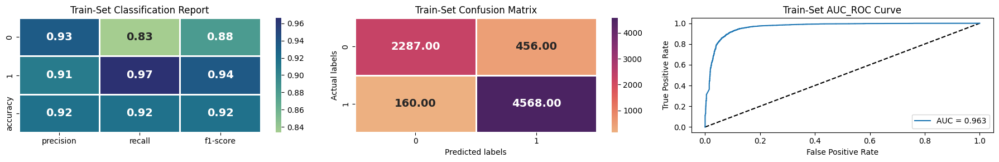

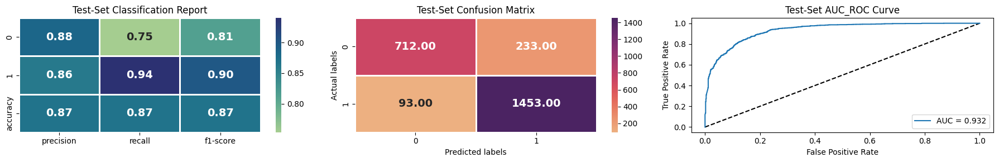

LogisticRegression(max_iter=20000, random_state=0)

time: 3.82 s (started: 2023-08-04 09:40:45 +00:00)


In [ ]:
# Importing LogisticRegression from sklearn
from sklearn.linear_model import LogisticRegression

# Fitting Logistic Regression Model and Visualizing evaluation Metric Score chart
logistic_classifier = LogisticRegression(fit_intercept=True, penalty='l2',max_iter=20000,random_state= 0)
analyse_model(logistic_classifier, x_tr, x_tst, y_tr, y_tst)

We have tried the very basic and least complex model used for binary classification i.e Logistic Regression. Since, our task is to predict the customer that have higher possibility to be infected in future so we have more emphasised on recall in our analysis (to maximise the recall we have to minimise the values of FN which are 93 in our case).
After implimenting this model we have achieved the recall of 0.96 on the train set and 0.94 on the test set along with auc-roc score of 93%  for test dataset and accuracy of 88%.

Out of 2491 customers which are in our test dataset our model is predicting 2191 customers correctly predicted and other 300 are wrongly predicted and we have to minimize the wrongly predicted (specially the ones who have the higher chances of infection)

We are getting good results but still it is the analysis of zamato restaurant so we have to push the limits harder in order to save maximum response and for this we have implimented various models and compared the various metrics.

##### Decision Tree

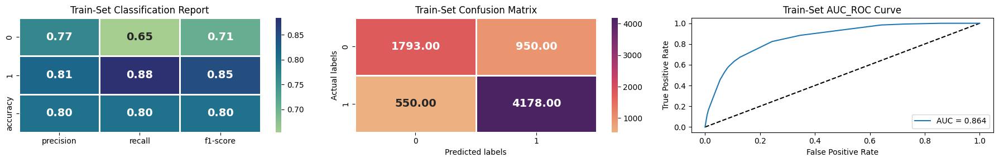

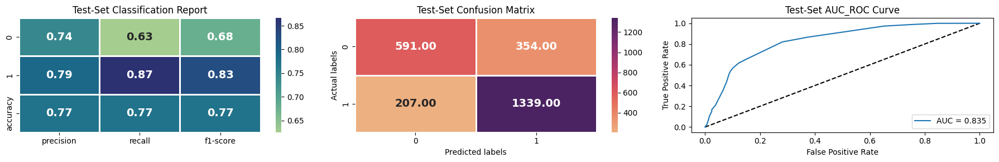

DecisionTreeClassifier(criterion='entropy', max_leaf_nodes=20, random_state=0)

time: 4.37 s (started: 2023-08-04 09:40:49 +00:00)


In [ ]:
# Visualizing evaluation Metric Score chart
from sklearn.tree import DecisionTreeClassifier

decision_tree_classifier = DecisionTreeClassifier(criterion='entropy', max_leaf_nodes=20, random_state=0)
analyse_model(decision_tree_classifier, x_tr, x_tst, y_tr, y_tst)

##### 2. Cross- Validation & Hyperparameter Tuning

The best parameters are: {'max_depth': 19, 'min_samples_leaf': 10, 'min_samples_split': 4}


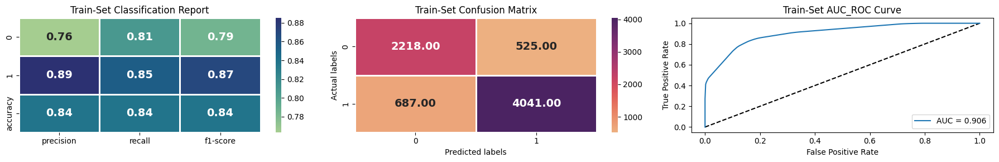

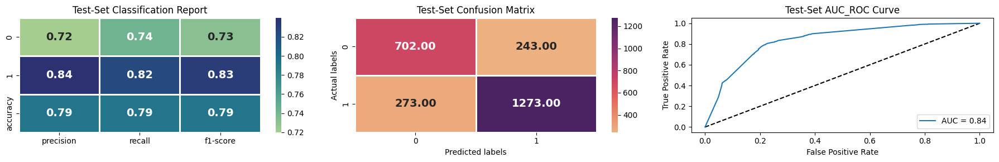

GridSearchCV(cv=3, estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': [14, 15, 16, 17, 18, 19, 20],
                         'min_samples_leaf': [3, 4, 5, 6, 7, 8, 9, 10],
                         'min_samples_split': [1, 2, 4]},
             scoring='neg_mean_squared_error')

time: 3min 5s (started: 2023-08-04 09:40:53 +00:00)


In [ ]:
# Import Liberary
from sklearn.model_selection import GridSearchCV

# Creating Ridge instance
decision_tree= DecisionTreeClassifier()

# Defining parameters
parameters_decision_tree = {'max_depth': [14,15,16,17,18,19,20], 'min_samples_leaf': [3,4,5,6,7,8,9,10], 'min_samples_split': [1,2,4]}

# Train the model
decision_tree_classifier = GridSearchCV(decision_tree, parameters_decision_tree, scoring='neg_mean_squared_error', cv=3)
analyse_model(decision_tree_classifier, x_tr, x_tst, y_tr, y_tst)

We have the options to use Decision tree as our base model but to get the significantly good results we have used the ensemble technique of Decision tree i.e the capability of minimizing the error by taking different trees with different subsets.

In decision tree classification we have got the recall of 0.80 for class 1 in test dataset and the auc-roc will be 82% this means that our model is actually bifurcating the either of the two categories of the target variable.

We have also observed the f1-score of 0.73 for class 0 and 0.83 for class 1 in test set that means we are actually maintaining the trade between the precision and recall.

##### Randomforest decision tree

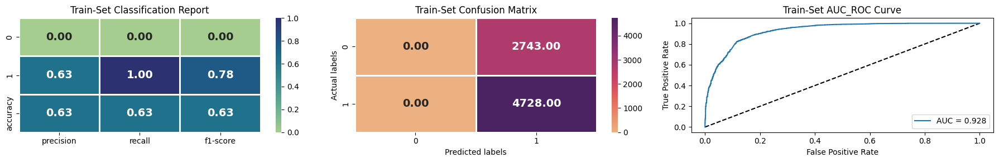

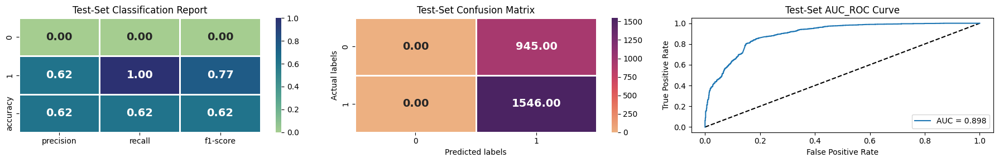

RandomForestClassifier(max_depth=3, n_estimators=500, n_jobs=-1, random_state=0)

time: 6.53 s (started: 2023-08-04 09:43:59 +00:00)


In [ ]:
# ML Model - 3 Implementation
# Importing RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

# Fitting RandomForestClassifier Model
random_forest_tree_classifier = RandomForestClassifier(n_estimators=500,max_depth=3,n_jobs=-1,random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(random_forest_tree_classifier,x_tr, x_tst, y_tr, y_tst)

###### 2. Cross- Validation & Hyperparameter Tuning

The best parameters are: {'max_depth': 10, 'n_estimators': 350}


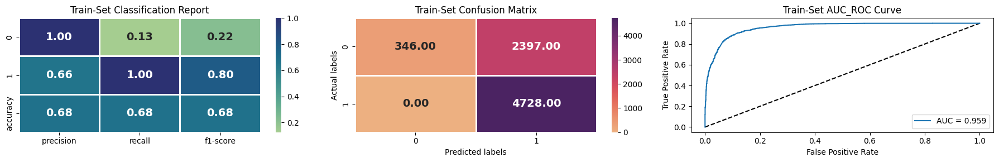

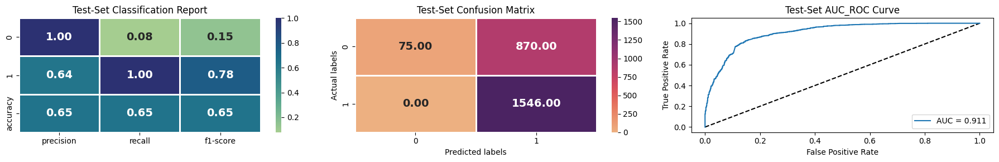

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=0),
             param_grid={'max_depth': [7, 8, 10],
                         'n_estimators': [150, 250, 300, 350]},
             scoring='roc_auc')

time: 3min 24s (started: 2023-08-04 09:44:06 +00:00)


In [ ]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import GridSearchCV

# Defining classifier instance
classifier= RandomForestClassifier(random_state=0)

# Defining parameters
grid_values = {'n_estimators':[150,250,300,350], 'max_depth':[7,8,10]}

# Fitting RandomForestClassifier Model with GridSearchCV
random_forest_grid_classifier = GridSearchCV(classifier, param_grid = grid_values, scoring = 'roc_auc', cv=5)

# Analysing the model
analyse_model(random_forest_grid_classifier, x_tr, x_tst, y_tr, y_tst)

We have the options to use Random Forest tree as our base model but to get the significantly good results we have used the ensemble technique of Random Forest tree i.e the capability of minimizing the error by taking different trees with different subsets.

In random forest tree classification we have got the recall of 0.80 for class 1 in test dataset and the auc-roc will be 82% this means that our model is actually bifurcating the either of the two categories of the target variable.

We have also observed the f1-score of 0.73 for class 0 and 0.83 for class 1 in test set that means we are actually maintaining the trade between the precision and recall.

##### XGBoost

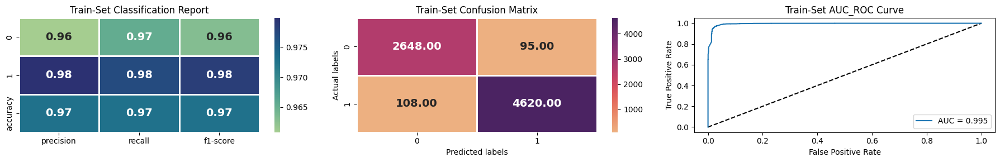

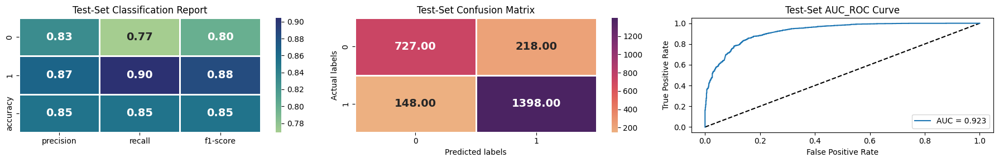

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=350, n_jobs=-1, num_parallel_tree=None,
              predictor=None, random_state=0, ...)

time: 32.9 s (started: 2023-08-04 09:47:30 +00:00)


In [ ]:
# Importing RandomForestClassifier
from xgboost import XGBClassifier

# Fitting XGBClassifier Model
XGB_classifier = XGBClassifier(n_estimators=350,max_depth=5,n_jobs=-1,random_state=0)

# Analysing the model and Visualizing evaluation Metric Score chart
analyse_model(XGB_classifier, x_tr, x_tst, y_tr, y_tst)

##### 2. Cross- Validation & Hyperparameter Tuning

The best parameters are: {'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 350}


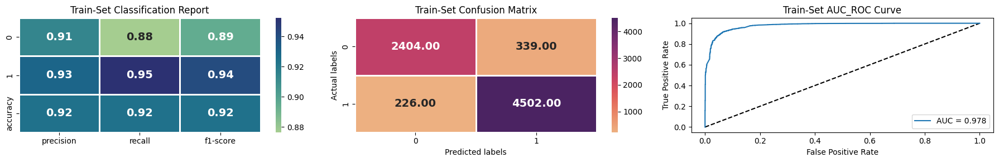

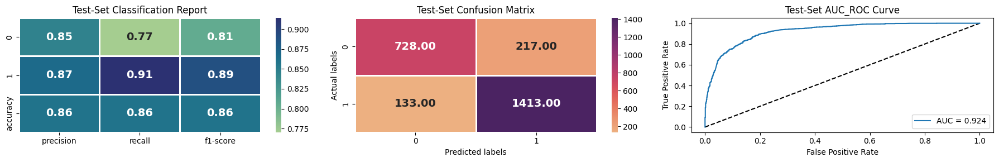

GridSearchCV(cv=3,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=0, ...),
             param_grid={'learning_rate': [0.01, 0.1, 1],
                         'max_depth': [2, 3, 4, 5],
                         'n_estimators': [250, 300, 350]},
             scoring='roc_auc')

time: 25min 49s (started: 2023-08-04 09:48:03 +00:00)


In [ ]:
# Importing GridSearchCV from sklearn
from sklearn.model_selection import GridSearchCV

# Defining classifier instance
classifier= XGBClassifier(random_state=0)

# Defining parameters
grid_values = {'learning_rate':[0.01, 0.1,1],'n_estimators':[250,300,350], 'max_depth':[2,3,4,5]}

# Fitting RandomForestClassifier Model with GridSearchCV
XGB_grid_classifier = GridSearchCV(classifier, param_grid = grid_values, scoring = 'roc_auc', cv=3)

# Analysing the model
analyse_model(XGB_grid_classifier, x_tr, x_tst, y_tr, y_tst)

We have the options to use XGBoost as our base model but to get the significantly good results we have used the ensemble technique of XGBoost i.e the capability of minimizing the error by taking different trees with different subsets.

In XGBoost classifier we have got the recall of 0.90 for class 1 in test dataset and the auc-roc will be 92% this means that our model is actually bifurcating the either of the two categories of the target variable.

We have also observed the f1-score of 0.81 for class 0 and 0.89 for class 1 in test set that means we are actually maintaining the trade between the precision and recall.

##### LightGBM

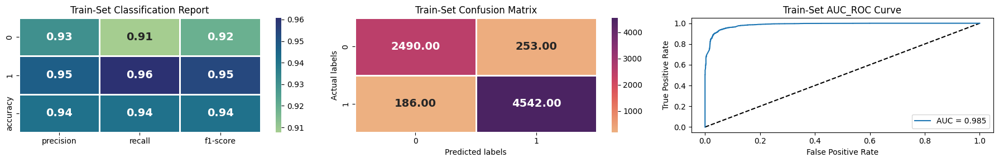

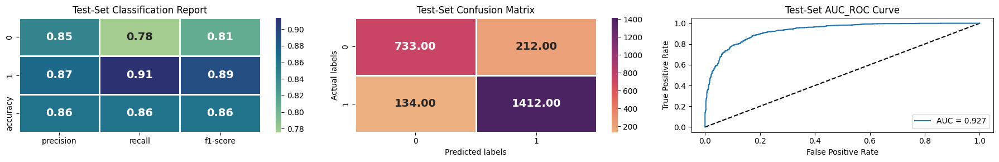

LGBMClassifier()

time: 10.3 s (started: 2023-08-04 10:13:53 +00:00)


In [ ]:
# Importing LightGBM
import lightgbm as lgb
LGBM_classifier = lgb.LGBMClassifier()
# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(LGBM_classifier, x_tr, x_tst, y_tr, y_tst)

##### 2. Cross- Validation & Hyperparameter Tuning

The best parameters are: {'learning_rate': 0.01, 'max_depth': 120, 'n_estimators': 600}


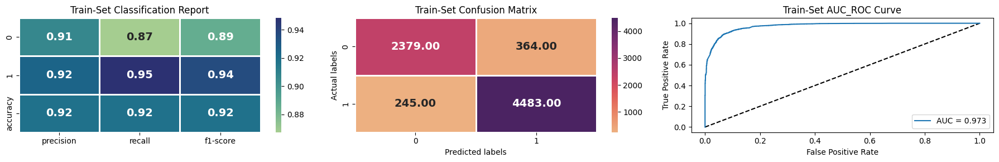

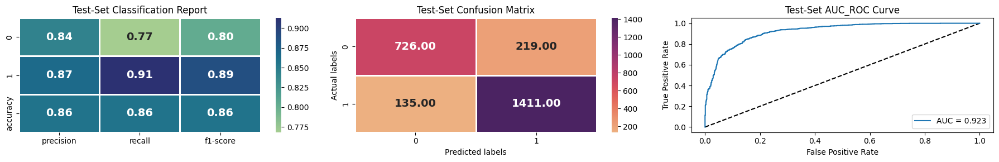

GridSearchCV(cv=3, estimator=LGBMClassifier(),
             param_grid={'learning_rate': [0.01, 0.1],
                         'max_depth': [120, 125, 150],
                         'n_estimators': [500, 600]},
             scoring='roc_auc')

time: 7min 52s (started: 2023-08-04 10:14:03 +00:00)


In [ ]:
# import ridge regression from sklearn library and RandomizedSearchCV
from sklearn.model_selection import RandomizedSearchCV

LGBM_classifier = lgb.LGBMClassifier()

# Defining parameters
parameters={"learning_rate":[0.01,0.1],"max_depth":[120,125,150],"n_estimators":[500,600]}
# Fitting RandomForestClassifier Model with GridSearchCV
LGBM_classifier = GridSearchCV(LGBM_classifier, param_grid = parameters, scoring = 'roc_auc', cv=3)

# Analysing the model Visualizing evaluation Metric Score chart
analyse_model(LGBM_classifier, x_tr, x_tst, y_tr, y_tst)

We have the options to use LightGBM as our base model but to get the significantly good results we have used the ensemble technique of LightGBM i.e the capability of minimizing the error by taking different trees with different subsets.

In LightGBM classifier we have got the recall of 0.90 for class 1 in test dataset and the auc-roc will be 92% this means that our model is actually bifurcating the either of the two categories of the target variable.

We have also observed the f1-score of 0.81 for class 0 and 0.89 for class 1 in test set that means we are actually maintaining the trade between the precision and recall.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [ ]:
# Storing different regression metrics in order to make dataframe and compare them
models = ['Logistic_classification','Decision_Tree','Random_Forest_tree','XGboost','LightGBM']
Precision = [0.88, 0.86, 0.66, 0.88, 0.88]
Recall = [0.94, 0.80, 1.00, 0.90, 0.90]
F1_Score= [0.91, 0.87, 0.80, 0.89, 0.89]
Accuracy = [0.88, 0.84, 0.67, 0.86, 0.86]
AUCROC = [0.93, 0.82, 0.90, 0.92, 0.92]

# Create dataframe from the lists
data = {'Models': models,
        'Precision': Precision,
        'Recall': Recall,
        'F1_Score': F1_Score,
        'Accuracy': Accuracy,
        'AUCROC': AUCROC,
       }
metric_df = pd.DataFrame(data)

# Printing dataframe
metric_df

,Models,Precision,Recall,F1_Score,Accuracy,AUCROC
0,Logistic_classification,0.88,0.94,0.91,0.88,0.93
1,Decision_Tree,0.86,0.80,0.87,0.84,0.82
2,Random_Forest_tree,0.66,1.00,0.80,0.67,0.90
3,XGboost,0.88,0.90,0.89,0.86,0.92
4,LightGBM,0.88,0.90,0.89,0.86,0.92


time: 21.5 ms (started: 2023-08-04 10:21:56 +00:00)


#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

I have used these metrices for evaluation of the model and their impact on business are as follows:

Accuracy: This metric indicates the percentage of correctly classified instances out of the total number of instances. In a business setting, this would indicate the overall effectiveness of the model in making correct predictions. A high accuracy score would have a positive impact on the business, as it would indicate a high level of confidence in the model's predictions.

Precision: This metric indicates the proportion of true positive predictions out of all positive predictions made by the model. In a business setting, this would indicate the level of confidence in the model's ability to identify positive instances correctly. A high precision score would have a positive impact on the business, as it would indicate that the model is not making false positive predictions.

Recall: This metric indicates the proportion of true positive predictions out of all actual positive instances. In a business setting, this would indicate the model's ability to identify all positive instances. A high recall score would have a positive impact on the business, as it would indicate that the model is not missing any positive instances.

F1 Score: This metric is a combination of precision and recall and is used to balance the trade-off between the two. In a business setting, this would indicate the overall effectiveness of the model in making correct predictions while also avoiding false positives and false negatives. A high F1 score would have a positive impact on the business, as it would indicate that the model is making accurate predictions while also being able to identify all positive instances.

ROC AUC: This metric indicates the ability of the model to distinguish between positive and negative instances. In a business setting, this would indicate the model's ability to correctly classify instances as positive or negative. A high ROC AUC score would have a positive impact on the business, as it would indicate that the model is able to correctly classify instances.

The XgBoost Classifier can be considered as an efficient model for the business, especially when it achieves high scores in all of these evaluation metrics, which would indicate that it can accurately predict outcomes, identify all positive instances, and correctly classify instances as positive or negative.

### ML Model - 3

##### Recommendation based on user profile and restaurant genre

In [ ]:
#creating variable that contain restaurant cuisine details
restaurant_df = cluster_dummy.copy()
restaurant_df = restaurant_df.reset_index()
restaurant_df = restaurant_df.drop(columns = ['Cost',	'Average_Rating',	'Total_Cuisine_Count','label'], axis =1)
restaurant_df.head()

,Restaurant,American,Andhra,Arabian,Asian,BBQ,Bakery,Beverages,Biryani,Burger,...,North Indian,Pizza,Salad,Seafood,South Indian,Spanish,Street Food,Sushi,Thai,Wraps
0,Beyond Flavours,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
1,Paradise,0,0,0,0,0,0,0,1,0,...,1,0,0,0,0,0,0,0,0,0
2,Flechazo,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
3,Shah Ghouse Hotel & Restaurant,0,0,0,0,0,0,1,1,0,...,1,0,0,1,0,0,0,0,0,0
4,Over The Moon Brew Company,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


time: 29.1 ms (started: 2023-08-04 10:21:56 +00:00)


In [ ]:
#shape
restaurant_df.shape

(100, 45)

time: 3.1 ms (started: 2023-08-04 10:21:56 +00:00)


In [ ]:
#restaurant matrix
rest_genre = restaurant_df.loc[:, restaurant_df.columns != 'Restaurant']
rest_matrix = rest_genre.values
rest_matrix

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

time: 5.28 ms (started: 2023-08-04 10:21:56 +00:00)


In [ ]:
#matrix shape
rest_matrix.shape

(100, 44)

time: 3.3 ms (started: 2023-08-04 10:21:56 +00:00)


In [ ]:
#creating user or reviewer profile
user_df = sentiment_df[['Reviewer',	'Restaurant',	'Rating']].copy()
user_df.head()

,Reviewer,Restaurant,Rating
0,Rusha Chakraborty,Beyond Flavours,5.0
1,Anusha Tirumalaneedi,Beyond Flavours,5.0
2,Ashok Shekhawat,Beyond Flavours,5.0
3,Swapnil Sarkar,Beyond Flavours,5.0
4,Dileep,Beyond Flavours,5.0


time: 14 ms (started: 2023-08-04 10:21:56 +00:00)


In [ ]:
#shape
user_df.shape

(9962, 3)

time: 3.02 ms (started: 2023-08-04 10:21:56 +00:00)


In [ ]:
# grouping the data by the 'user' column
grouped_data = user_df.groupby('Reviewer')

# defining a function to create the new dataframe
def create_new_column(data):
    return [{'Restaurant': row['Restaurant'], 'Rating': row['Rating']} for _, row in data.iterrows()]
    #variable _ is used to store the index value, which is not used in the loop

# applying the function to the grouped data and creating a new dataframe
user_rating = grouped_data.apply(create_new_column)
user_rating = user_rating.reset_index().rename(columns ={0:'Rated_Restaurant'})
user_rating.head()

,Reviewer,Rated_Restaurant
0,0,"[{'Restaurant': 0, 'Rating': 0.0}]"
1,#FOODPORN,[{'Restaurant': 'Zega - Sheraton Hyderabad Hot...
2,#chloesviews // CAH,"[{'Restaurant': 'eat.fit', 'Rating': 5.0}]"
3,$ign,"[{'Restaurant': 'SKYHY', 'Rating': 4.0}]"
4,4mybanti,"[{'Restaurant': 'Ulavacharu', 'Rating': 2.0}]"


time: 1.49 s (started: 2023-08-04 10:21:56 +00:00)


In [ ]:
#shape
user_rating.shape

(7447, 2)

time: 6.03 ms (started: 2023-08-04 10:21:58 +00:00)


In [ ]:
#iterating over user rating df such that it end up making an array which had same shape as restaurant df
user_rated_restaurant = {}
for index, row in user_rating.iterrows():
    user_rated_restaurant[row['Reviewer']] = {}
    for i in range(len(row['Rated_Restaurant'])):
        user_rated_restaurant[row['Reviewer']][row['Rated_Restaurant'][i][
            'Restaurant']] = row['Rated_Restaurant'][i]['Rating']

# creating an empty user preference vector for each user
user_preference_vector = pd.DataFrame(np.zeros((len(user_rating), len(restaurant_df))),
                      columns=restaurant_df.Restaurant, index=user_rating['Reviewer'])

# Iterate through the user rating dataframe
for index, row in user_rating.iterrows():
    for i in range(len(row['Rated_Restaurant'])):
        restaurant = row['Rated_Restaurant'][i]['Restaurant']
        rating = row['Rated_Restaurant'][i]['Rating']
        user_preference_vector.loc[row['Reviewer'], restaurant] = rating

#reset index
user_preference_vector = user_preference_vector.reset_index()

time: 4.94 s (started: 2023-08-04 10:21:58 +00:00)


In [ ]:
#getting output
user_preference_vector.sample(5)

Restaurant,Reviewer,Beyond Flavours,Paradise,Flechazo,Shah Ghouse Hotel & Restaurant,Over The Moon Brew Company,The Fisherman's Wharf,eat.fit,Shah Ghouse Spl Shawarma,Hyper Local,...,Cascade - Radisson Hyderabad Hitec City,Collage - Hyatt Hyderabad Gachibowli,Zing's Northeast Kitchen,Dunkin' Donuts,Desi Bytes,Hyderabadi Daawat,Zega - Sheraton Hyderabad Hotel,Triptify,Chinese Pavilion,0
6601,Swaraj Singh Chauhan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
6244,Srinivas Pamarthi,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
429,Aman Singhal,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
2355,Jenson Jose,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN
800,Aprajita Kashyap,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN


time: 52.1 ms (started: 2023-08-04 10:22:03 +00:00)


In [ ]:
# Drop the column 0 whose contains tha null value
user_preference_vector.drop(columns = 0, inplace = True)

time: 8.26 ms (started: 2023-08-04 10:22:03 +00:00)


In [ ]:
#getting output
user_preference_vector.sample(5)

Restaurant,Reviewer,Beyond Flavours,Paradise,Flechazo,Shah Ghouse Hotel & Restaurant,Over The Moon Brew Company,The Fisherman's Wharf,eat.fit,Shah Ghouse Spl Shawarma,Hyper Local,...,Arena Eleven,Cascade - Radisson Hyderabad Hitec City,Collage - Hyatt Hyderabad Gachibowli,Zing's Northeast Kitchen,Dunkin' Donuts,Desi Bytes,Hyderabadi Daawat,Zega - Sheraton Hyderabad Hotel,Triptify,Chinese Pavilion
688,Anoop Prakash,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5267,Samrat Basani,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0
3365,Mrinalini,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
578,Anila Sai,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5734,Shiva Varma,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


time: 49.5 ms (started: 2023-08-04 10:22:03 +00:00)


In [ ]:
#using dot multiplication to find score or weight for each reviewer
result_df = pd.DataFrame(columns = rest_genre.columns)
for index, row in user_preference_vector.iterrows():
    user_preference_vector_array = row[1:].values.reshape(1,-1)
    dot_product = np.dot(user_preference_vector_array, rest_matrix)
    result_df = result_df.append(pd.DataFrame(dot_product, columns = rest_genre.columns, index = [row['Reviewer']]))

result_df = result_df.reset_index().rename(columns ={'index':'Reviewer'})

time: 35.7 s (started: 2023-08-04 10:22:03 +00:00)


In [ ]:
#getting output
result_df

,Reviewer,American,Andhra,Arabian,Asian,BBQ,Bakery,Beverages,Biryani,Burger,...,North Indian,Pizza,Salad,Seafood,South Indian,Spanish,Street Food,Sushi,Thai,Wraps
0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,#FOODPORN,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0,0.0
2,#chloesviews // CAH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5.0,0.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0
3,$ign,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4mybanti,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7442,ಅಭಿಷೇಕ್ ಉಪಾಧ್ಯ,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7443,ᴀɴ.ᴏᴛʜᴇʀ.sᴇɴ,0.0,2.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,...,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7444,✌️✌️Reddy 🥂🍽️,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.0,0.0,4.0,0.0,0.0,0.0,0.0,4.0,0.0,0.0
7445,✔️ Sonu,0.0,0.0,0.0,0.0,0.0,0.0,5.0,5.0,0.0,...,5.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0


time: 36.4 ms (started: 2023-08-04 10:22:38 +00:00)


In [ ]:
#creating test user
test_user_ids = user_rating.copy()
test_user_ids['Rated_Restaurant_Count'] = test_user_ids['Rated_Restaurant'].apply(lambda x: len(x))

#taking 1000 user who atleast rating 2 restaurant as they show repeatition
test_user_ids = test_user_ids.sort_values('Rated_Restaurant_Count', ascending = False)[:1000]
test_user_ids.head()

,Reviewer,Rated_Restaurant,Rated_Restaurant_Count
3859,Parijat Ray,"[{'Restaurant': 'Hyper Local', 'Rating': 4.0},...",13
656,Ankita,"[{'Restaurant': 'Hyper Local', 'Rating': 4.0},...",13
2655,Kiran,[{'Restaurant': 'Shah Ghouse Hotel & Restauran...,12
7014,Vedant Killa,"[{'Restaurant': 'Barbeque Nation', 'Rating': 5...",11
2314,Jay Mehta,"[{'Restaurant': 'NorFest - The Dhaba', 'Rating...",11


time: 44.6 ms (started: 2023-08-04 10:22:39 +00:00)


In [ ]:
#creating list for all reviewer in test ids
test_user_ids = test_user_ids['Reviewer'].to_list()
print(f"Total numbers of test users {len(test_user_ids)}")

Total numbers of test users 1000
time: 1.87 ms (started: 2023-08-04 10:22:39 +00:00)


In [ ]:
#test user profile
test_user_profile = result_df[result_df['Reviewer']=='Ankita']
test_user_profile

,Reviewer,American,Andhra,Arabian,Asian,BBQ,Bakery,Beverages,Biryani,Burger,...,North Indian,Pizza,Salad,Seafood,South Indian,Spanish,Street Food,Sushi,Thai,Wraps
656,Ankita,12.0,12.0,0.0,0.0,0.0,4.0,0.0,8.0,0.0,...,36.0,0.0,4.0,0.0,13.0,0.0,0.0,4.0,0.0,4.0


time: 28 ms (started: 2023-08-04 10:22:39 +00:00)


In [ ]:
# Now let's get the test user vector by excluding the `user` column
test_user_vector = test_user_profile.iloc[0, 1:].values
test_user_vector

array([12.0, 12.0, 0.0, 0.0, 0.0, 4.0, 0.0, 8.0, 0.0, 0.0, 26.0, 12.0,
       8.0, 0.0, 4.0, 4.0, 0.0, 0.0, 3.0, 0.0, 0.0, 8.0, 4.0, 0.0, 4.0,
       0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 36.0, 0.0, 4.0, 0.0,
       13.0, 0.0, 0.0, 4.0, 0.0, 4.0], dtype=object)

time: 3.94 ms (started: 2023-08-04 10:22:39 +00:00)


In [ ]:
#let test reviewer or user be 'Ankita'
liked_restaurant = user_df[user_df['Reviewer'] == 'Ankita']['Restaurant'].to_list()
liked_restaurant = set(liked_restaurant)
liked_restaurant

{'Absolute Sizzlers',
 'Arena Eleven',
 'Banana Leaf Multicuisine Restaurant',
 'Hyper Local',
 "Jonathan's Kitchen - Holiday Inn Express & Suites",
 'KS Bakers',
 'Kritunga Restaurant',
 'SKYHY',
 'The Foodie Monster Kitchen',
 'The Lal Street - Bar Exchange',
 'Triptify',
 "Udipi's Upahar",
 'Ulavacharu'}

time: 6.45 ms (started: 2023-08-04 10:22:39 +00:00)


In [ ]:
#getting values for all restaurant
all_restaurant = set(restaurant_df['Restaurant'].values)

time: 743 µs (started: 2023-08-04 10:22:39 +00:00)


In [ ]:
#getting unknown restaurants
unknown_restaurant = all_restaurant.difference(liked_restaurant)

time: 541 µs (started: 2023-08-04 10:22:39 +00:00)


In [ ]:
#getting unknown restaurant genre
unknown_restaurant_genres = restaurant_df[restaurant_df['Restaurant'].isin(unknown_restaurant)]
#getting the restaurant matrix by excluding `Restaurant' columns:
restaurant_matrix = unknown_restaurant_genres.iloc[:, 1:].values
restaurant_matrix

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 1, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

time: 6.73 ms (started: 2023-08-04 10:22:39 +00:00)


In [ ]:
#recommendation score
score = np.dot(restaurant_matrix[1], test_user_vector)
print(score)
print('\n')

70.0


time: 3.33 ms (started: 2023-08-04 10:22:39 +00:00)


In [ ]:
# Only keep the score larger than the recommendation threshold
# The threshold can be fine-tuned to adjust the size of generated recommendations
score_threshold = 10.0
# score_threshold = 20.0
res_dict = {}

time: 542 µs (started: 2023-08-04 10:22:39 +00:00)


In [ ]:
def generate_recommendation_scores():
    users = []
    restaurant = []
    scores = []
    for user_id in test_user_ids:
        test_user_profile = result_df[result_df['Reviewer'] == user_id]
        # get user vector for the current user id
        test_user_vector = test_user_profile.iloc[0, 1:].values


        # get the unknown restaurant ids for the current user id
        liked_restaurant = user_df[user_df['Reviewer'] == user_id]['Restaurant'].to_list()
        all_restaurant = set(restaurant_df['Restaurant'].values)
        unknown_restautant = all_restaurant.difference(liked_restaurant)
        unknown_restaurant_genres = restaurant_df[restaurant_df['Restaurant'].isin(unknown_restaurant)]
        unknown_restaurant_ids = unknown_restaurant_genres.iloc[:, :1].values

        # user np.dot() to get the recommendation scores for each restaurant
        recommendation_scores = np.dot(unknown_restaurant_genres.iloc[:, 1:].values, test_user_vector)

        # Append the results into the users, restaurant, and scores list
        for i in range(0, len(unknown_restaurant_ids)):
            score = recommendation_scores[i]
            # Only keep the restaurant with high recommendation score
            if score >= score_threshold:
              users.append(user_id)
              restaurant.append(unknown_restaurant_ids[i])
              scores.append(recommendation_scores[i])

    return users, restaurant, scores

time: 1.4 ms (started: 2023-08-04 10:22:39 +00:00)


In [ ]:
# Return users, courses, and scores lists for the dataframe
users, restaurant, scores = generate_recommendation_scores()
res_dict['User'] = users
res_dict['Restaurant'] = restaurant
res_dict['Score'] = scores
res_df = pd.DataFrame(res_dict, columns=['User', 'Restaurant', 'Score'])
res_df['Restaurant'] = res_df['Restaurant'].apply(lambda x: str(x[0]))
res_df

,User,Restaurant,Score
0,Parijat Ray,Beyond Flavours,60.0
1,Parijat Ray,Paradise,44.0
2,Parijat Ray,Flechazo,32.5
3,Parijat Ray,Shah Ghouse Hotel & Restaurant,44.0
4,Parijat Ray,Over The Moon Brew Company,49.0
...,...,...,...
28081,Imteja7,Al Saba Restaurant,15.0
28082,Imteja7,T Grill,15.0
28083,Imteja7,Cascade - Radisson Hyderabad Hitec City,25.0
28084,Imteja7,Collage - Hyatt Hyderabad Gachibowli,30.0


time: 3.2 s (started: 2023-08-04 10:22:39 +00:00)


In [ ]:
#most recommended restaurant
recom_rest = res_df.groupby('Restaurant')['User'].count().reset_index().sort_values('User', ascending = False)
recom_rest[:10]

,Restaurant,User
19,Collage - Hyatt Hyderabad Gachibowli,692
57,Over The Moon Brew Company,672
63,PourHouse7,666
13,Beyond Flavours,663
56,Olive Garden,635
0,10 Downing Street,617
54,Mustang Terrace Lounge,598
70,Squeeze @ The Lime,598
67,Shah Ghouse Hotel & Restaurant,575
69,Shree Santosh Dhaba Family Restaurant,574


time: 18.2 ms (started: 2023-08-04 10:22:42 +00:00)


In [ ]:
#least recommended restaurant
recom_rest[-10:]

,Restaurant,User
34,GD's,33
15,Cafe Eclat,31
26,Domino's Pizza,19
8,Asian Meal Box,13
39,Hunger Maggi Point,12
84,Zing's Northeast Kitchen,11
9,B-Dubs,6
52,Mohammedia Shawarma,3
78,The Old Madras Baking Company,2
53,Momos Delight,1


time: 11.2 ms (started: 2023-08-04 10:22:42 +00:00)


In [ ]:
# grouping the data by the 'user' column
grouped_data = res_df.groupby('User')

# defining a function to create the new dataframe
def create_new_column(data):
    return [{'Restaurant': row['Restaurant'], 'Score': row['Score']} for _, row in data.iterrows()]
    #variable _ is used to store the index value, which is not used in the loop

# applying the function to the grouped data and creating a new dataframe
recommendation = grouped_data.apply(create_new_column)
recommendation = recommendation.reset_index().rename(columns ={0:'Recommended_Restaurant'})
recommendation.head()

,User,Recommended_Restaurant
0,ABDUL MAJEED,"[{'Restaurant': 'Pista House', 'Score': 10.0},..."
1,AJ,"[{'Restaurant': 'Flechazo', 'Score': 17.0}, {'..."
2,ASH&B2,"[{'Restaurant': 'Beyond Flavours', 'Score': 18..."
3,Aamir Nawaz,"[{'Restaurant': 'Beyond Flavours', 'Score': 11..."
4,Aanchal Khemka,"[{'Restaurant': 'Beyond Flavours', 'Score': 18..."


time: 1.6 s (started: 2023-08-04 10:22:42 +00:00)


In [ ]:
#creating column for total recommendation count for each user
recommendation['Total_Recommendation'] = recommendation['Recommended_Restaurant'].apply(
    lambda x: len(x))

#top 10 user who get most recommendation
recommendation.sort_values('Total_Recommendation', ascending= False)[:10]

,User,Recommended_Restaurant,Total_Recommendation
59,Anusha Sinha,"[{'Restaurant': 'Beyond Flavours', 'Score': 50...",72
319,Kiran,"[{'Restaurant': 'Beyond Flavours', 'Score': 42...",71
424,Nillu,"[{'Restaurant': 'Beyond Flavours', 'Score': 38...",71
33,Aman Agarwal,"[{'Restaurant': 'Beyond Flavours', 'Score': 35...",69
51,Ankita,"[{'Restaurant': 'Beyond Flavours', 'Score': 91...",69
734,Siva Kumar,"[{'Restaurant': 'Beyond Flavours', 'Score': 46...",69
763,Sravani,"[{'Restaurant': 'Beyond Flavours', 'Score': 57...",68
393,Namit Agarwal,"[{'Restaurant': 'Beyond Flavours', 'Score': 25...",68
476,Prachita Jayaswal,"[{'Restaurant': 'Beyond Flavours', 'Score': 38...",67
450,Parijat Ray,"[{'Restaurant': 'Beyond Flavours', 'Score': 60...",67


time: 189 ms (started: 2023-08-04 10:22:44 +00:00)


In [ ]:
# creating new dataframe for recommendation for test user
for i in recommendation[recommendation['User']=='Ankita']['Recommended_Restaurant']:
    # creating the dataframe
    vis = pd.DataFrame(i, columns = ['Restaurant', 'Score'])
vis.sort_values('Score', ascending = False)

,Restaurant,Score
0,Beyond Flavours,91.0
31,Owm Nom Nom,82.0
56,Olive Garden,82.0
64,Collage - Hyatt Hyderabad Gachibowli,82.0
40,PourHouse7,82.0
...,...,...
60,GD's,12.0
51,Labonel,12.0
65,Dunkin' Donuts,12.0
29,Karachi Cafe,12.0


time: 19.4 ms (started: 2023-08-04 10:22:44 +00:00)


#####Recommendation based on Restaurant Similarity on Reviews

Calculating similarity based recommendations using reviews can be a valid approach, but it is important to ensure that the reviews used are reliable and unbiased, and that the similarity calculation algorithm is appropriate for the task.

Reviews can provide valuable information about the characteristics and quality of products or services, and this information can be used to identify similar items.

In [ ]:
#bag of word with doc index as these index will be used for finding similarity later
bows_df

,doc_index,doc_id,token,bow
0,0,Beyond Flavours,also,1
1,0,Beyond Flavours,ambience,1
2,0,Beyond Flavours,brunch,1
3,0,Beyond Flavours,chill,1
4,0,Beyond Flavours,cost,1
...,...,...,...,...
232293,9961,Chinese Pavilion,tax,1
232294,9961,Chinese Pavilion,kimchi,1
232295,9961,Chinese Pavilion,an,1
232296,9961,Chinese Pavilion,luncheon,2


time: 12.7 ms (started: 2023-08-04 10:22:44 +00:00)


In [ ]:
#using extracted bag of words
bow_df = bows_df.drop(columns = ['doc_index'], axis =1)
bow_df

,doc_id,token,bow
0,Beyond Flavours,also,1
1,Beyond Flavours,ambience,1
2,Beyond Flavours,brunch,1
3,Beyond Flavours,chill,1
4,Beyond Flavours,cost,1
...,...,...,...
232293,Chinese Pavilion,tax,1
232294,Chinese Pavilion,kimchi,1
232295,Chinese Pavilion,an,1
232296,Chinese Pavilion,luncheon,2


time: 22.1 ms (started: 2023-08-04 10:22:44 +00:00)


In [ ]:
#Restaurant and review
rest_review = sentiment_df[['Restaurant','Review']].copy()
rest_review

,Restaurant,Review
0,Beyond Flavours,"[ambience, good, food, quite, good, saturday, ..."
1,Beyond Flavours,"[ambience, good, pleasant, evening, service, p..."
2,Beyond Flavours,"[must, try, great, food, great, ambience, thnx..."
3,Beyond Flavours,"[soumen, da, arun, great, guy, behavior, since..."
4,Beyond Flavours,"[food, goodwe, ordered, kodi, drumstick, baske..."
...,...,...
9957,Chinese Pavilion,"[madhumathi, mahajan, well, start, nice, court..."
9958,Chinese Pavilion,"[place, never, disappointed, u, food, courteou..."
9959,Chinese Pavilion,"[bad, rating, mainly, chicken, bone, found, ve..."
9960,Chinese Pavilion,"[personally, love, prefer, chinese, food, coup..."


time: 24.8 ms (started: 2023-08-04 10:22:44 +00:00)


In [ ]:
#bag of words for restaurant 'Asian Meal Box'
rest_bow = bow_df[bow_df['doc_id'] == 'Asian Meal Box']
rest_bow.head(10)

,doc_id,token,bow
125518,Asian Meal Box,also,1
125519,Asian Meal Box,good,2
125520,Asian Meal Box,overall,1
125521,Asian Meal Box,spicy,2
125522,Asian Meal Box,even,1
125523,Asian Meal Box,taste,1
125524,Asian Meal Box,option,1
125525,Asian Meal Box,much,1
125526,Asian Meal Box,soft,1
125527,Asian Meal Box,noodle,1


time: 42.3 ms (started: 2023-08-04 10:22:44 +00:00)


In [ ]:
#converting bow to horizontal format using pivot
rest_bowT = rest_bow.pivot_table(index=['doc_id'], columns=['token'],aggfunc='sum').reset_index(level=[0])
rest_bowT

doc_id    bow                                              \
token                 absent absolutely across action actually add added   
0      Asian Meal Box      1          3      1      1        1   1     1   

                            ...                                              \
token addictivethis adjust  ... worst worstthe worth would wow year yes yum   
0                 1      1  ...     8        1     2     9   2    3   1   1   

                 
token zomato  😃  
0          5  1  

[1 rows x 698 columns]

time: 35.1 ms (started: 2023-08-04 10:22:44 +00:00)


In [ ]:
#using union set to compare two restaurant set of tokens
def pivot_of_two_bows(basedoc, comparedoc):
    base = basedoc.copy()
    base['type'] = 'base'
    compare = comparedoc.copy()
    compare['type'] = 'compare'
    # append the two token sets vertically
    join = base.append(compare)
    # pivot the two joined courses
    joinT = join.pivot_table(index=['doc_id', 'type'], columns='token',aggfunc='sum').fillna(0).reset_index(level=[0, 1])
    # assign columns
    joinT.columns = ['doc_id', 'type'] + [t[1] for t in joinT.columns][2:]
    return joinT

time: 1.15 ms (started: 2023-08-04 10:22:44 +00:00)


In [ ]:
#creating two test restaurant
rest1 = bow_df[bow_df['doc_id'] == 'Asian Meal Box']
rest2 = bow_df[bow_df['doc_id'] == 'Biryanis And More']

time: 56.9 ms (started: 2023-08-04 10:22:44 +00:00)


In [ ]:
# compare the restaurat1 and restaurant2
bow_vectors = pivot_of_two_bows(rest1, rest2)
bow_vectors

,doc_id,type,absent,absolutely,accessible,across,action,actual,actually,add,...,👌🏻,👍🏻,😀😀😀😀😀😀😀😀,😂,😂the,😃,😍,😍😍,😕,😪😪😪😪
0,Asian Meal Box,base,1.0,3.0,0.0,1.0,1.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,Biryanis And More,compare,0.0,3.0,1.0,1.0,0.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,0.0,4.0,1.0,1.0,1.0


time: 49 ms (started: 2023-08-04 10:22:44 +00:00)


In [ ]:
from scipy.spatial.distance import cosine
#calculating similarity between two restaurant
similarity = 1 - cosine(bow_vectors.iloc[0, 2:], bow_vectors.iloc[1, 2:])

similarity

0.5338412612763059

time: 9.68 ms (started: 2023-08-04 10:22:44 +00:00)


In [ ]:
#creating function for mapping
# Create restaurant id to index and index to id mappings
def get_doc_dicts(bow_df):
    grouped_df = bow_df.groupby(['doc_id']).max().reset_index(drop=False)
    idx_id_dict = grouped_df[['doc_id']].to_dict()['doc_id']
    id_idx_dict = {v: k for k, v in idx_id_dict.items()}
    del grouped_df
    return idx_id_dict, id_idx_dict

time: 1.11 ms (started: 2023-08-04 10:22:44 +00:00)


In [ ]:
#two test subject
rest1 = rest_review[rest_review['Restaurant'] == "Beyond Flavours"]
rest2 = rest_review[rest_review['Restaurant'] == "Paradise"]

time: 5.84 ms (started: 2023-08-04 10:22:44 +00:00)


In [ ]:
#with restaurant name finding index for similarity
idx_id_dict, id_idx_dict = get_doc_dicts(bows_df)
idx1 = id_idx_dict["Beyond Flavours"]
idx2 = id_idx_dict["Paradise"]
print(f"Restaurant 1's index is {idx1} and Restaurant 2's index is {idx2}")

Restaurant 1's index is 16 and Restaurant 2's index is 67
time: 82.8 ms (started: 2023-08-04 10:22:44 +00:00)


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
#creating function to calculate cosine similarity such that matrix can be made for each restaurant similarity

# Get the list of all restaurant
all_restaurant = rest_review['Restaurant'].unique()

# Initialize the dataframe to store the similarities
df_similarities = pd.DataFrame(columns = all_restaurant, index = all_restaurant)
# Iterate over the rows and columns of the dataframe
for i in all_restaurant:
    for j in all_restaurant:
        # Get the BoW representation of the current row and column restaurant
        #creating two test restaurant
        rest1 = bow_df[bow_df['doc_id'] == i]
        rest2 = bow_df[bow_df['doc_id'] == j]
        bow_vectors = pivot_of_two_bows(rest1, rest2)
        # Calculate the cosine similarity between the two restaurant' BoW representations
        sim = 1 - cosine(bow_vectors.iloc[0, 2:], bow_vectors.iloc[1, 2:])
        # Assign the similarity score to the corresponding cell of the dataframe
        df_similarities.at[i, j] = sim

InvalidIndexError: ignored

time: 439 ms (started: 2023-08-04 11:22:49 +00:00)


In [ ]:
#locating in the similarti df
sim_matrix = df_similarities.to_numpy()

#similarity between the two restaurant
sim = sim_matrix[idx1][idx2]
sim

nan

time: 4.05 ms (started: 2023-08-04 11:13:38 +00:00)


In [ ]:
#function to recommend restaurant based on similarity
def generate_recommendations_for_one_user(liked_restaurant, unknown_restaurant, id_idx_dict, sim_matrix):
    # Create a dictionary to store your recommendation results
    res = {}
    threshold = 0.6
    for liked_rest in liked_restaurant:
        for unselect_rest in unknown_restaurant:
            if liked_rest in id_idx_dict and unselect_rest in id_idx_dict:
                sim = 0
                idx1 = id_idx_dict[liked_rest]
                idx2 = id_idx_dict[unselect_rest]

                # Find the similarity value from the sim_matrix
                sim = sim_matrix[idx1][idx2]
                if sim > threshold:
                    if unselect_rest not in res:
                        res[unselect_rest] = sim
                    else:
                        if sim >= res[unselect_rest]:
                            res[unselect_rest] = sim

    # Sort the results by similarity
    res = {k: v for k, v in sorted(res.items(), key=lambda item: item[1], reverse=True)}
    return res

time: 1.39 ms (started: 2023-08-04 11:13:40 +00:00)


In [ ]:
#function to calculate recommendation for all Reviewer
def generate_recommendations_for_all():
    users = []
    restaurant = []
    sim_scores = []
    idx_id_dict, id_idx_dict = get_doc_dicts(bows_df)
    sim_matrix = df_similarities.to_numpy()
    all_restaurant = set(restaurant_df['Restaurant'])
    for user_id in test_user_ids:
        liked_restaurant = user_df[user_df['Reviewer'] == user_id]['Restaurant'].to_list()
        unknown_restaurant = all_restaurant.difference(liked_restaurant)
        rec = generate_recommendations_for_one_user(liked_restaurant, unknown_restaurant, id_idx_dict, sim_matrix)
        for k, v in rec.items():
            users.append(user_id)
            restaurant.append(k)
            sim_scores.append(v)

    return users, restaurant, sim_scores

time: 1.17 ms (started: 2023-08-04 11:13:46 +00:00)


In [ ]:
#storing recommendation for each user in dataframe
res_sim_dict = {}
users, restaurant, sim_scores = generate_recommendations_for_all()
res_sim_dict['USER'] = users
res_sim_dict['RESTAURANT'] = restaurant
res_sim_dict['SCORE'] = sim_scores
res_sim_df = pd.DataFrame(res_sim_dict, columns=['USER', 'RESTAURANT', 'SCORE'])

time: 2.74 s (started: 2023-08-04 11:13:48 +00:00)


In [ ]:
#getting the output
res_sim_df

,USER,RESTAURANT,SCORE
0,Kiran,Pot Pourri,0.877964
1,Kiran,Driven Cafe,0.877418
2,Kiran,Kritunga Restaurant,0.876437
3,Kiran,Prism Club & Kitchen,0.843088
4,Kiran,"3B's - Buddies, Bar & Barbecue",0.837709
...,...,...,...
3282,Shantanu Sharma,Asian Meal Box,0.620955
3283,Shantanu Sharma,Cascade - Radisson Hyderabad Hitec City,0.615130
3284,Shantanu Sharma,Paradise,0.613612
3285,Shantanu Sharma,AB's - Absolute Barbecues,0.611007


time: 18.9 ms (started: 2023-08-04 11:23:40 +00:00)


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
# Visualizing evaluation Metric Score chart

Content-based filtering is a technique used in recommendation systems to recommend items to users based on their past preferences or interactions with items. It works by analyzing the attributes of the items and user preferences, and recommending items that have similar attributes.

In content-based filtering, a user profile is created, which includes information about the user's preferences, such as the genres of restaurant they like, the types of books they read, etc. When a user wants to see recommendations, the system looks at the attributes of the items and compares them to the user's profile. Items that have attributes that match the user's preferences are recommended.

For example, in a restaurant recommendation system, a user's profile may include information about the genres of restaurant they like. If a user likes chinese or italian or indian restaurant, the system will recommend other chinese or italian or indian restaurant to them.

Content-based filtering can also be used to recommend items to new users who have not yet interacted with the system. In this case, the system will recommend items based on their attributes, rather than on the user's past preferences.

Content-based filtering can be used in conjunction with other techniques, such as collaborative filtering, to improve the accuracy of recommendations.

The machine learning model used for content-based filtering can vary depending on the type of data and attributes of the items. Some models used in content-based filtering include:

**Cosine similarity:** This is a measure of similarity between two vectors, which can be used to compare the attributes of items. Cosine similarity ranges between -1 and 1, where 1 means the vectors are identical and -1 means they are completely dissimilar.

**Nearest Neighbors:** This algorithm finds the k-nearest items to a given item based on their attributes. It is often used in recommendation systems to recommend items similar to the ones a user has interacted with in the past.

**Vector Space Model:** This algorithm represents items as vectors in a multi-dimensional space, where the dimensions represent the attributes of the items. Similarity between items is then calculated based on the distance between their vectors in this space.

#### 2. Cross- Validation & Hyperparameter Tuning
**Not Requred**

In [ ]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)

# Fit the Algorithm

# Predict on the model

##### Which hyperparameter optimization technique have you used and why?

Answer Here.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Answer Here.

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

Since our data is of zamato restaurant so we have majorly focuses on Recall as it contains FN(Falsely-Negative) and we do not want our model to predict the customers that may be response of the health insurance. In order to avoid such cases we have emphasised much of Recall.

Also we have considered F-1 score as other evaluation metric as its is the harmonic mean of the Precision and Recall and maintains a trade-off between the two (As we also don't want our model to predict the healty customers as infected).

To determine how better our model is doing we have consider Accuracy and AUC-ROC score to get the percentage of correct predictions of either of the classes among all the predictions made by the model.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

In [ ]:
# Storing different regression metrics in order to make dataframe and compare them
models = ['Logistic_classification','Decision_Tree','Random_Forest_tree','XGboost','LightGBM']
Precision = [0.88, 0.86, 0.66, 0.88, 0.88]
Recall = [0.94, 0.80, 1.00, 0.90, 0.90]
F1_Score= [0.91, 0.87, 0.80, 0.89, 0.89]
Accuracy = [0.88, 0.84, 0.67, 0.86, 0.86]
AUCROC = [0.93, 0.82, 0.90, 0.92, 0.92]

# Create dataframe from the lists
data = {'Models': models,
        'Precision': Precision,
        'Recall': Recall,
        'F1_Score': F1_Score,
        'Accuracy': Accuracy,
        'AUCROC': AUCROC,
       }
metric_df = pd.DataFrame(data)

# Printing dataframe
metric_df

,Models,Precision,Recall,F1_Score,Accuracy,AUCROC
0,Logistic_classification,0.88,0.94,0.91,0.88,0.93
1,Decision_Tree,0.86,0.80,0.87,0.84,0.82
2,Random_Forest_tree,0.66,1.00,0.80,0.67,0.90
3,XGboost,0.88,0.90,0.89,0.86,0.92
4,LightGBM,0.88,0.90,0.89,0.86,0.92


time: 23.7 ms (started: 2023-08-04 10:46:40 +00:00)


XGBoost (eXtreme Gradient Boosting) provides an efficient implementation of the gradient boosting framework. It is designed for both linear and tree-based models, and it is useful for large datasets. The basic idea behind XGBoost is to train a sequence of simple models, such as decision trees, and combine their predictions to create a more powerful model. Each tree is trained to correct the errors made by the previous trees in the sequence and this known as boosting.

XGBoost uses a technique called gradient boosting to optimize the parameters of the trees. It minimizes the loss function by adjusting the parameters of the trees in a way that reduces the error of the overall model. XGBoost also includes a number of other features, such as regularization, which helps to prevent overfitting, and parallel processing, which allows for faster training times.

### 3. Explain the model which you have used and the feature importance using any model explainability tool?

XGBoost (eXtreme Gradient Boosting) provides an efficient implementation of the gradient boosting framework. It is designed for both linear and tree-based models, and it is useful for large datasets. The basic idea behind XGBoost is to train a sequence of simple models, such as decision trees, and combine their predictions to create a more powerful model. Each tree is trained to correct the errors made by the previous trees in the sequence and this known as boosting.

XGBoost uses a technique called gradient boosting to optimize the parameters of the trees. It minimizes the loss function by adjusting the parameters of the trees in a way that reduces the error of the overall model. XGBoost also includes a number of other features, such as regularization, which helps to prevent overfitting, and parallel processing, which allows for faster training times.

Although tree based algorithm gives most accurate results but they have less explanability. With the help of some explanabilty tools like LIME and SHAP we can explain our model to the stakeholders.

#### Model Explainablity

We can approach Model explainablity by two methods
1. Globally - how features in the data collectively affect the result. eg. **Logistic regression**.

2. Locally- It tells us how features individually affect results eg. **Shap, LIME**Answer Here.

Text(0.5, 0, 'Relative Importance')

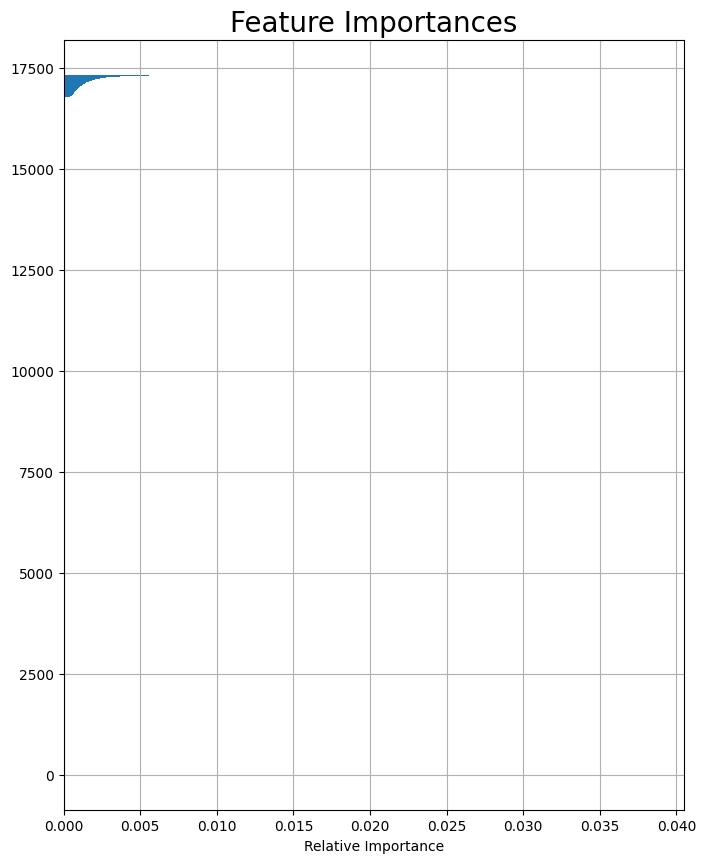

time: 38.6 s (started: 2023-08-04 10:47:10 +00:00)


In [ ]:
# Plotting the barplot to determine which feature is contributing the most
#features = x.columns
importances = XGB_classifier.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(8,10))
plt.grid(zorder=0)
plt.title('Feature Importances', fontsize=20)
plt.barh(range(len(indices)), importances[indices], align='center')
#plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance')

In [ ]:
# Instalation of shap
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.9/547.9 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 51.2 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.25.2
    Uninstalling numpy-1.25.2:
      Successfully uninstalled numpy-1.25.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pyldavis 3.4.1 requires numpy>=1.24.2, but you have numpy 1.23.5 which is incompatible.


time: 12.3 s (started: 2023-08-04 10:47:49 +00:00)


In [ ]:
# Checking the first observation
x_tst[0:1]

<1x17327 sparse matrix of type '<class 'numpy.float64'>'
	with 58 stored elements in Compressed Sparse Row format>

time: 7.63 ms (started: 2023-08-04 10:48:01 +00:00)


In [ ]:
# Import shap
import shap
#create an explainer for a tree-based model, i.e., random forest (rf)
expl = shap.TreeExplainer(XGB_classifier)
shap_values = expl.shap_values(x_tst)

time: 13.1 s (started: 2023-08-04 10:48:01 +00:00)


In [ ]:
shap.initjs() #initialize the JavaScript visualization in the notebook environment
shap.force_plot(expl.expected_value,shap_values=shap_values[0])

time: 136 ms (started: 2023-08-04 10:48:14 +00:00)


In [ ]:
# Actual value of  first observation
y_tst.head(1)

7253    1
Name: sentiment, dtype: int64

time: 4.57 ms (started: 2023-08-04 10:48:15 +00:00)


In [ ]:
# Probability of each class (0 and 1)
XGB_classifier.predict_proba(x_tst[0:1])

array([[0.03535962, 0.9646404 ]], dtype=float32)

time: 15.4 ms (started: 2023-08-04 10:48:15 +00:00)


In [ ]:
# Predicted value of  first observation
XGB_classifier.predict(x_tst[0:1])

array([1])

time: 28.5 ms (started: 2023-08-04 10:48:15 +00:00)


Since, the predicted probability value of first observation of test set is more for class 1 (0.60) so every feature is cotributing and shifting the prediction towards higher side(+ve) from the base value.

In [ ]:
#pass the second test sample
shap_values = expl.shap_values(x_tst[1:2])

time: 27.3 ms (started: 2023-08-04 10:48:15 +00:00)


In [ ]:
#initialize the JavaScript visualization in the notebook environment
shap.initjs()
shap.force_plot(expl.expected_value,shap_values=shap_values[0])

time: 132 ms (started: 2023-08-04 10:48:15 +00:00)


In [ ]:
# Actual value of  first observation
y_tst.head(2)

7253    1
5498    0
Name: sentiment, dtype: int64

time: 3.95 ms (started: 2023-08-04 10:48:15 +00:00)


In [ ]:
# Probability of each class (0 and 1)
XGB_classifier.predict_proba(x_tst[1:2])

array([[0.8504347, 0.1495653]], dtype=float32)

time: 14.5 ms (started: 2023-08-04 10:48:15 +00:00)


In [ ]:
# Predicted value of  second observation
XGB_classifier.predict(x_tst[1:2])

array([0])

time: 6.61 ms (started: 2023-08-04 10:48:15 +00:00)


Since, the predicted probability value of first observation of test set is more for class 0 (0.75) so every feature is cotributing and shifting the prediction towards positive side(+ve) from the base value.

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [ ]:
# Save the File
# Importing pickle module
import pickle

time: 665 µs (started: 2023-08-04 10:49:50 +00:00)


In [ ]:
# Save the File
filename='Zamato_Restaurant_Clustering.pkl'

# serialize process (wb=write byte)
pickle.dump(XGB_classifier,open(filename,'wb'))

time: 16.2 ms (started: 2023-08-04 10:49:53 +00:00)


### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [ ]:
# Load the File and predict unseen data.

# unserialize process (rb=read byte)
classification_model= pickle.load(open(filename,'rb'))

# Predicting the unseen data(test set)
classification_model.predict(x_tst)

array([1, 0, 0, ..., 1, 1, 1])

time: 48.1 ms (started: 2023-08-04 10:49:53 +00:00)


### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

#### **EDA Conclusion:**

Exploratory Data Analysis (EDA) is an important step as it allows for the initial analysis of a dataset. It helps in the identification of patterns, anomalies, and relationships in data, as well as the detection for possible concerns such as missing values or outliers. EDA helps in the generation of hypotheses and the development of more complex modelling approaches such as machine learning. It is also a fantastic approach to understand the facts, which is essential for good decision making. EDA also aids in providing a deeper understanding of the data and directing the path of additional investigation. Following EDA, we arrived at the following conclusions:
* Rating contain the **maximum in 5 star and slightly less in 4 star and minimum in 2 star** value distributed in the dataset.
* Review_Year feature having **almost total customer visit the resaturant in year of 2018 and 2019** and negligiable in 2017 and 2016 value distributed in the dataset.
* Review_Month contain the **maximum in 5th month(i.e May) and minimum in 6th month(i.e June)** value distributed in the dataset.

* we have to got the skewness of the data which feature having positive or negative skew. In continuous feature having Cost, Picture, Review_month, Reviewer_total_review and Reviewer_follower having positive skew value &  Rating, Review_Year and Review_Day having negative skew value.
* AB's - Absolute Barbecues, show maximum engagement and retention as it has maximum number of rating on average and Hotel Zara Hi-Fi show lowest engagement as has lowest average rating.

* Price point for high rated hotel AB's= Absolute Barbecues is 1500 and price point for low rated restaurant Hotel Zara Hi-Fi is 400.

* North Indian food followed by chinese are best or indeemand food as sold by most of the restaurants.

* Great Buffets is the most frequently used tags and other tags like great, best, north, Hyderabad is also used in large quantity.

* Satwinder singh is the most popular critic who has maximum number of follower and on an average he give 3.5 rating.

* restaurant Collage - Hyatt Hyderabad Gachibowli is most expensive restaurant in the locality which has a price of 2800 for order and has 3.5 average rating. Hotels like Amul and Mohammedia Shawarma are least expensive with price of 150 and has 3.9 average rating.

#### **ML Conclusion:**

Clustering and sentiment analysis were performed on a dataset of customer reviews for the food delivery service Zomato. The purpose of this analysis was to understand the customer's experience and gain insights about their feedback.

The clustering technique was applied to group customers based on their review text, and it was found that the customers were grouped into two clusters: positive and negative. This provided a general understanding of customer satisfaction levels, with the positive cluster indicating the highest level of satisfaction and the negative cluster indicating the lowest level of satisfaction.

Sentiment analysis was then applied to classify the review text as positive or negative. This provided a more detailed understanding of customer feedback and helped to identify specific areas where the service could be improved.

Overall, this analysis provided valuable insights into the customer's experience with Zomato, and it could be used to guide future business decisions and improve the service. Additionally, by combining clustering and sentiment analysis techniques, a more comprehensive understanding of customer feedback was achieved.

**Some recommendation based on the analysis**
* Based on negative reviews like some focused on issues with delivery time or food quality, the company should prioritize addressing these issues to imporve customer satisfaction.

* Based on the clustering, or user interaction customer should be given recommendations.

* Also use the clustering results to target specific customer segments and tailor marketing and promotional efforts accordingly.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***